In [1]:
import os
import sys
import torch
from transformers import BertTokenizer,squad_convert_examples_to_features, AutoConfig, AutoModelForQuestionAnswering
from transformers.data.processors.squad import SquadV2Processor
from torch.utils.data import DataLoader, RandomSampler
from tqdm import tqdm, trange
import matplotlib.pyplot as plt
#from ProbeAttention import *

In [2]:
model_dir = 'bert-base-uncased'
model_prefix = 'bert-base-uncased'
data_dir = ''
data_file = 'train-v2.0.json'
max_seq_length = 384
non_linear = "gelu"
project_dim = 200
layers = 12
hidden_dim = 768
epochs = 5
batch_size = 8
adam_epsilon = 1e-8
max_grad_norm = 0.1
dropout_r = 0.3
lr = 3e-5

In [3]:
# GPU
if torch.cuda.is_available():       
    device = 'cuda'
    print('We will use the GPU:', torch.cuda.get_device_name(0))
else:
    print('No GPU available, using the CPU instead.')
    device = 'cpu'

# Tokenizer
tokenizer = BertTokenizer.from_pretrained(model_prefix)

# Extract examples
processor = SquadV2Processor()
train_examples = processor.get_train_examples(data_dir=data_dir, filename=data_file)

We will use the GPU: GeForce GTX 1050 Ti with Max-Q Design


100%|███████████████████████████████████| 442/442 [00:41<00:00, 10.65it/s]


In [4]:
# Extract train features
print("Loading train features")
train_features, train_dataset = squad_convert_examples_to_features(
    examples=train_examples[0:50000],
    tokenizer=tokenizer,
    max_seq_length=max_seq_length,
    doc_stride=128,
    max_query_length=64,
    is_training=True,
    return_dataset="pt",
    threads=1,
)

Loading train features


convert squad examples to features: 100%|█| 50000/50000 [07:05<00:00, 117.
add example index and unique id: 100%|█| 50000/50000 [00:00<00:00, 1138290


In [5]:
# Initialize model
#from ProbeAttention import *

config = AutoConfig.from_pretrained(model_prefix, output_hidden_states = True)
model = AutoModelForQuestionAnswering.from_pretrained(model_prefix, config = config)

# multi-gpu evaluate one at here
model = model.to(device)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForQuestionAnswering: ['cls.predictions.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertForQuestionAnswering from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForQuestionAnswering from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of BertForQuestionAnswering were not initialized from the model checkpoint at bert-base-uncased a

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from transformers import AdamW
import numpy as np

class MultiHeadAttention(nn.Module):
    def __init__(self, in_dim, n_heads=4):
        super(MultiHeadAttention, self).__init__()   
        assert in_dim % n_heads == 0
        self.d = in_dim//n_heads
        self.n_heads = n_heads
        
        self.WQ = nn.Linear(in_dim, self.d * self.n_heads)
        self.WK = nn.Linear(in_dim, self.d * self.n_heads)
        self.WV = nn.Linear(in_dim, self.d * self.n_heads)
        
        self.linear = nn.Linear(self.n_heads * self.d, in_dim)
        self.layer_norm = nn.LayerNorm(in_dim)
        
    def forward(self, h): # (8, 384, 200)
        batch_size = h.shape[0]
        q_s = self.WQ(h).view(batch_size, -1, self.n_heads, self.d).transpose(1, 2) # (8, 4, 384, 50)
        k_s = self.WK(h).view(batch_size, -1, self.n_heads, self.d).transpose(1, 2)
        v_s = self.WV(h).view(batch_size, -1, self.n_heads, self.d).transpose(1, 2) 

        scores = torch.matmul(q_s, k_s.transpose(-1, -2)) / np.sqrt(self.d) #(8, 4, 384, 384)
        attn = F.softmax(scores, dim=-1) 
        context = torch.matmul(attn, v_s) #(8, 4, 384, 50)

        context = context.transpose(1, 2).contiguous().view(batch_size, -1, self.n_heads * self.d)
        output = self.linear(context)
        return self.layer_norm(output + h)
        

class Adapter(nn.Module):
    def __init__(self, in_dim, project_dim, p = dropout_r, max_seq = max_seq_length):
        super(Adapter, self).__init__()        
                
        self.project_down = nn.Linear(in_dim, project_dim)
        self.project_up = nn.Linear(project_dim, in_dim)
        self.dropout = nn.Dropout(p=p)
        self.batchnorm = nn.BatchNorm1d(max_seq)
        self.layernorm = nn.LayerNorm(in_dim, max_seq)
        self.attention = MultiHeadAttention(project_dim)
        
    def forward(self, h):
        h = self.project_down(h)
        h = self.batchnorm(h)
        h = self.attention(h)
        h = self.dropout(h)
        h = self.project_up(h)
        h = self.layernorm(h)
        
        return h

class AdapterModel(nn.Module):
    def __init__(self, in_dim, project_dim, max_seq=max_seq_length):
        super(AdapterModel, self).__init__()
        
        self.adapter_list = nn.ModuleList([Adapter(in_dim, project_dim) for i in range(12)])
        self.linear = nn.Linear(in_dim, 1)
        
    def forward(self, all_h):
        h = torch.zeros(all_h[0].size()).to(device)
            
        for i in range(12):
            h = self.adapter_list[i](all_h[i]+h)
        
        return self.linear(h).unsqueeze(0)

In [7]:
# Initialize adaptors
print("Initializing adaptors")
adaptor_s = AdapterModel(hidden_dim, project_dim)
adaptor_e = AdapterModel(hidden_dim, project_dim)

adaptor_s.to(device)
adaptor_e.to(device)

start_optimizer = AdamW(adaptor_s.parameters(), lr=lr, eps=adam_epsilon, correct_bias=False)
end_optimizer = AdamW(adaptor_e.parameters(), lr=lr, eps=adam_epsilon, correct_bias=False)

Initializing adaptors


In [8]:
# minimum loss
min_loss = 1000000000
    
# start & end hidden state
start_hidden={}
end_hidden={}

# create results folder
if not os.path.exists('results'):
        os.mkdir('results')
        
if not os.path.exists('results'+'/'+ model_prefix):
        os.mkdir('results'+'/'+ model_prefix)

Iteration:   0%|                                 | 0/6317 [00:00<?, ?it/s]

Training epoch: 1


Iteration:   2%|▎                    | 100/6317 [02:06<2:34:43,  1.49s/it]

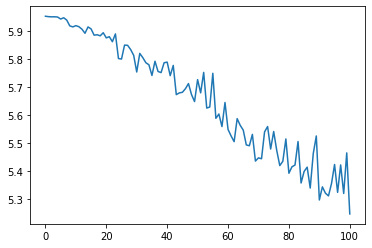

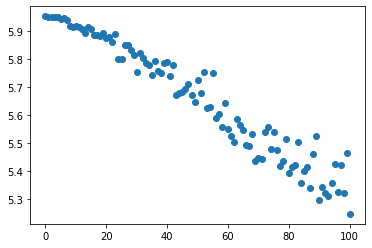

Iteration:   3%|▋                    | 200/6317 [04:12<2:12:02,  1.30s/it]

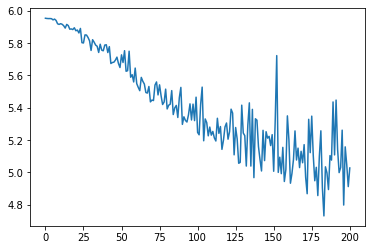

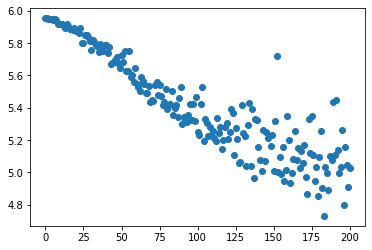

Iteration:   5%|▉                    | 300/6317 [05:57<1:41:48,  1.02s/it]

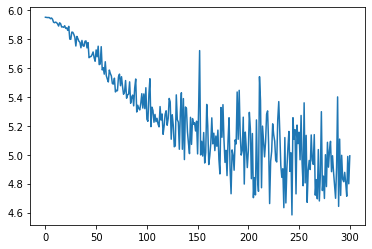

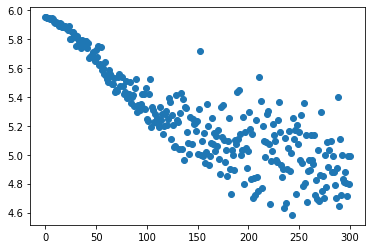

Iteration:   6%|█▎                   | 400/6317 [07:51<1:42:02,  1.03s/it]

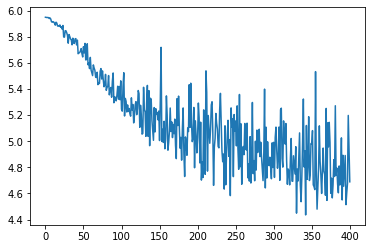

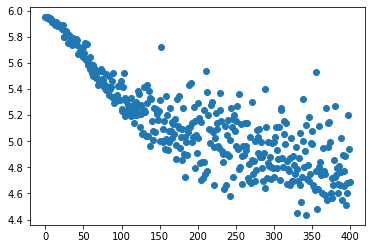

Iteration:   8%|█▋                   | 500/6317 [09:46<1:45:49,  1.09s/it]

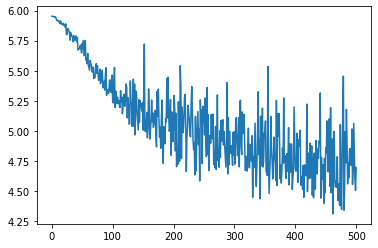

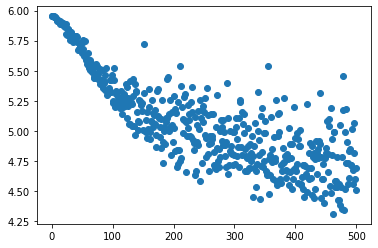

Iteration:   9%|█▉                   | 600/6317 [11:39<2:11:19,  1.38s/it]

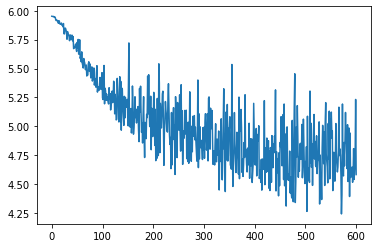

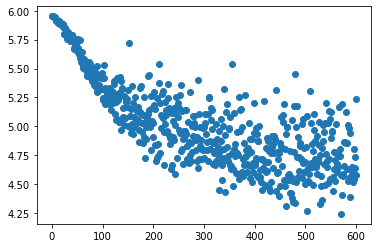

Iteration:  11%|██▎                  | 700/6317 [13:30<1:58:35,  1.27s/it]

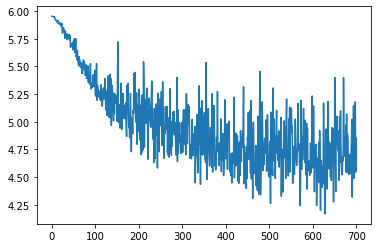

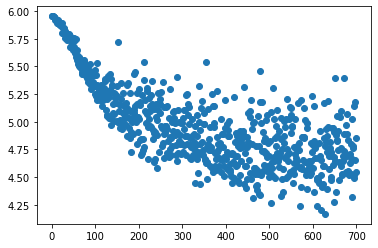

Iteration:  13%|██▋                  | 800/6317 [15:27<1:36:37,  1.05s/it]

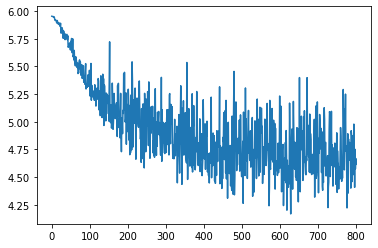

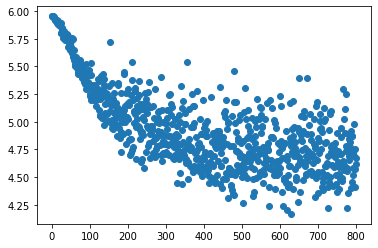

Iteration:  14%|██▉                  | 900/6317 [17:20<1:56:26,  1.29s/it]

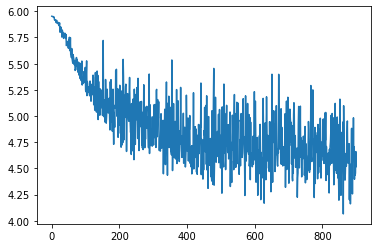

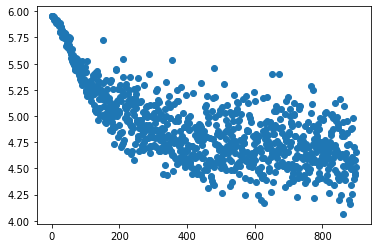

Iteration:  16%|███▏                | 1000/6317 [19:08<1:32:41,  1.05s/it]

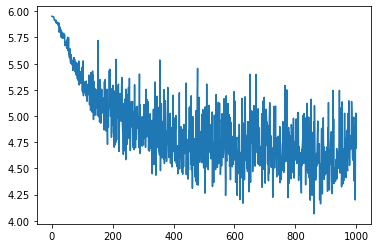

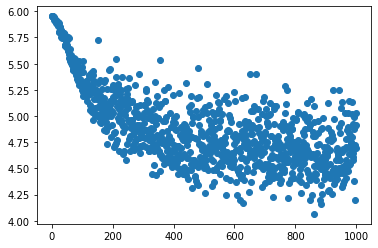

Iteration:  17%|███▍                | 1100/6317 [20:58<1:35:52,  1.10s/it]

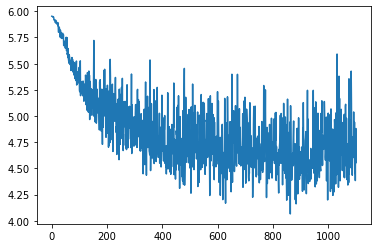

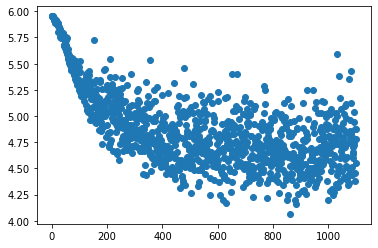

Iteration:  19%|███▊                | 1200/6317 [23:00<1:28:39,  1.04s/it]

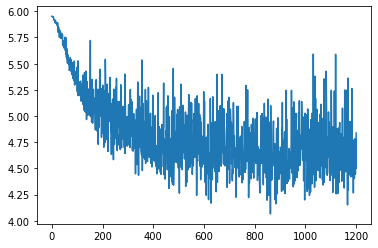

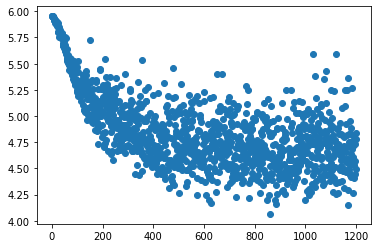

Iteration:  21%|████                | 1300/6317 [24:53<2:08:01,  1.53s/it]

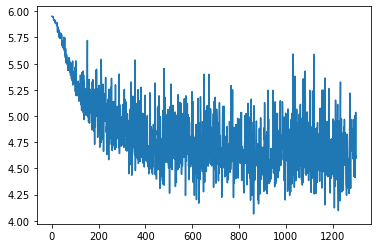

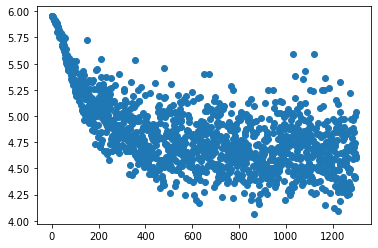

Iteration:  22%|████▍               | 1400/6317 [26:54<2:00:56,  1.48s/it]

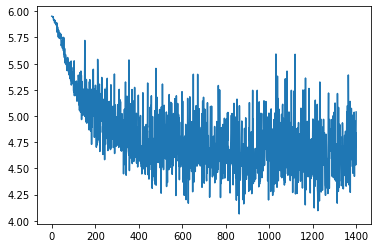

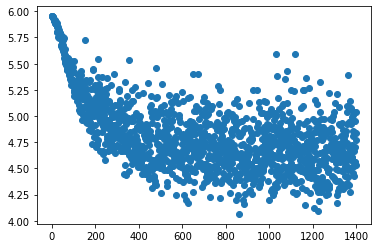

Iteration:  24%|████▋               | 1500/6317 [28:37<1:34:14,  1.17s/it]

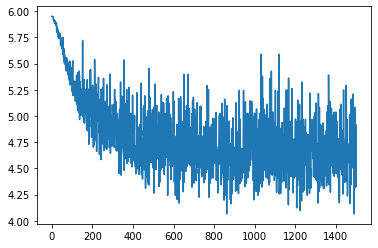

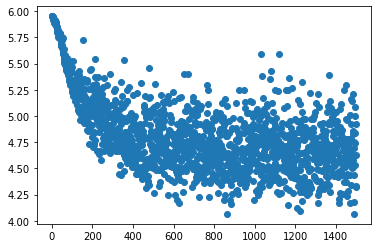

Iteration:  25%|█████               | 1600/6317 [30:38<1:28:22,  1.12s/it]

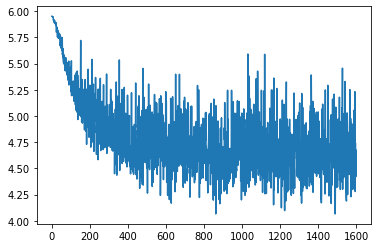

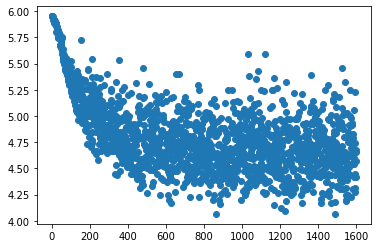

Iteration:  27%|█████▍              | 1700/6317 [32:33<1:25:16,  1.11s/it]

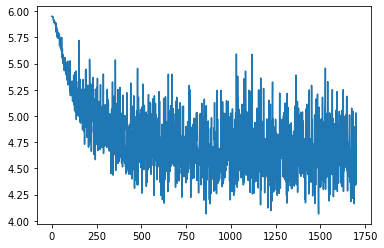

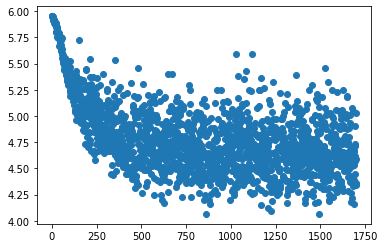

Iteration:  28%|█████▋              | 1800/6317 [34:24<1:20:14,  1.07s/it]

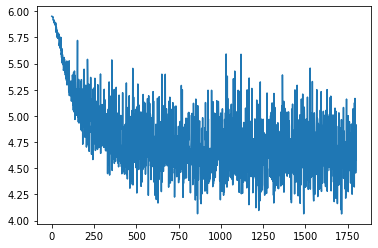

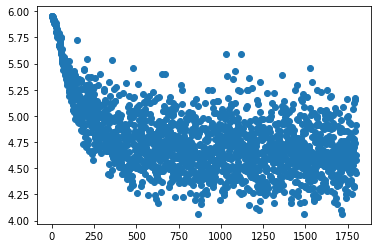

Iteration:  30%|██████              | 1900/6317 [36:18<1:47:34,  1.46s/it]

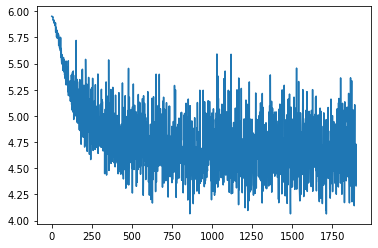

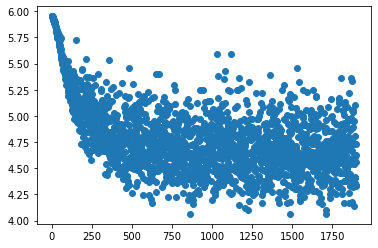

Iteration:  32%|██████▎             | 2000/6317 [38:19<1:34:11,  1.31s/it]

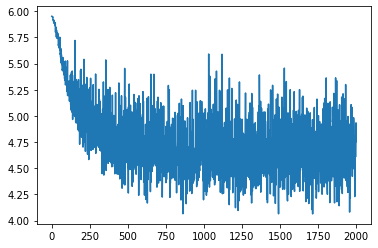

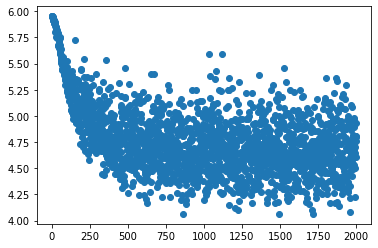

Iteration:  33%|██████▋             | 2100/6317 [40:11<1:16:29,  1.09s/it]

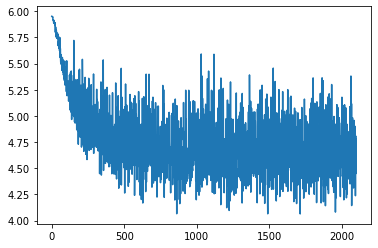

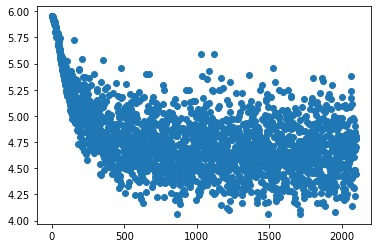

Iteration:  35%|██████▉             | 2200/6317 [42:09<1:16:31,  1.12s/it]

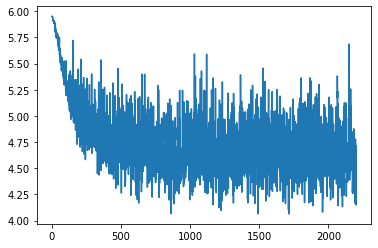

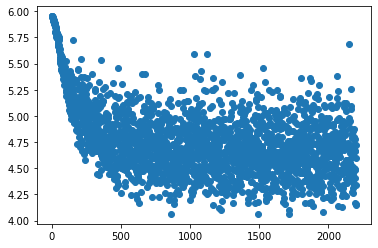

Iteration:  36%|███████▎            | 2300/6317 [43:59<1:17:02,  1.15s/it]

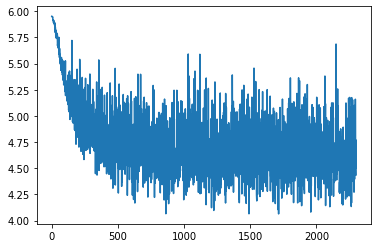

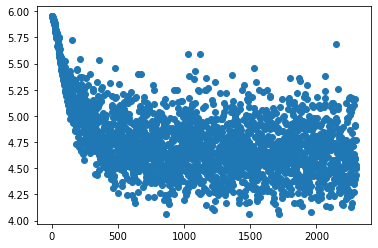

Iteration:  38%|███████▌            | 2400/6317 [45:51<1:27:23,  1.34s/it]

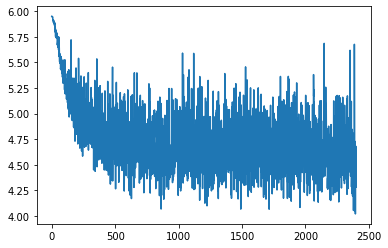

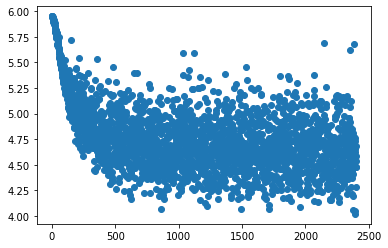

Iteration:  40%|███████▉            | 2500/6317 [47:49<1:14:49,  1.18s/it]

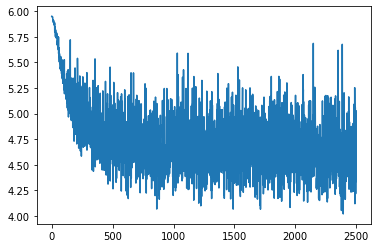

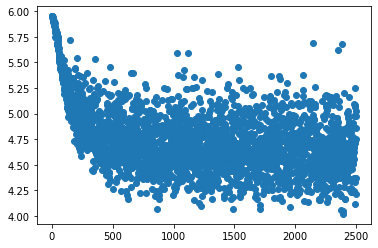

Iteration:  41%|████████▏           | 2600/6317 [49:50<1:24:57,  1.37s/it]

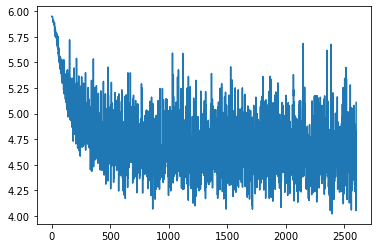

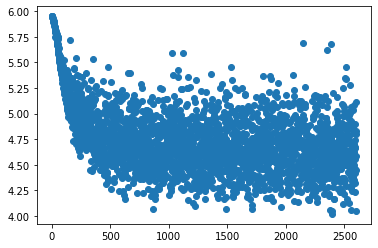

Iteration:  43%|████████▌           | 2700/6317 [51:48<1:28:01,  1.46s/it]

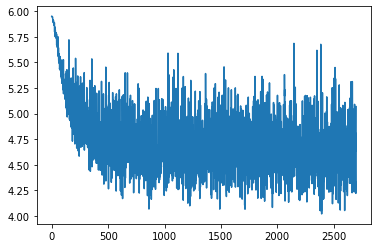

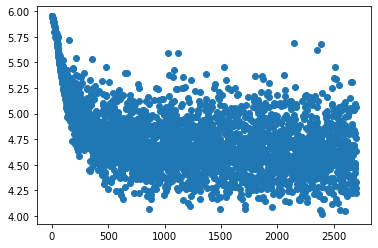

Iteration:  44%|████████▊           | 2800/6317 [53:47<1:20:08,  1.37s/it]

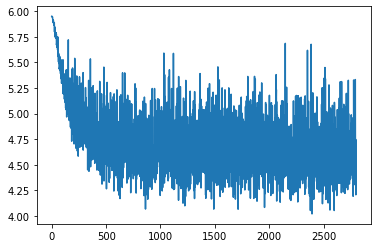

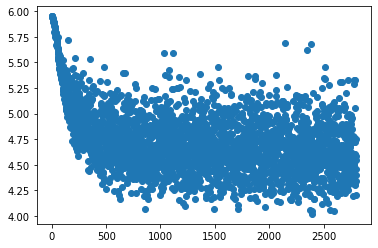

Iteration:  46%|█████████▏          | 2900/6317 [55:40<1:05:10,  1.14s/it]

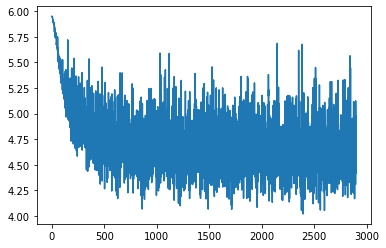

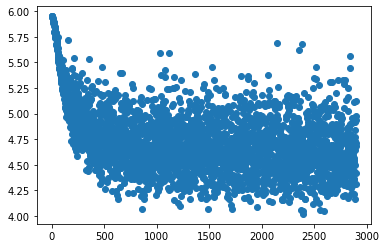

Iteration:  47%|█████████▍          | 3000/6317 [57:36<1:04:35,  1.17s/it]

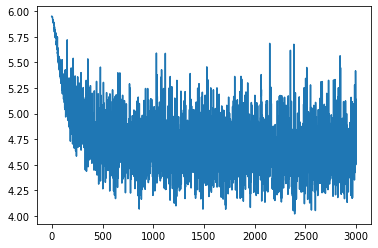

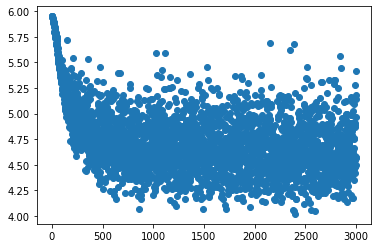

Iteration:  49%|█████████▊          | 3100/6317 [59:30<1:19:37,  1.49s/it]

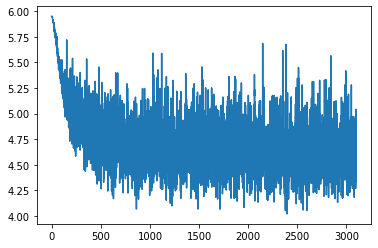

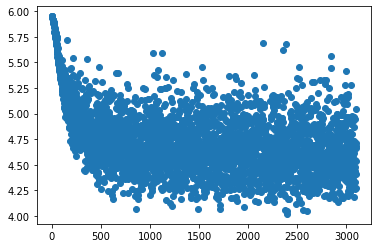

Iteration:  51%|█████████         | 3200/6317 [1:01:26<1:12:50,  1.40s/it]

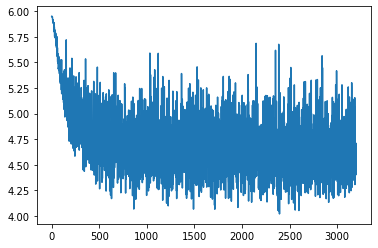

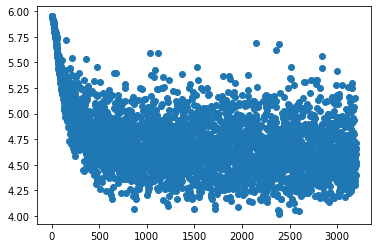

Iteration:  52%|█████████▍        | 3300/6317 [1:03:31<1:09:03,  1.37s/it]

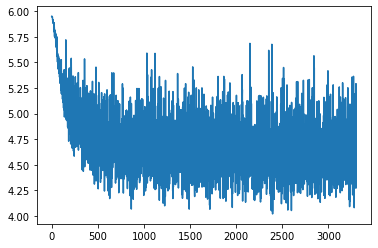

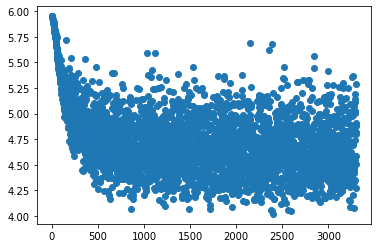

Iteration:  54%|█████████▋        | 3400/6317 [1:05:30<1:10:33,  1.45s/it]

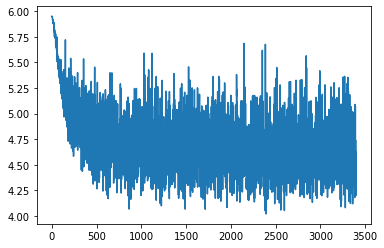

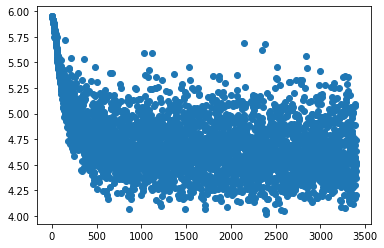

Iteration:  55%|█████████▉        | 3500/6317 [1:07:25<1:04:53,  1.38s/it]

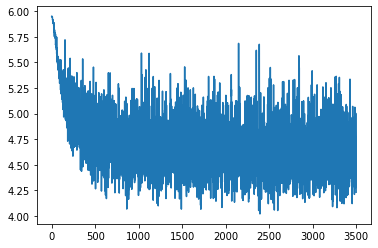

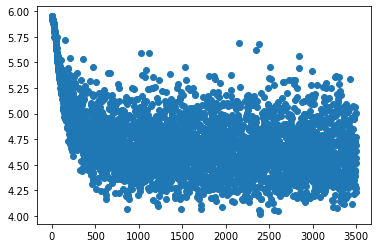

Iteration:  57%|██████████▎       | 3600/6317 [1:09:27<1:00:26,  1.33s/it]

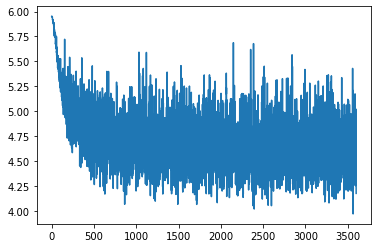

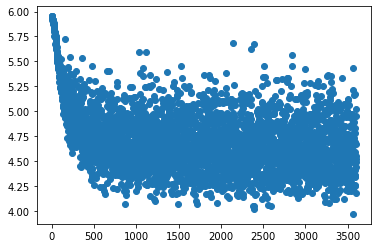

Iteration:  59%|███████████▋        | 3700/6317 [1:11:35<58:41,  1.35s/it]

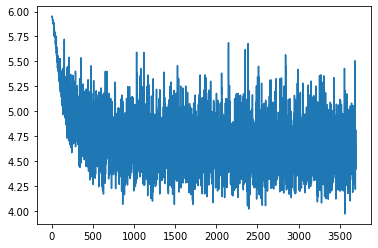

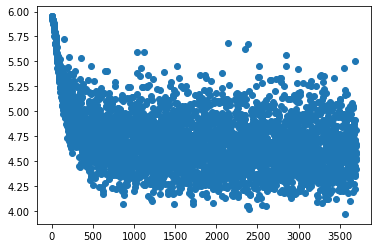

Iteration:  60%|████████████        | 3800/6317 [1:13:30<44:46,  1.07s/it]

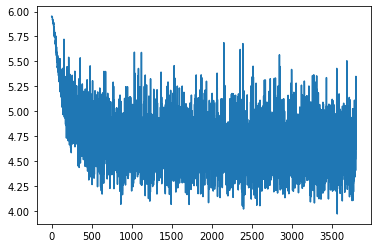

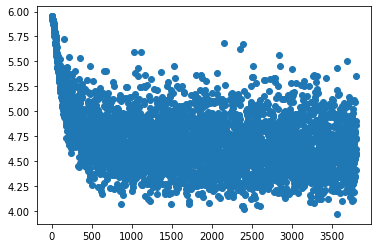

Iteration:  62%|████████████▎       | 3900/6317 [1:15:31<55:53,  1.39s/it]

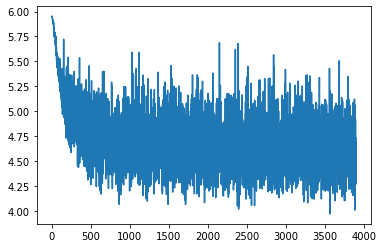

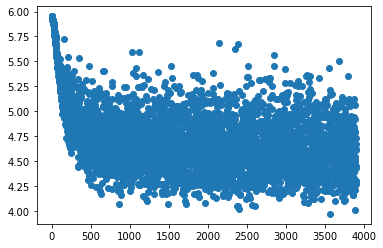

Iteration:  63%|████████████▋       | 4000/6317 [1:17:36<51:15,  1.33s/it]

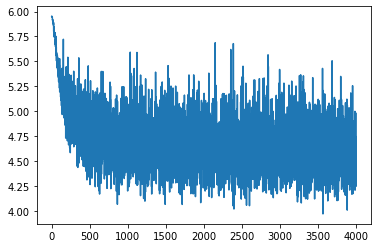

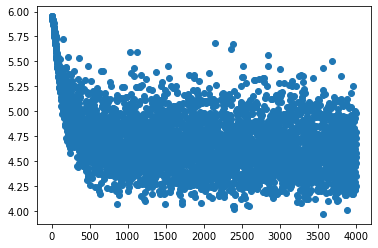

Iteration:  65%|████████████▉       | 4100/6317 [1:19:35<39:13,  1.06s/it]

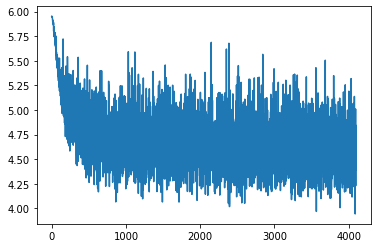

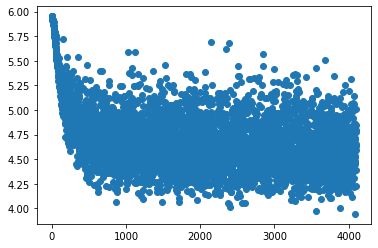

Iteration:  66%|█████████████▎      | 4200/6317 [1:21:33<45:21,  1.29s/it]

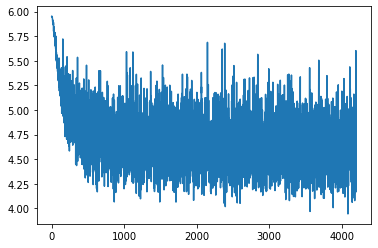

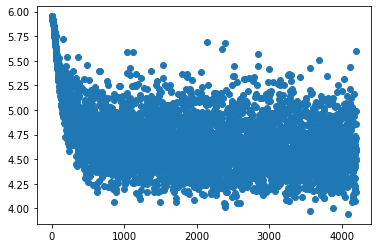

Iteration:  68%|█████████████▌      | 4300/6317 [1:23:31<35:41,  1.06s/it]

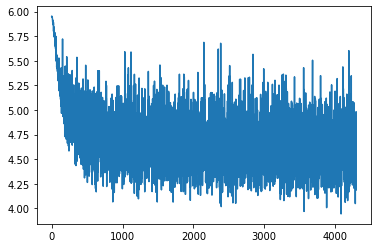

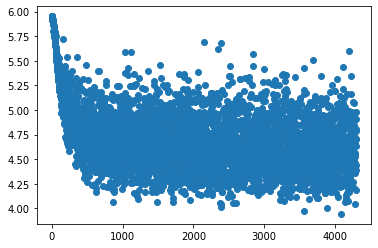

Iteration:  70%|█████████████▉      | 4400/6317 [1:25:32<33:54,  1.06s/it]

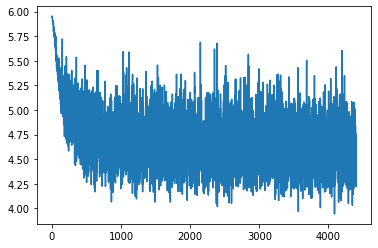

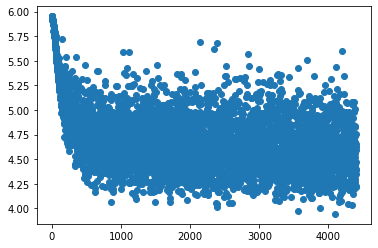

Iteration:  71%|██████████████▏     | 4500/6317 [1:27:33<32:04,  1.06s/it]

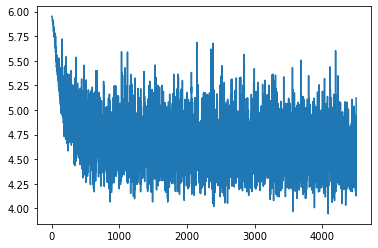

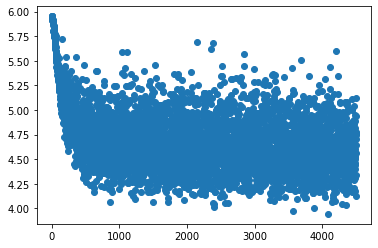

Iteration:  73%|██████████████▌     | 4600/6317 [1:29:38<38:04,  1.33s/it]

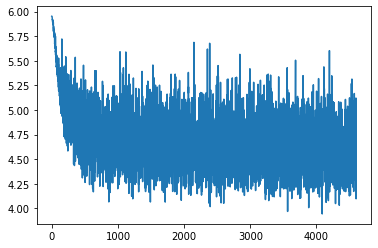

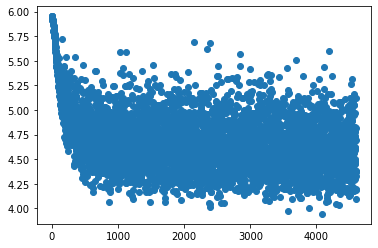

Iteration:  74%|██████████████▉     | 4700/6317 [1:31:35<28:44,  1.07s/it]

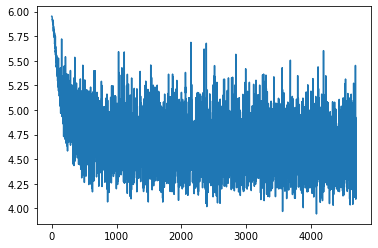

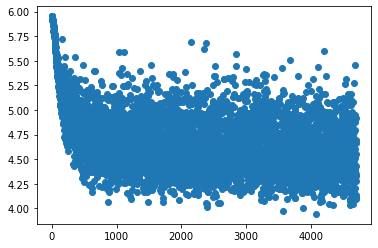

Iteration:  76%|███████████████▏    | 4800/6317 [1:33:37<37:08,  1.47s/it]

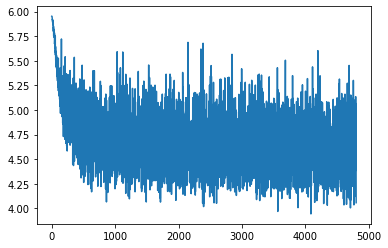

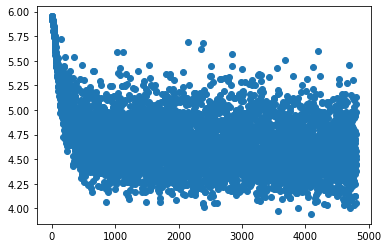

Iteration:  78%|███████████████▌    | 4900/6317 [1:35:42<32:36,  1.38s/it]

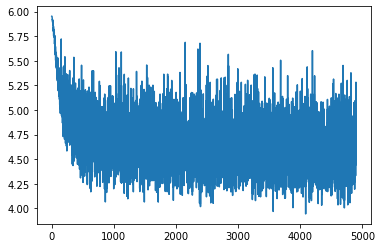

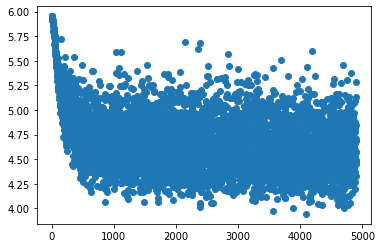

Iteration:  79%|███████████████▊    | 5000/6317 [1:37:54<31:49,  1.45s/it]

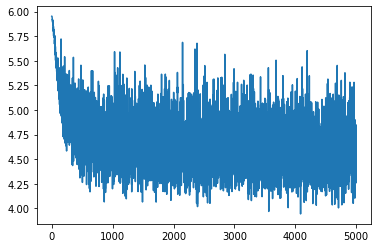

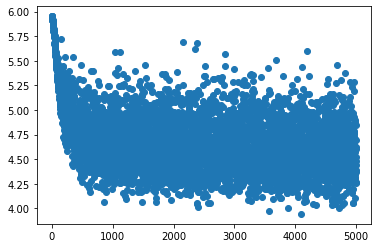

Iteration:  81%|████████████████▏   | 5100/6317 [1:40:02<23:57,  1.18s/it]

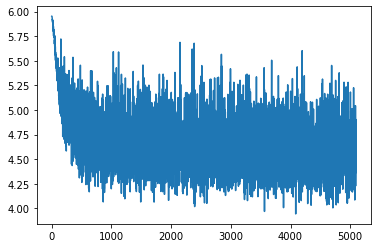

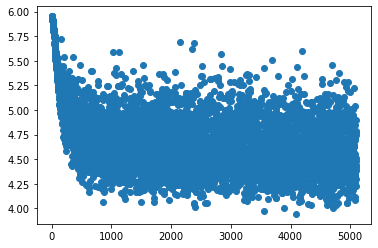

Iteration:  82%|████████████████▍   | 5200/6317 [1:42:06<19:54,  1.07s/it]

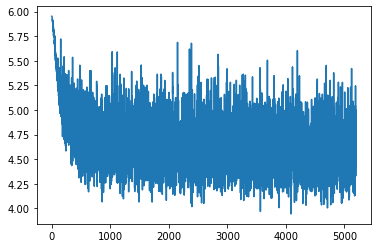

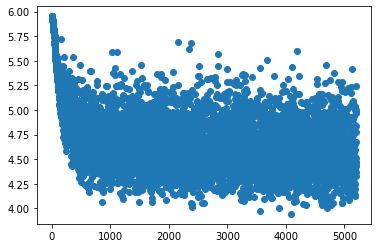

Iteration:  84%|████████████████▊   | 5300/6317 [1:44:07<24:06,  1.42s/it]

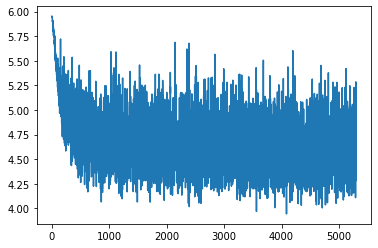

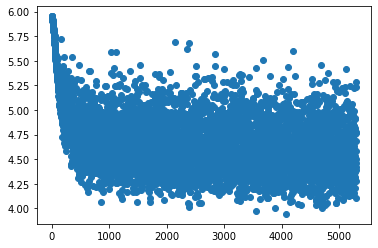

Iteration:  85%|█████████████████   | 5400/6317 [1:46:16<28:36,  1.87s/it]

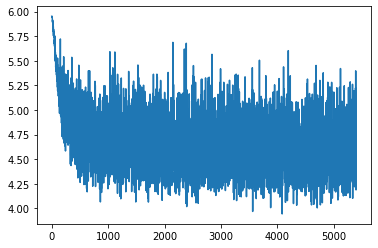

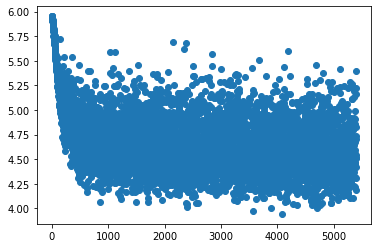

Iteration:  87%|█████████████████▍  | 5500/6317 [1:48:16<14:31,  1.07s/it]

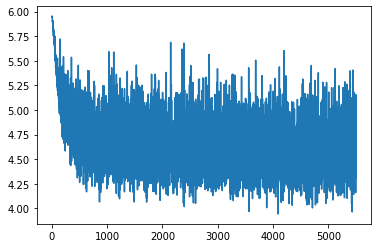

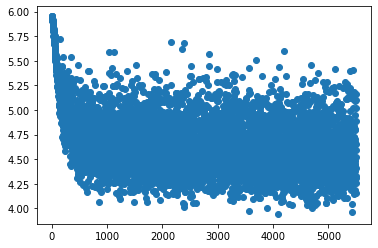

Iteration:  89%|█████████████████▋  | 5600/6317 [1:50:19<12:59,  1.09s/it]

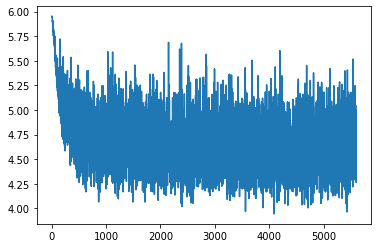

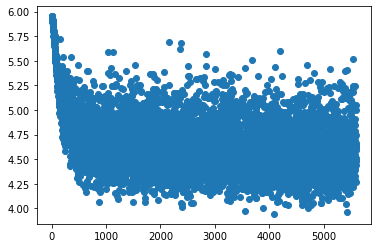

Iteration:  90%|██████████████████  | 5700/6317 [1:52:20<13:21,  1.30s/it]

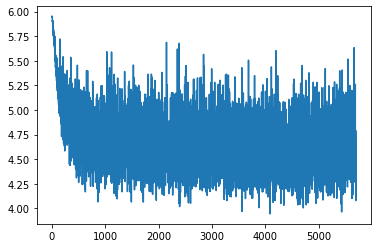

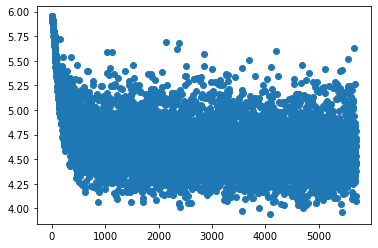

Iteration:  92%|██████████████████▎ | 5800/6317 [1:54:17<09:12,  1.07s/it]

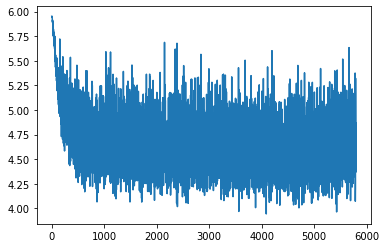

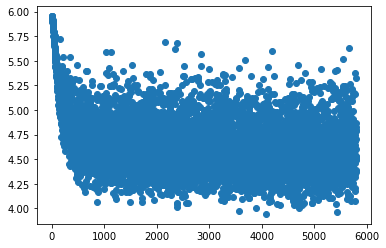

Iteration:  93%|██████████████████▋ | 5900/6317 [1:56:27<09:26,  1.36s/it]

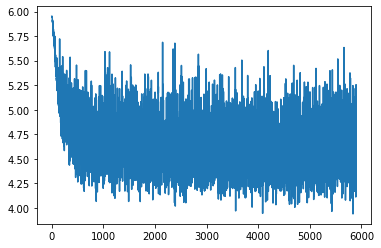

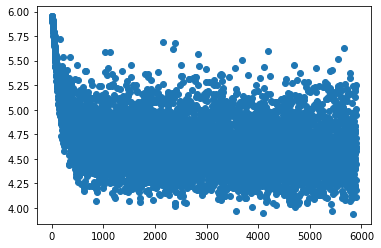

Iteration:  95%|██████████████████▉ | 6000/6317 [1:58:34<06:02,  1.14s/it]

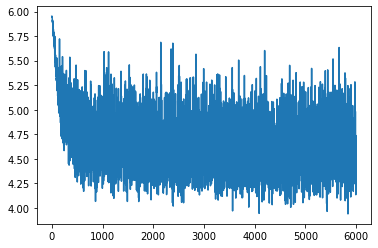

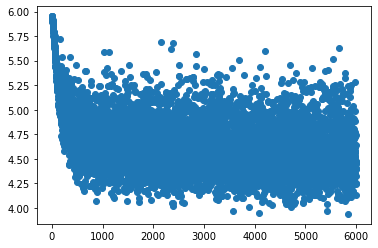

Iteration:  97%|███████████████████▎| 6100/6317 [2:00:36<04:54,  1.36s/it]

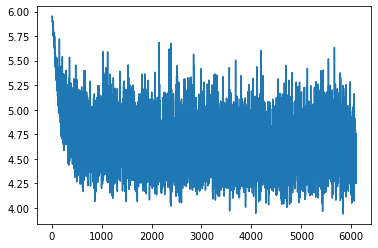

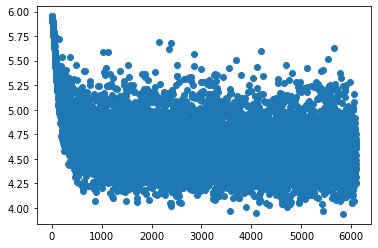

Iteration:  98%|███████████████████▋| 6200/6317 [2:02:34<02:03,  1.06s/it]

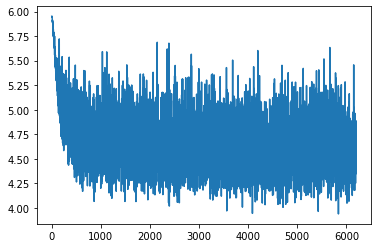

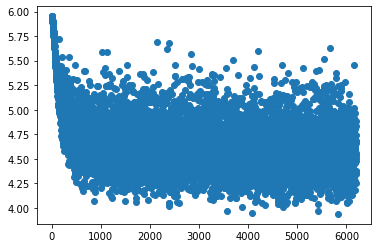

Iteration: 100%|███████████████████▉| 6300/6317 [2:04:39<00:24,  1.47s/it]

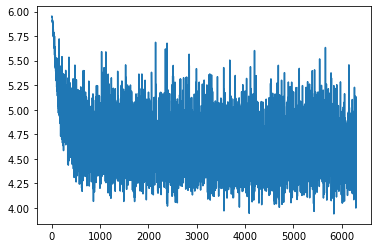

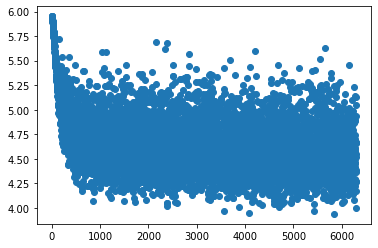

Iteration:   0%|                                 | 0/6317 [00:00<?, ?it/s]

Epoch loss 29429.711259126663
Epoch 1 complete, saving probes
Training epoch: 2


Iteration:   2%|▎                    | 100/6317 [02:03<1:52:48,  1.09s/it]

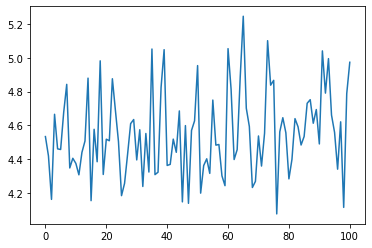

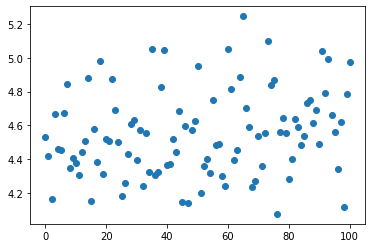

Iteration:   3%|▋                    | 200/6317 [04:09<2:23:32,  1.41s/it]

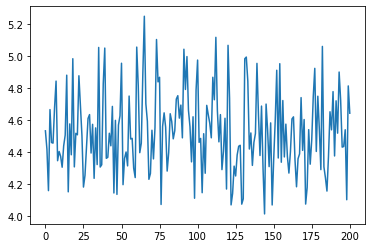

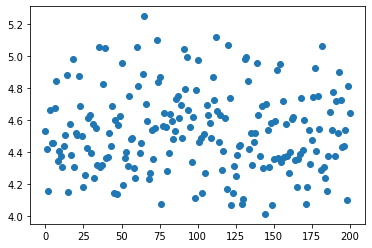

Iteration:   5%|▉                    | 300/6317 [06:12<2:06:08,  1.26s/it]

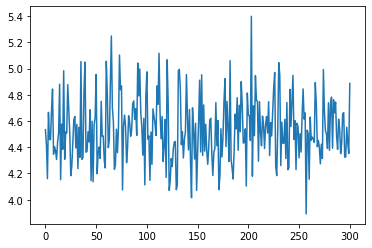

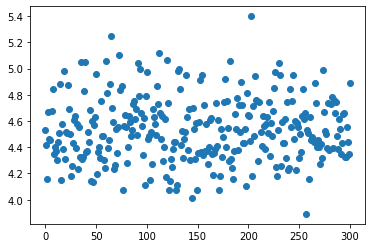

Iteration:   6%|█▎                   | 400/6317 [08:15<1:47:27,  1.09s/it]

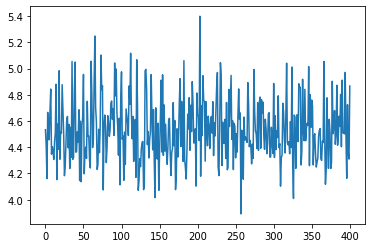

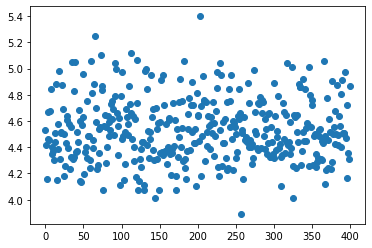

Iteration:   8%|█▋                   | 500/6317 [10:22<1:56:47,  1.20s/it]

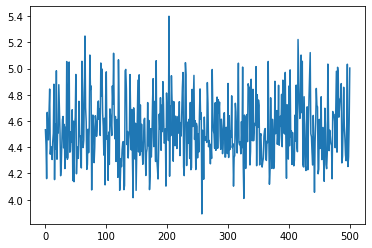

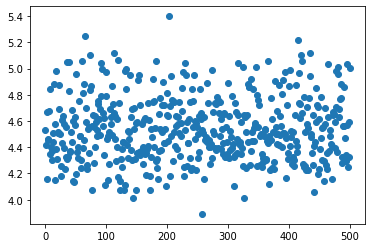

Iteration:   9%|█▉                   | 600/6317 [12:18<1:40:45,  1.06s/it]

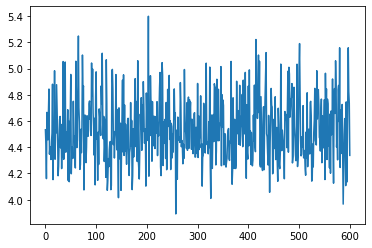

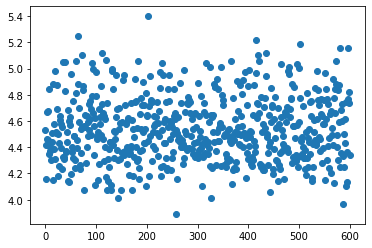

Iteration:  11%|██▎                  | 700/6317 [14:25<2:11:31,  1.40s/it]

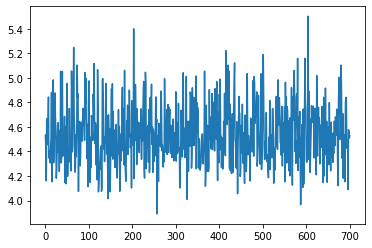

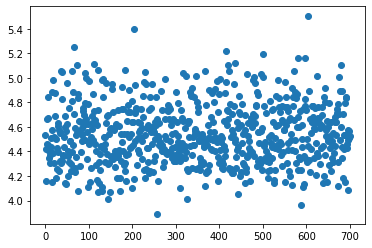

Iteration:  13%|██▋                  | 800/6317 [16:25<2:08:32,  1.40s/it]

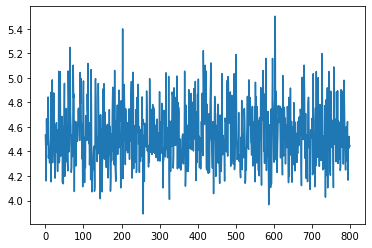

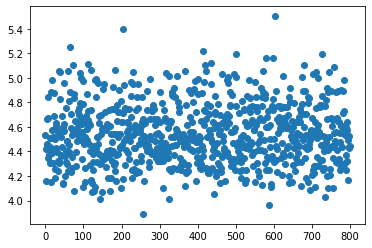

Iteration:  14%|██▉                  | 900/6317 [18:26<1:41:12,  1.12s/it]

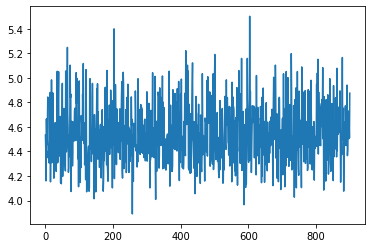

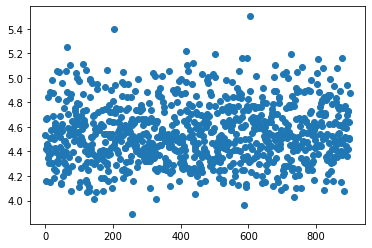

Iteration:  16%|███▏                | 1000/6317 [20:33<1:53:50,  1.28s/it]

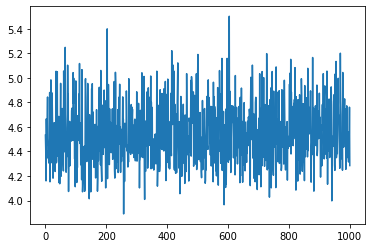

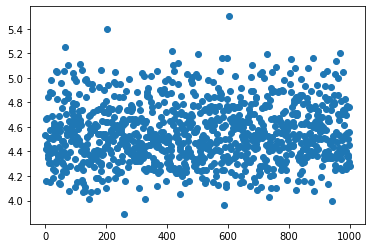

Iteration:  17%|███▍                | 1100/6317 [22:33<1:56:33,  1.34s/it]

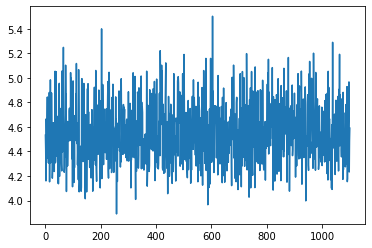

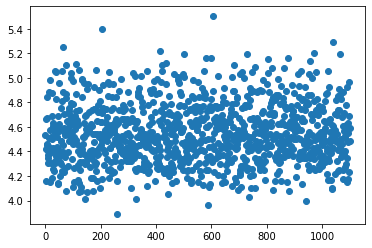

Iteration:  19%|███▊                | 1200/6317 [24:23<1:30:58,  1.07s/it]

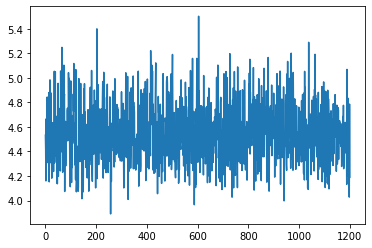

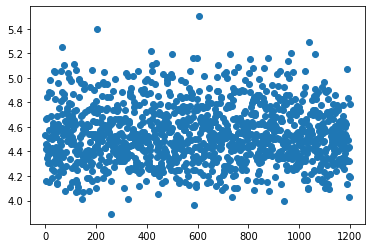

Iteration:  21%|████                | 1300/6317 [26:30<1:37:34,  1.17s/it]

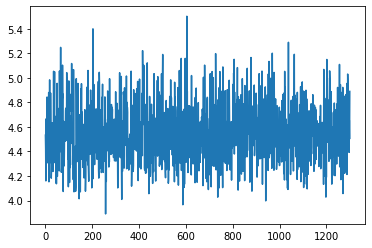

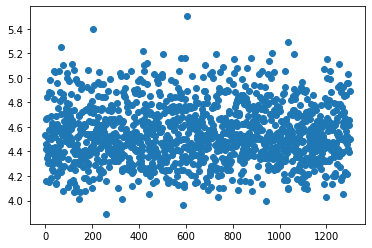

Iteration:  22%|████▍               | 1400/6317 [28:36<1:59:28,  1.46s/it]

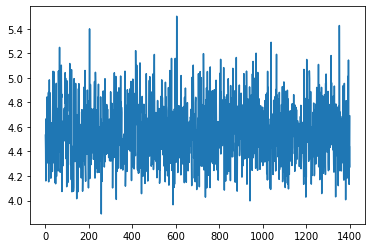

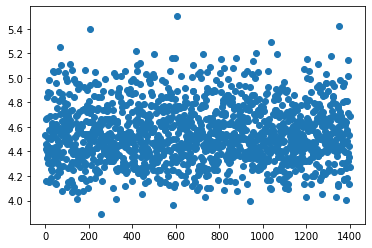

Iteration:  24%|████▋               | 1500/6317 [30:38<1:30:15,  1.12s/it]

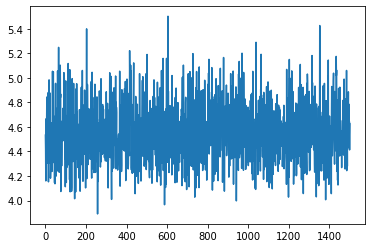

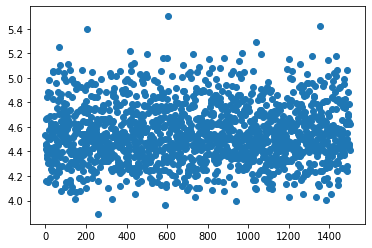

Iteration:  25%|█████               | 1600/6317 [32:39<1:46:52,  1.36s/it]

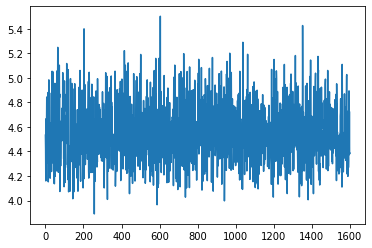

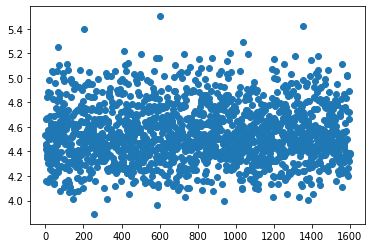

Iteration:  27%|█████▍              | 1700/6317 [34:41<1:40:07,  1.30s/it]

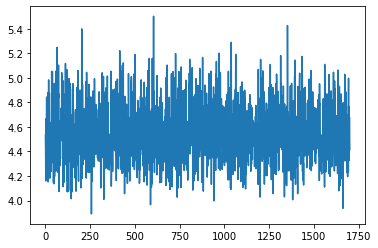

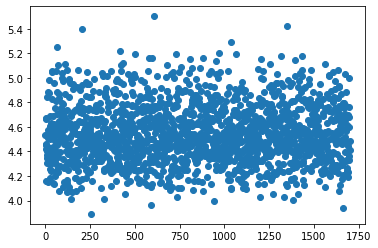

Iteration:  28%|█████▋              | 1800/6317 [36:51<1:43:46,  1.38s/it]

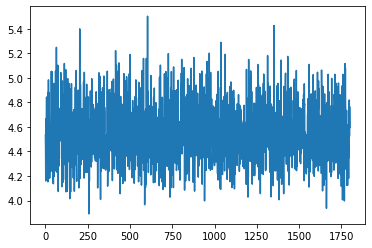

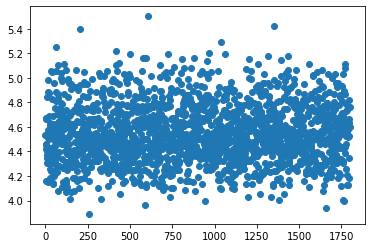

Iteration:  30%|██████              | 1900/6317 [38:52<1:45:19,  1.43s/it]

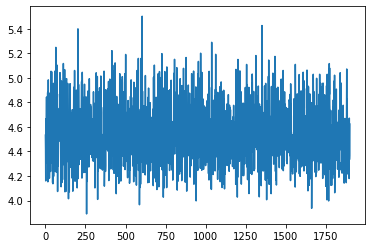

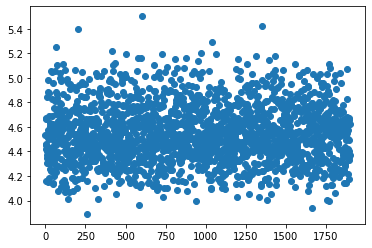

Iteration:  32%|██████▎             | 2000/6317 [40:57<1:17:53,  1.08s/it]

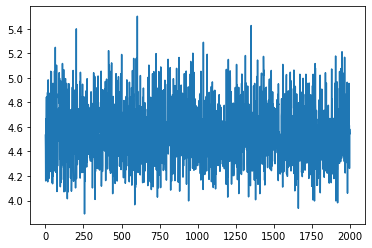

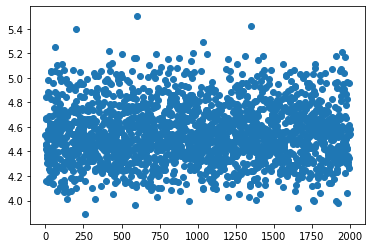

Iteration:  33%|██████▋             | 2100/6317 [43:00<1:28:33,  1.26s/it]

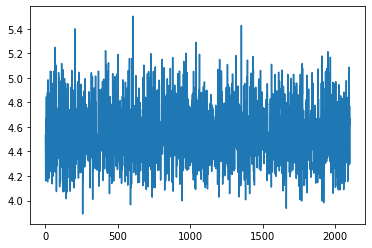

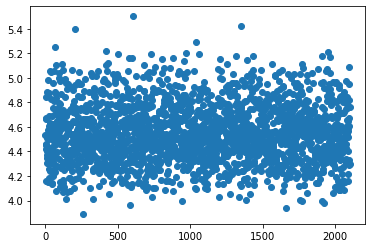

Iteration:  35%|██████▉             | 2200/6317 [45:10<1:13:22,  1.07s/it]

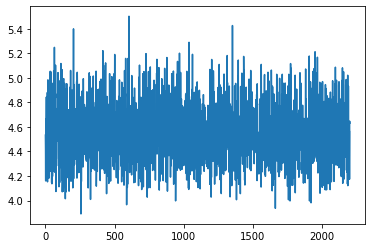

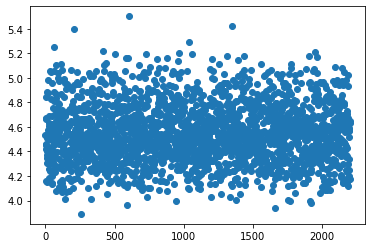

Iteration:  36%|███████▎            | 2300/6317 [47:07<1:29:37,  1.34s/it]

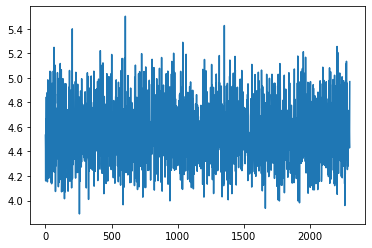

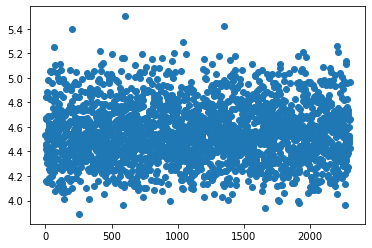

Iteration:  38%|███████▌            | 2400/6317 [49:15<1:25:37,  1.31s/it]

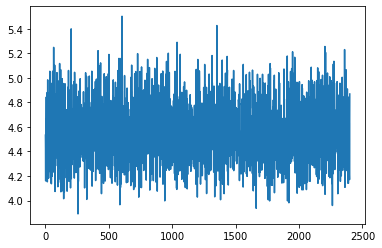

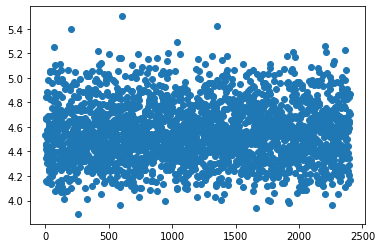

Iteration:  40%|███████▉            | 2500/6317 [51:21<1:26:04,  1.35s/it]

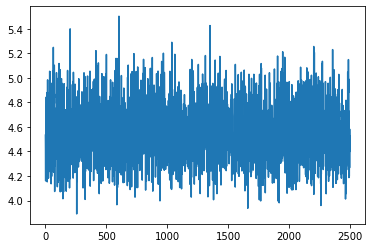

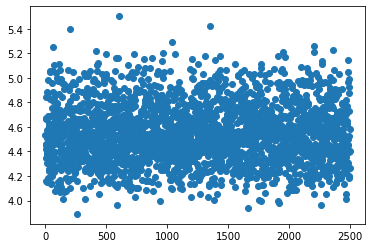

Iteration:  41%|████████▏           | 2600/6317 [53:27<1:13:25,  1.19s/it]

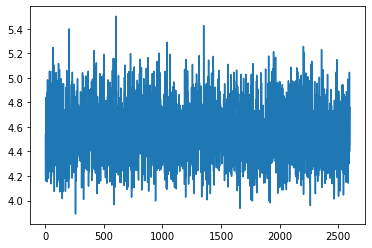

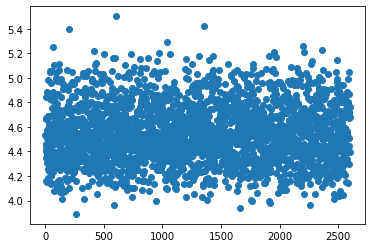

Iteration:  43%|████████▌           | 2700/6317 [55:30<1:28:43,  1.47s/it]

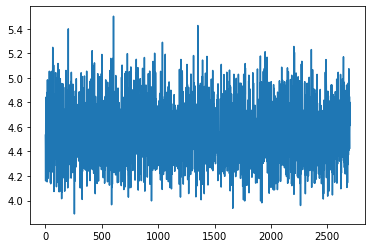

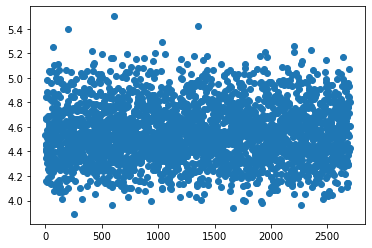

Iteration:  44%|████████▊           | 2800/6317 [57:29<1:19:55,  1.36s/it]

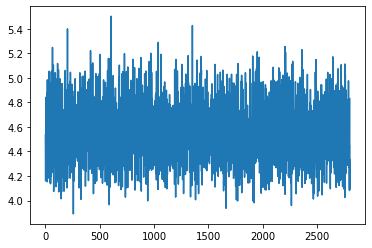

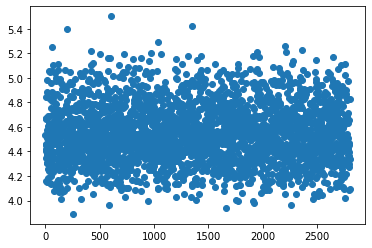

Iteration:  46%|█████████▏          | 2900/6317 [59:35<1:00:31,  1.06s/it]

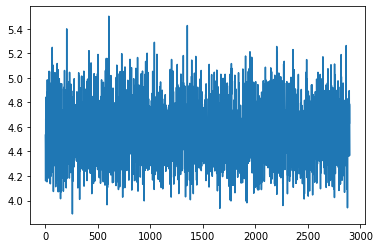

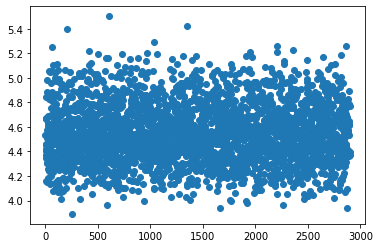

Iteration:  47%|█████████▍          | 3000/6317 [1:01:31<58:44,  1.06s/it]

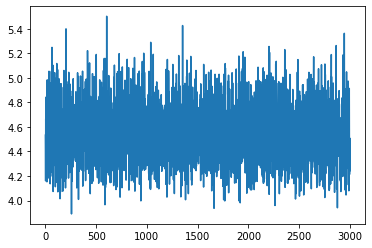

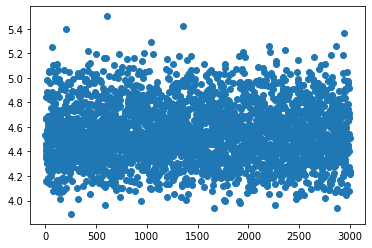

Iteration:  49%|█████████▊          | 3100/6317 [1:03:29<57:30,  1.07s/it]

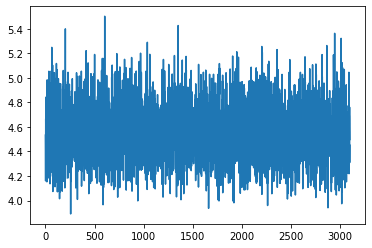

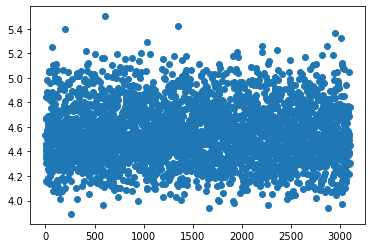

Iteration:  51%|██████████▏         | 3200/6317 [1:05:36<54:53,  1.06s/it]

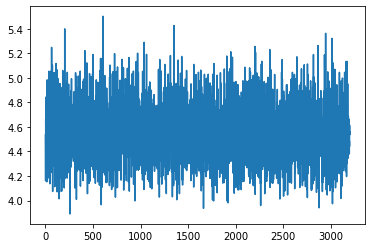

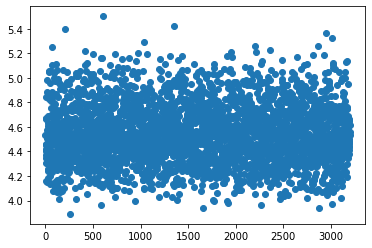

Iteration:  52%|█████████▍        | 3300/6317 [1:07:44<1:07:59,  1.35s/it]

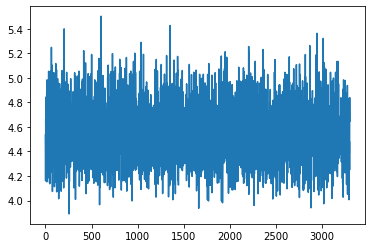

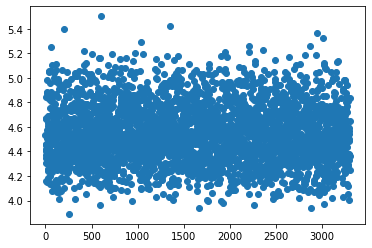

Iteration:  54%|█████████▋        | 3400/6317 [1:09:50<1:09:54,  1.44s/it]

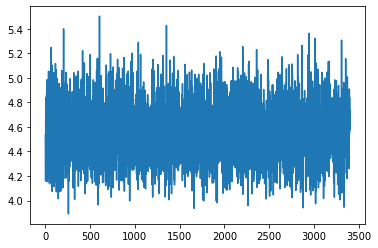

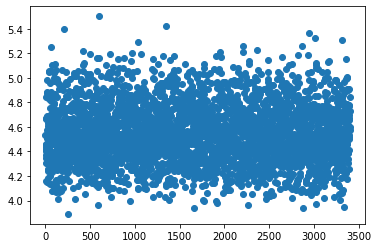

Iteration:  55%|█████████▉        | 3500/6317 [1:11:57<1:01:02,  1.30s/it]

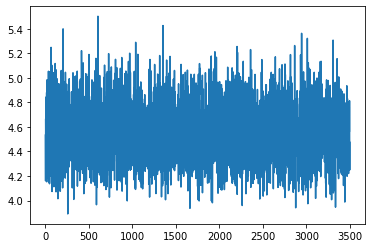

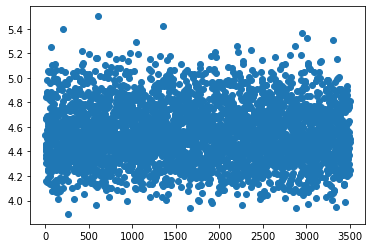

Iteration:  57%|██████████▎       | 3600/6317 [1:14:02<1:01:23,  1.36s/it]

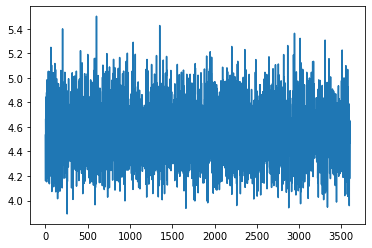

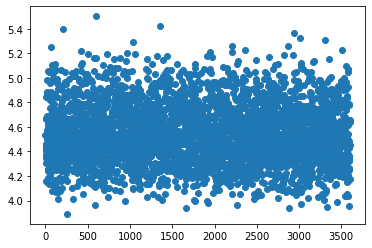

Iteration:  59%|███████████▋        | 3700/6317 [1:16:06<51:18,  1.18s/it]

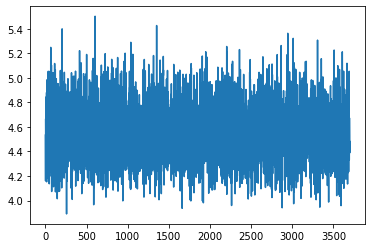

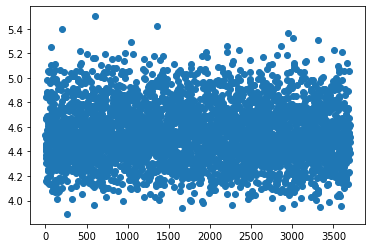

Iteration:  60%|████████████        | 3800/6317 [1:18:15<45:13,  1.08s/it]

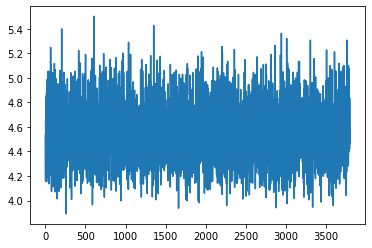

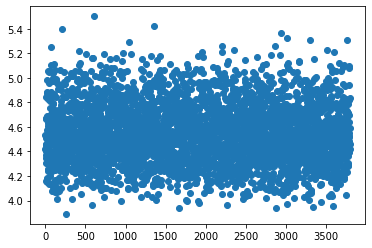

Iteration:  62%|████████████▎       | 3900/6317 [1:20:18<48:46,  1.21s/it]

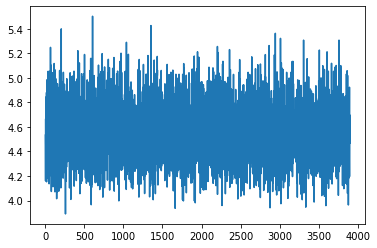

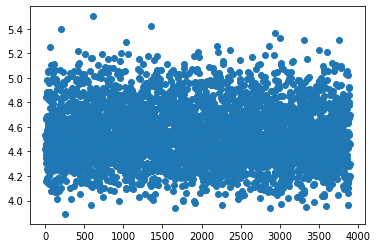

Iteration:  63%|████████████▋       | 4000/6317 [1:22:30<42:29,  1.10s/it]

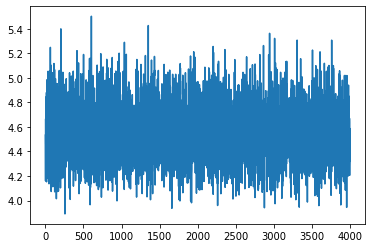

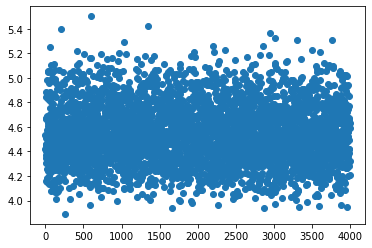

Iteration:  65%|████████████▉       | 4100/6317 [1:24:37<40:21,  1.09s/it]

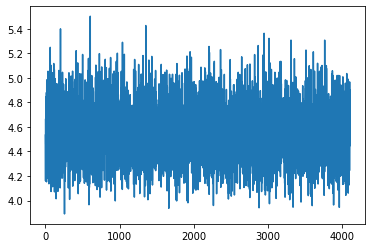

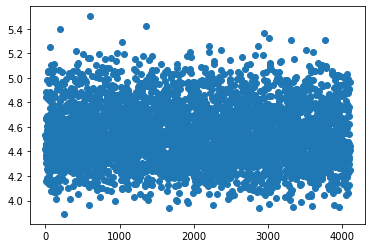

Iteration:  66%|█████████████▎      | 4200/6317 [1:26:43<49:53,  1.41s/it]

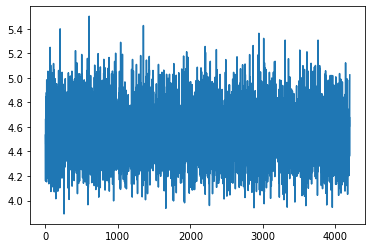

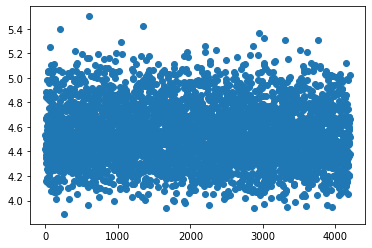

Iteration:  68%|█████████████▌      | 4300/6317 [1:28:51<39:10,  1.17s/it]

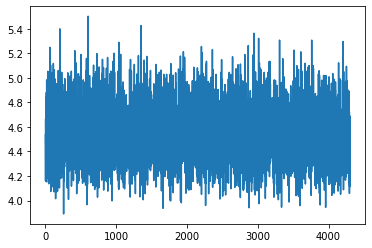

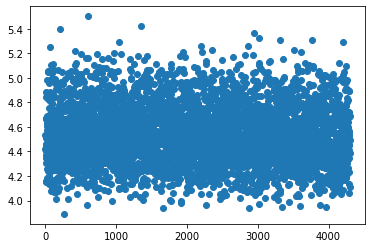

Iteration:  70%|█████████████▉      | 4400/6317 [1:30:51<43:08,  1.35s/it]

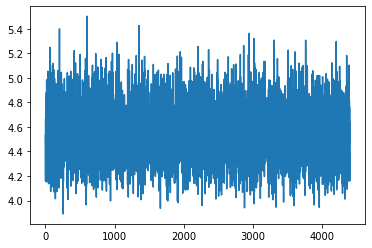

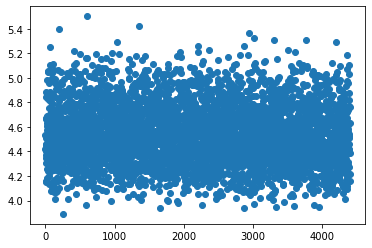

Iteration:  71%|██████████████▏     | 4500/6317 [1:32:51<43:43,  1.44s/it]

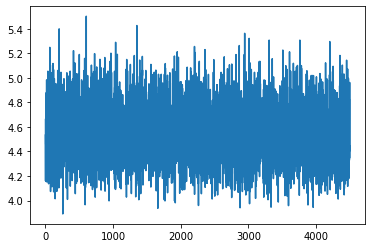

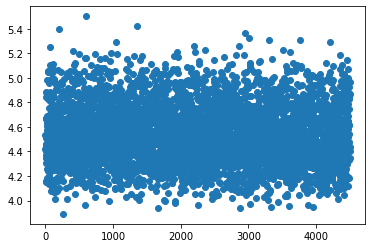

Iteration:  73%|██████████████▌     | 4600/6317 [1:34:55<31:40,  1.11s/it]

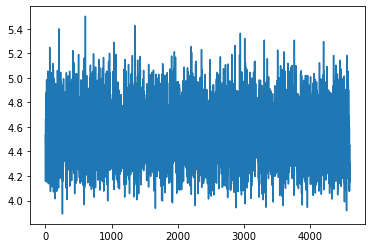

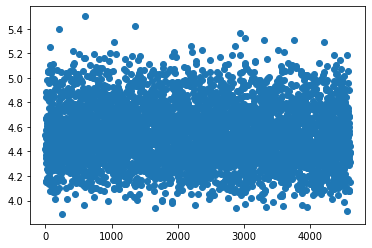

Iteration:  74%|██████████████▉     | 4700/6317 [1:36:59<32:25,  1.20s/it]

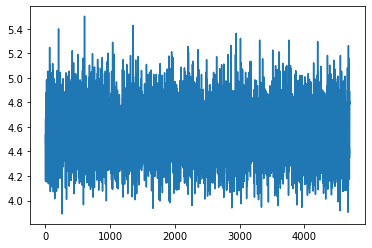

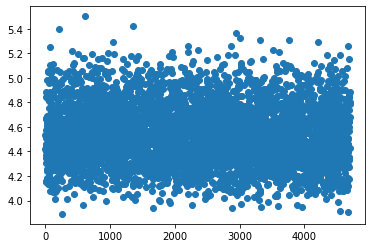

Iteration:  76%|███████████████▏    | 4800/6317 [1:38:51<30:33,  1.21s/it]

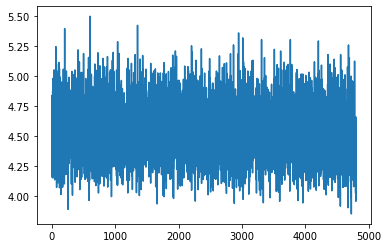

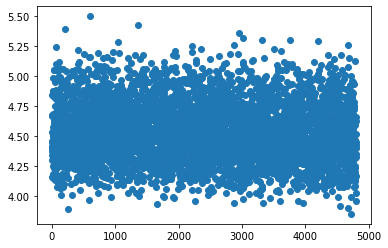

Iteration:  78%|███████████████▌    | 4900/6317 [1:40:59<25:38,  1.09s/it]

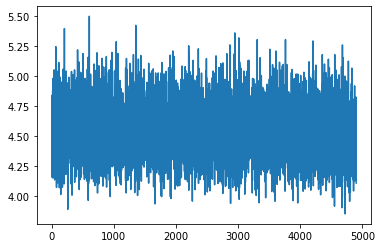

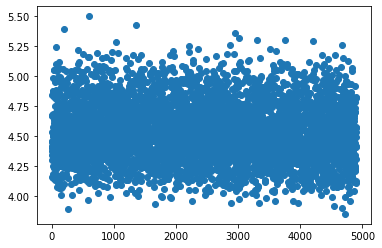

Iteration:  79%|███████████████▊    | 5000/6317 [1:43:00<32:24,  1.48s/it]

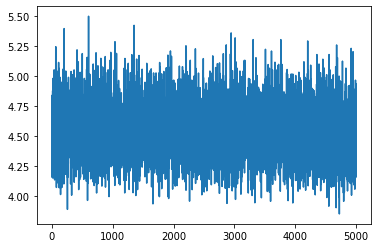

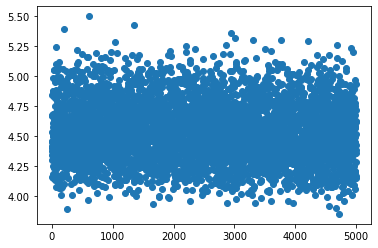

Iteration:  81%|████████████████▏   | 5100/6317 [1:45:06<23:46,  1.17s/it]

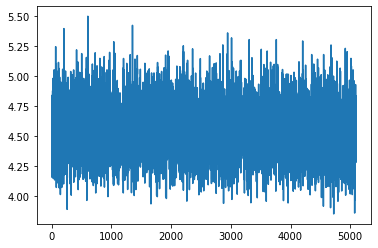

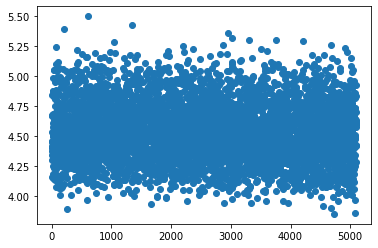

Iteration:  82%|████████████████▍   | 5200/6317 [1:47:09<24:52,  1.34s/it]

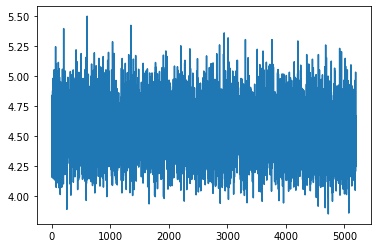

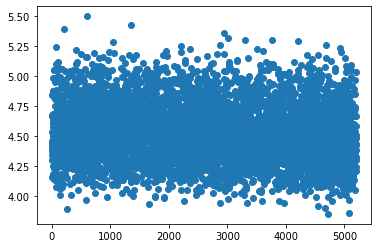

Iteration:  84%|████████████████▊   | 5300/6317 [1:49:15<22:38,  1.34s/it]

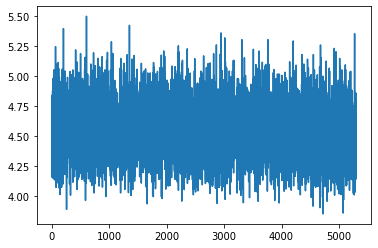

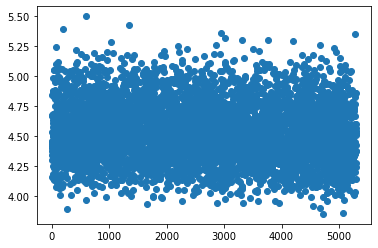

Iteration:  85%|█████████████████   | 5400/6317 [1:51:15<20:55,  1.37s/it]

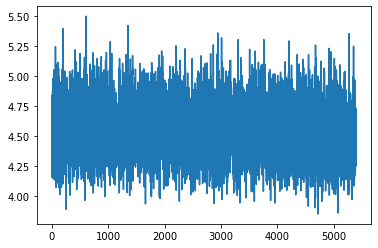

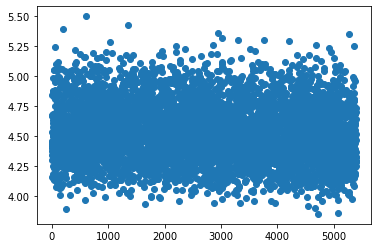

Iteration:  87%|█████████████████▍  | 5500/6317 [1:53:12<14:31,  1.07s/it]

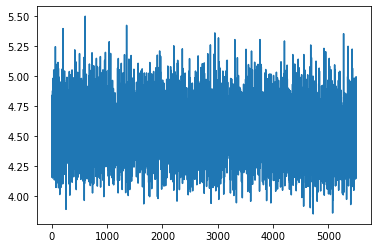

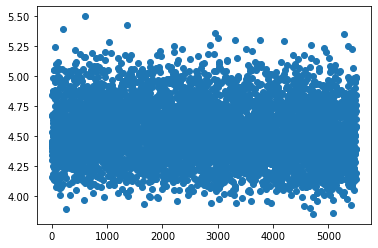

Iteration:  89%|█████████████████▋  | 5600/6317 [1:55:19<13:02,  1.09s/it]

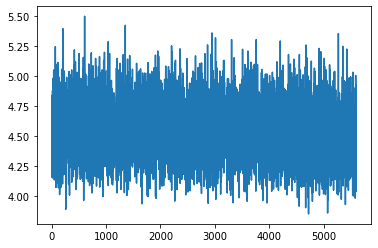

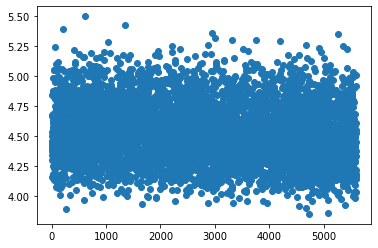

Iteration:  90%|██████████████████  | 5700/6317 [1:57:23<11:07,  1.08s/it]

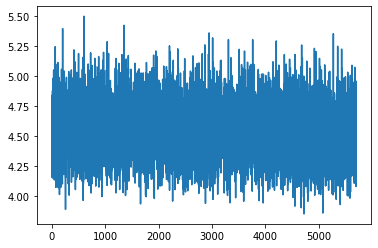

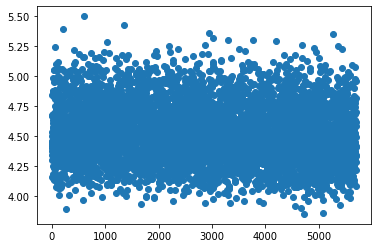

Iteration:  92%|██████████████████▎ | 5800/6317 [1:59:32<11:35,  1.35s/it]

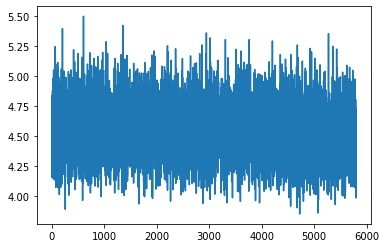

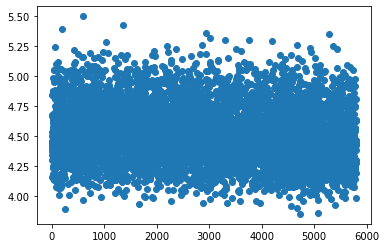

Iteration:  93%|██████████████████▋ | 5900/6317 [2:01:36<07:31,  1.08s/it]

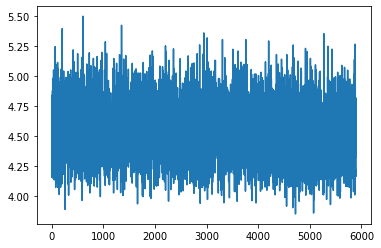

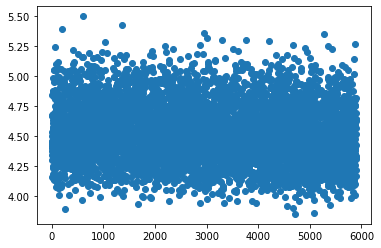

Iteration:  95%|██████████████████▉ | 6000/6317 [2:03:44<07:33,  1.43s/it]

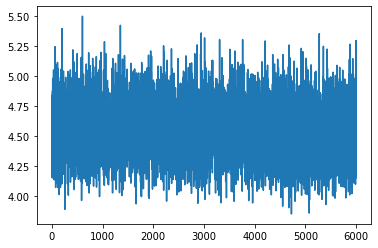

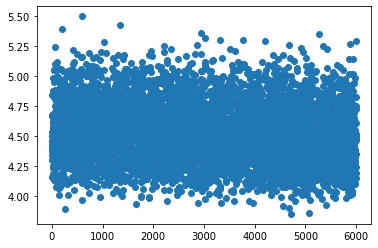

Iteration:  97%|███████████████████▎| 6100/6317 [2:05:51<05:01,  1.39s/it]

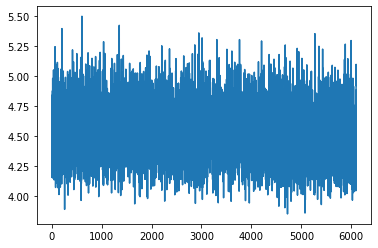

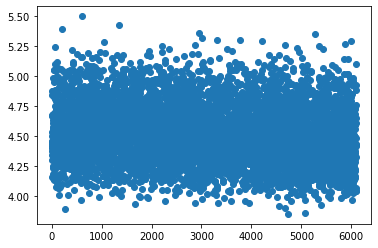

Iteration:  98%|███████████████████▋| 6200/6317 [2:07:46<02:33,  1.31s/it]

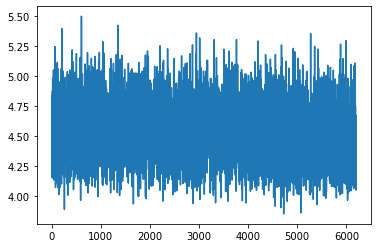

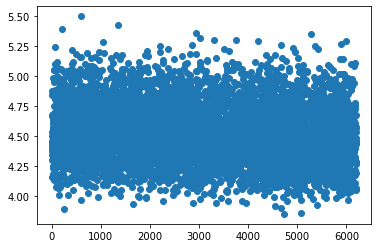

Iteration: 100%|███████████████████▉| 6300/6317 [2:09:56<00:19,  1.16s/it]

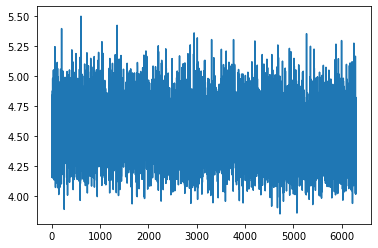

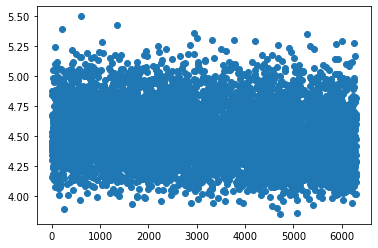

Iteration:   0%|                                 | 0/6317 [00:00<?, ?it/s]

Epoch loss 28574.19871044159
Epoch 2 complete, saving probes
Training epoch: 3


Iteration:   2%|▎                    | 100/6317 [02:06<1:54:44,  1.11s/it]

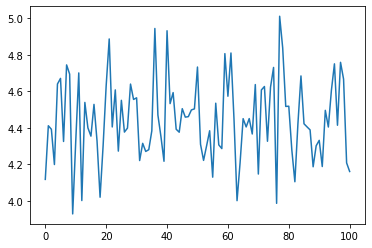

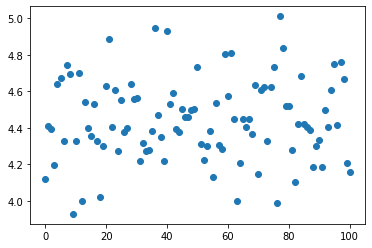

Iteration:   3%|▋                    | 200/6317 [04:12<2:26:22,  1.44s/it]

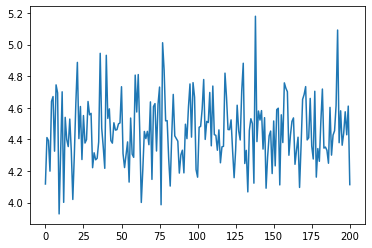

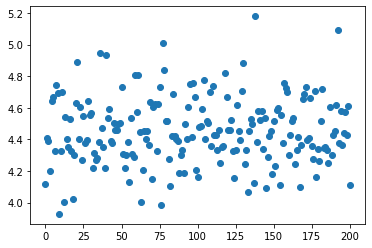

Iteration:   5%|▉                    | 300/6317 [06:19<2:07:42,  1.27s/it]

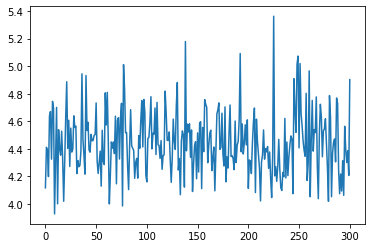

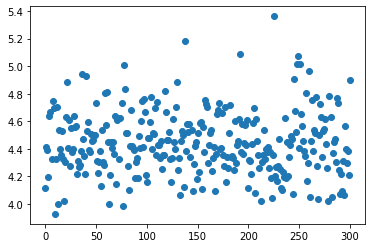

Iteration:   6%|█▎                   | 400/6317 [08:27<2:21:53,  1.44s/it]

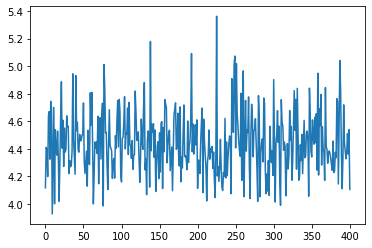

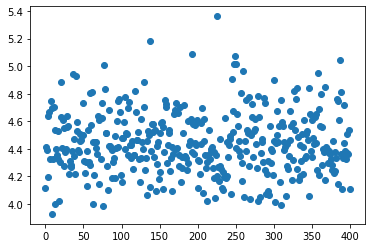

Iteration:   8%|█▋                   | 500/6317 [10:33<2:05:24,  1.29s/it]

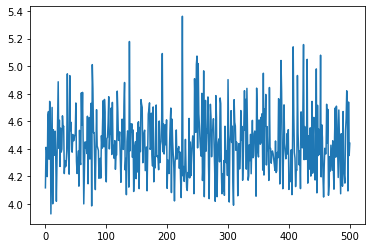

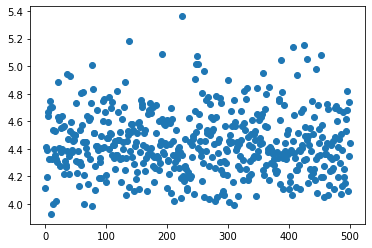

Iteration:   9%|█▉                   | 600/6317 [12:39<1:52:21,  1.18s/it]

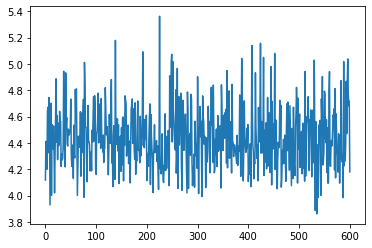

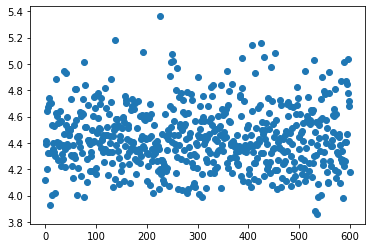

Iteration:  11%|██▎                  | 700/6317 [14:48<2:12:01,  1.41s/it]

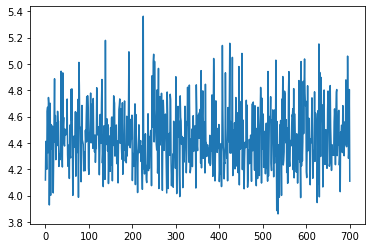

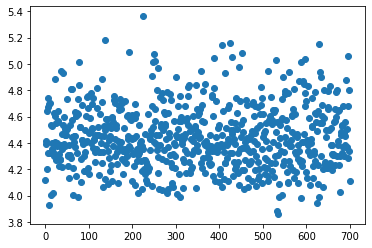

Iteration:  13%|██▋                  | 800/6317 [16:49<2:09:37,  1.41s/it]

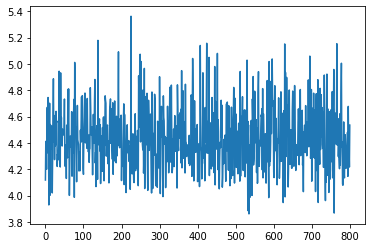

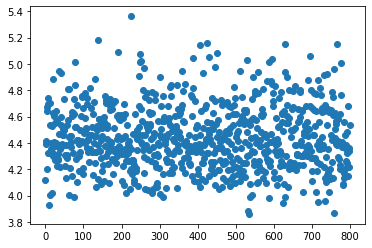

Iteration:  14%|██▉                  | 900/6317 [18:50<1:35:50,  1.06s/it]

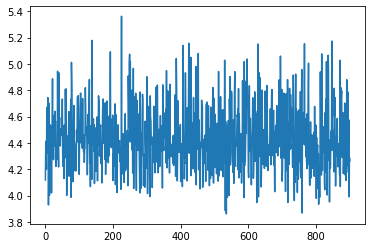

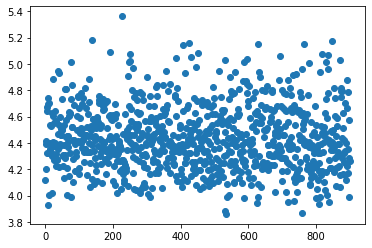

Iteration:  16%|███▏                | 1000/6317 [20:54<1:44:02,  1.17s/it]

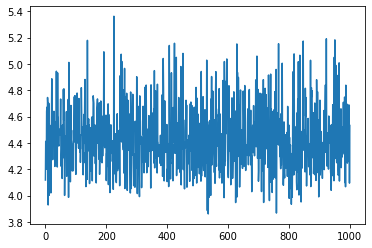

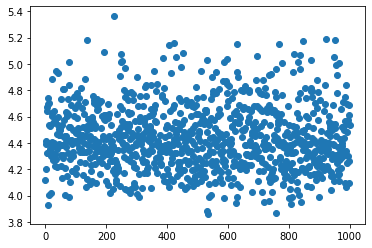

Iteration:  17%|███▍                | 1100/6317 [22:50<1:33:27,  1.07s/it]

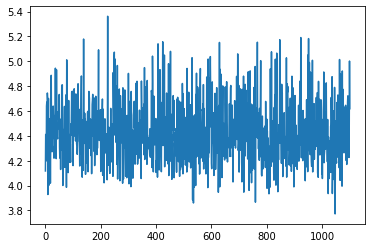

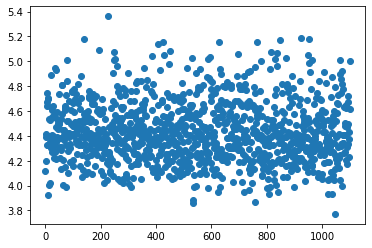

Iteration:  19%|███▊                | 1200/6317 [24:50<2:00:39,  1.41s/it]

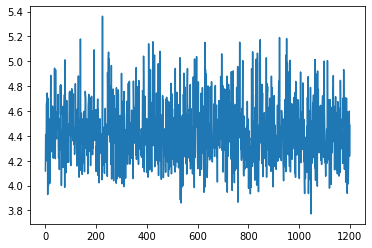

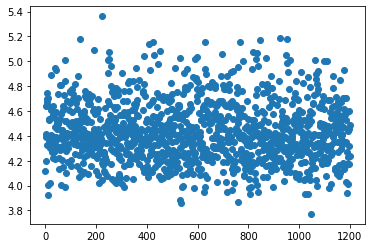

Iteration:  21%|████                | 1300/6317 [26:53<1:58:25,  1.42s/it]

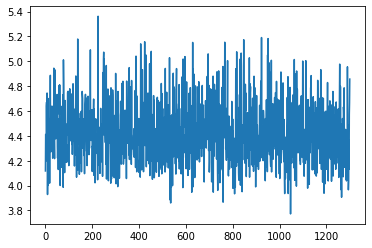

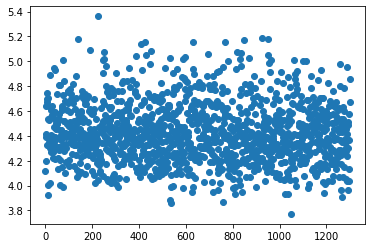

Iteration:  22%|████▍               | 1400/6317 [29:00<1:59:39,  1.46s/it]

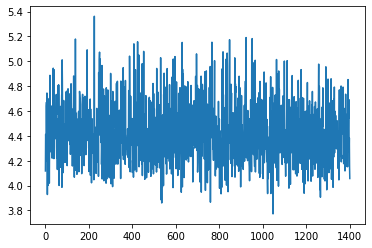

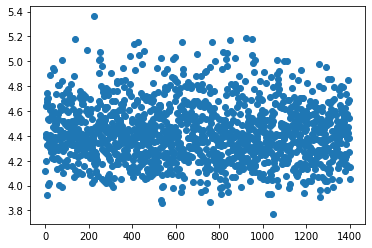

Iteration:  24%|████▋               | 1500/6317 [31:06<1:29:55,  1.12s/it]

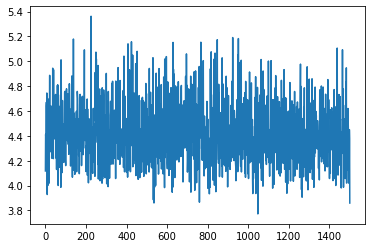

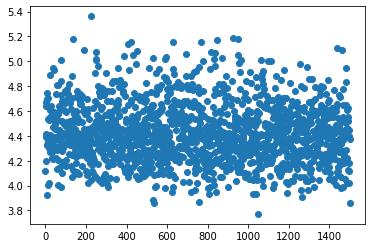

Iteration:  25%|█████               | 1600/6317 [33:12<1:41:05,  1.29s/it]

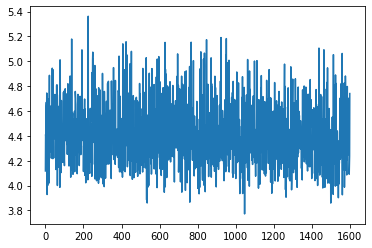

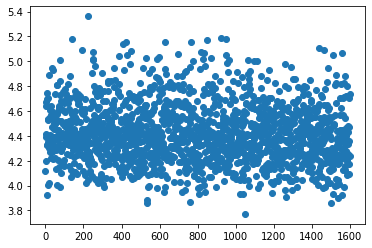

Iteration:  27%|█████▍              | 1700/6317 [35:16<1:25:47,  1.11s/it]

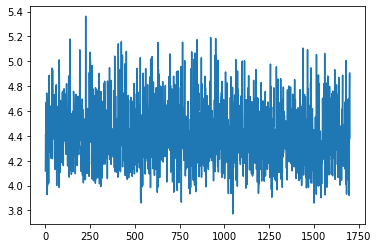

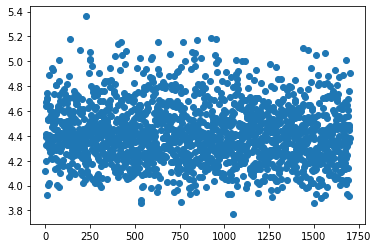

Iteration:  28%|█████▋              | 1800/6317 [37:15<1:44:52,  1.39s/it]

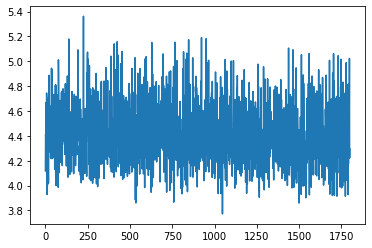

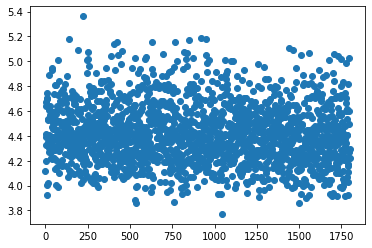

Iteration:  30%|██████              | 1900/6317 [39:15<1:28:32,  1.20s/it]

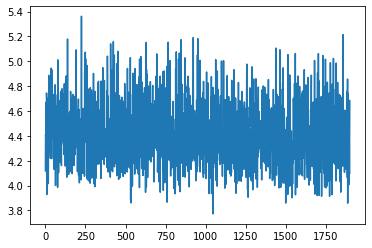

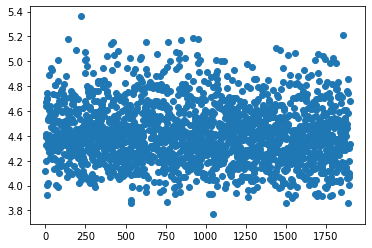

Iteration:  32%|██████▎             | 2000/6317 [41:26<1:20:28,  1.12s/it]

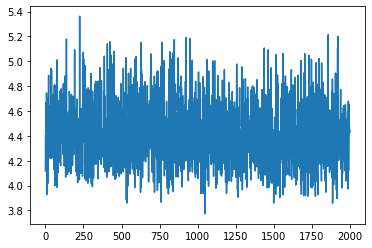

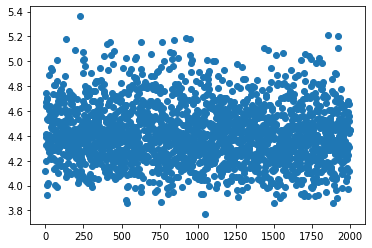

Iteration:  33%|██████▋             | 2100/6317 [43:32<1:43:40,  1.48s/it]

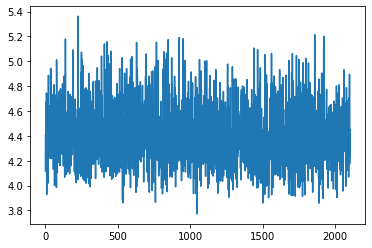

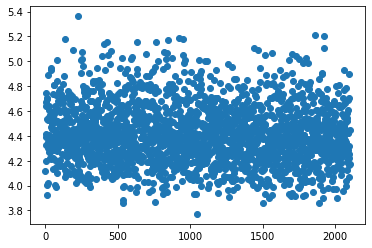

Iteration:  35%|██████▉             | 2200/6317 [45:35<1:37:40,  1.42s/it]

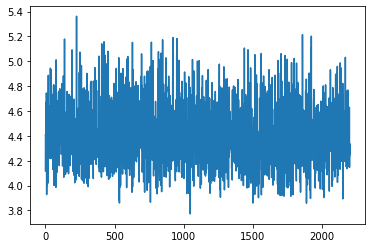

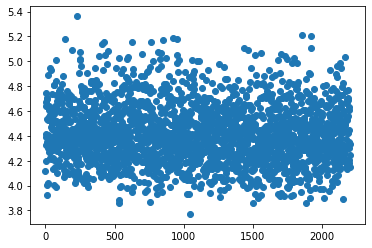

Iteration:  36%|███████▎            | 2300/6317 [47:34<1:27:11,  1.30s/it]

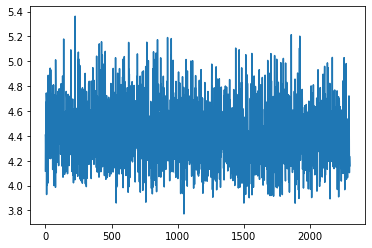

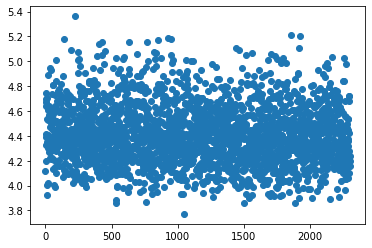

Iteration:  38%|███████▌            | 2400/6317 [49:42<1:32:45,  1.42s/it]

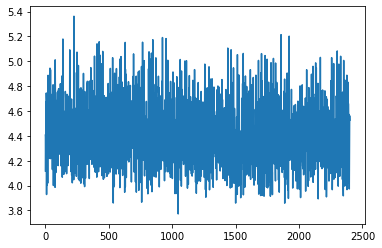

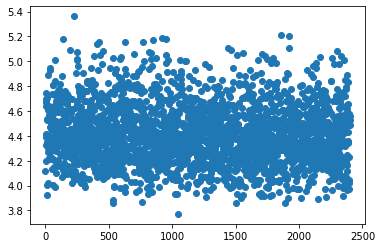

Iteration:  40%|███████▉            | 2500/6317 [51:38<1:27:52,  1.38s/it]

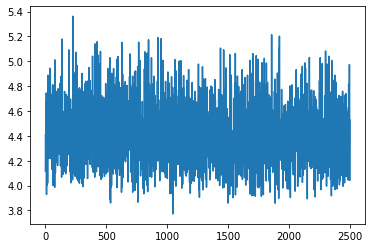

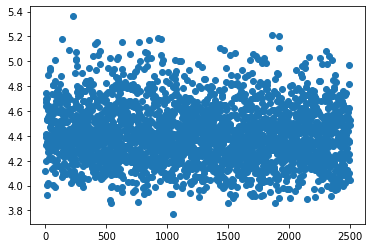

Iteration:  41%|████████▏           | 2600/6317 [53:46<1:29:32,  1.45s/it]

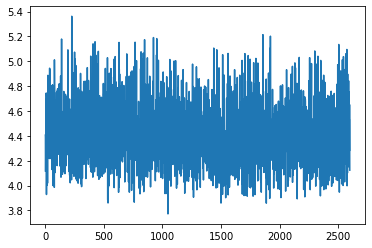

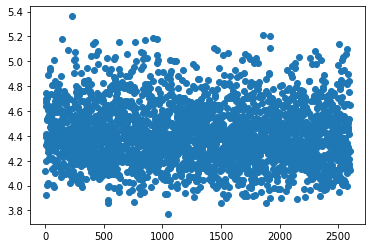

Iteration:  43%|████████▌           | 2700/6317 [55:49<1:04:13,  1.07s/it]

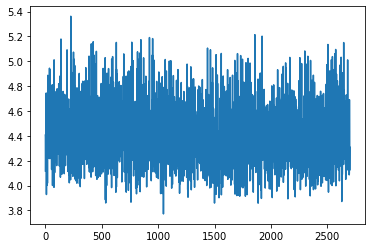

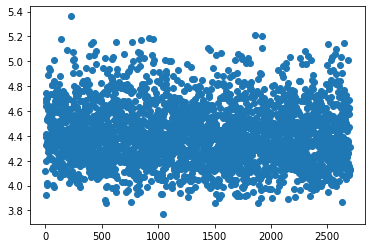

Iteration:  44%|████████▊           | 2800/6317 [57:54<1:18:25,  1.34s/it]

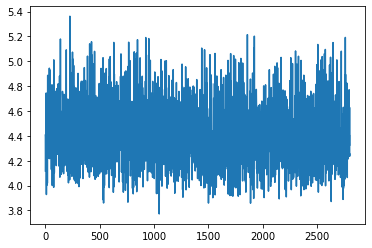

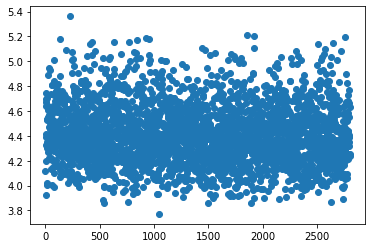

Iteration:  46%|█████████▏          | 2900/6317 [59:55<1:19:38,  1.40s/it]

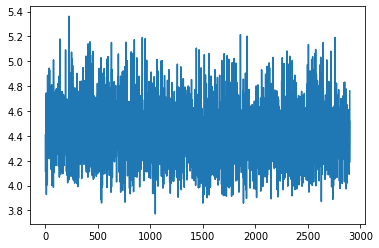

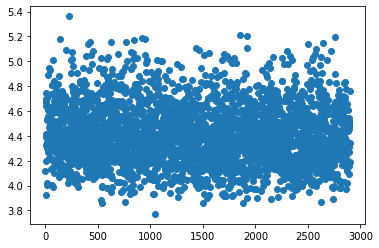

Iteration:  47%|████████▌         | 3000/6317 [1:02:07<1:20:47,  1.46s/it]

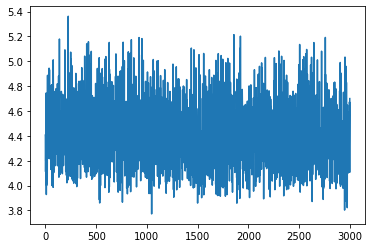

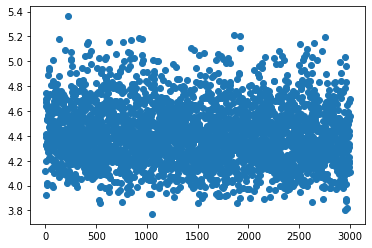

Iteration:  49%|████████▊         | 3100/6317 [1:04:09<1:14:24,  1.39s/it]

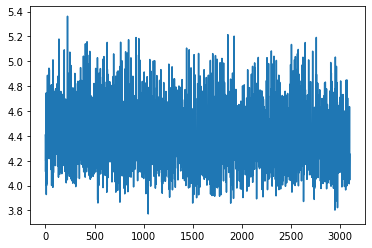

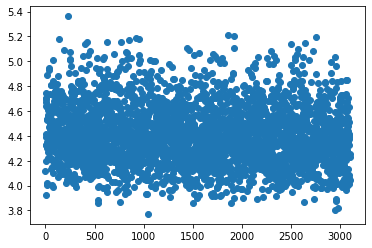

Iteration:  51%|██████████▏         | 3200/6317 [1:06:09<59:56,  1.15s/it]

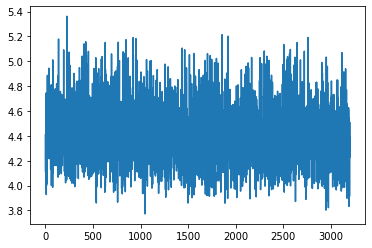

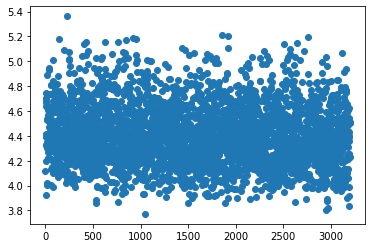

Iteration:  52%|█████████▍        | 3300/6317 [1:08:17<1:07:51,  1.35s/it]

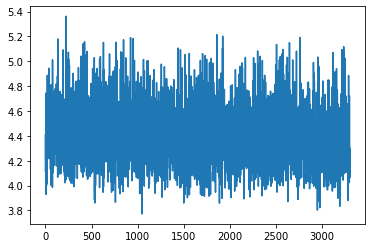

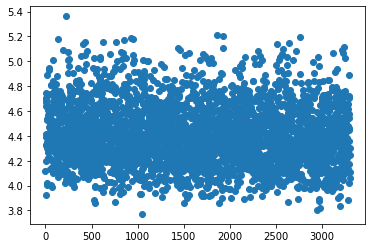

Iteration:  54%|██████████▊         | 3400/6317 [1:10:19<51:42,  1.06s/it]

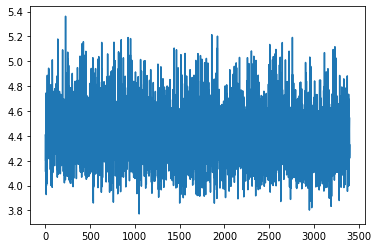

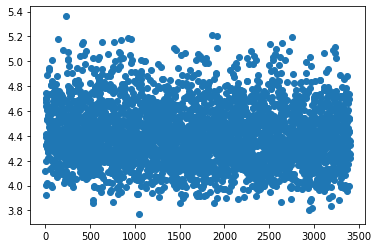

Iteration:  55%|███████████         | 3500/6317 [1:12:24<57:20,  1.22s/it]

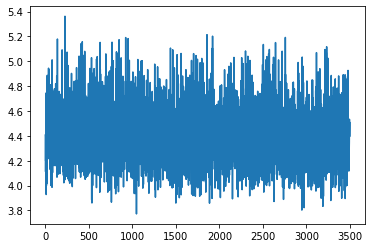

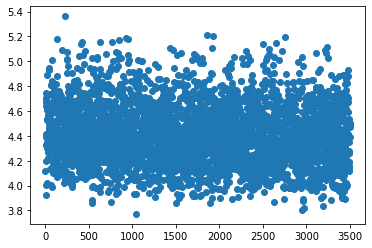

Iteration:  57%|███████████▍        | 3600/6317 [1:14:28<49:53,  1.10s/it]

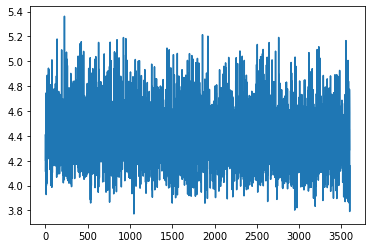

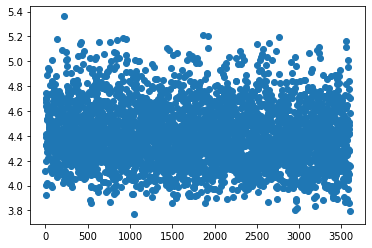

Iteration:  59%|███████████▋        | 3700/6317 [1:16:24<52:08,  1.20s/it]

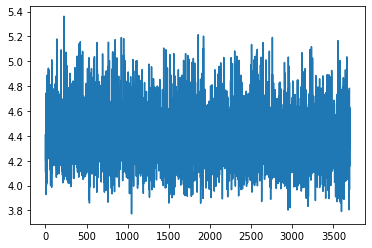

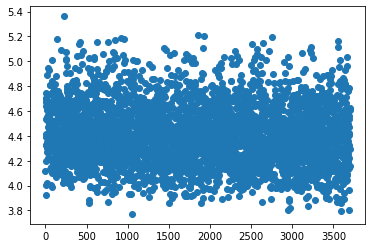

Iteration:  60%|████████████        | 3800/6317 [1:18:30<53:25,  1.27s/it]

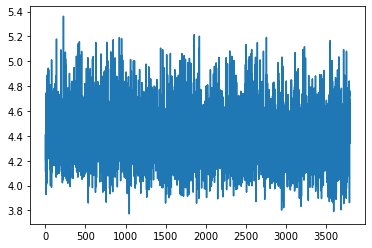

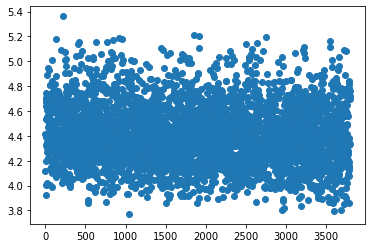

Iteration:  62%|████████████▎       | 3900/6317 [1:20:31<58:02,  1.44s/it]

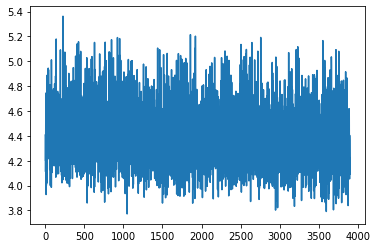

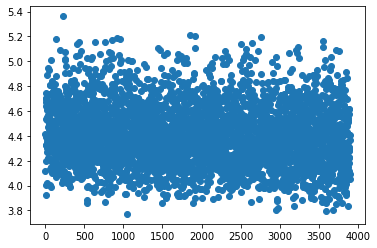

Iteration:  63%|████████████▋       | 4000/6317 [1:22:43<56:53,  1.47s/it]

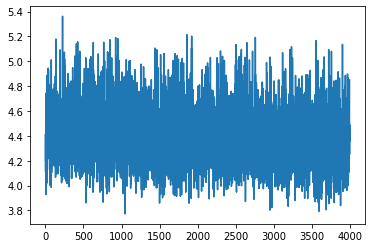

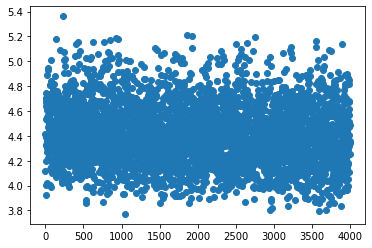

Iteration:  65%|████████████▉       | 4100/6317 [1:24:43<40:47,  1.10s/it]

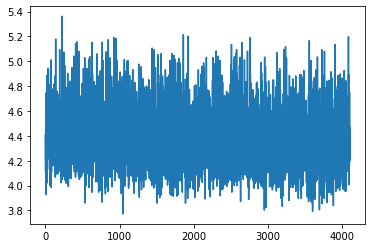

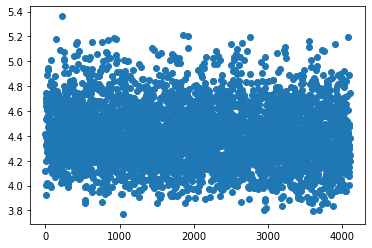

Iteration:  66%|█████████████▎      | 4200/6317 [1:26:52<50:32,  1.43s/it]

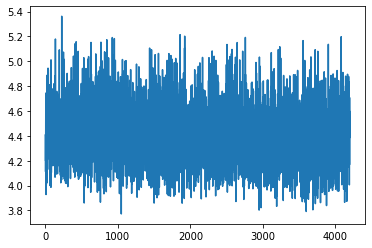

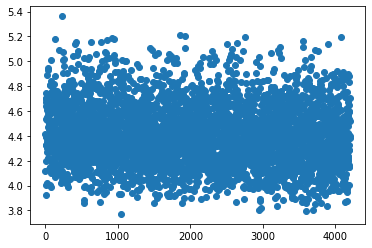

Iteration:  68%|█████████████▌      | 4300/6317 [1:28:51<41:15,  1.23s/it]

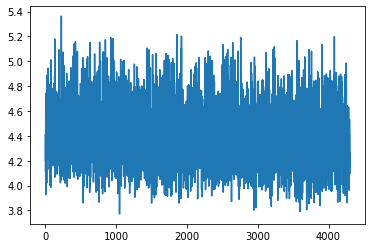

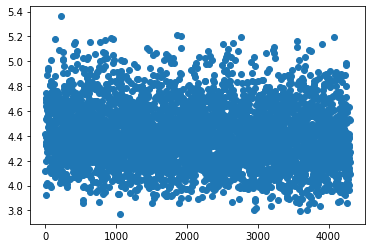

Iteration:  70%|█████████████▉      | 4400/6317 [1:30:59<34:16,  1.07s/it]

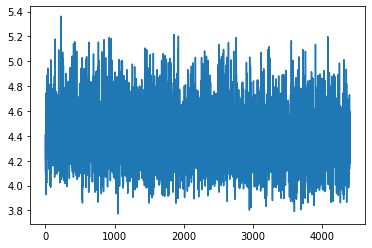

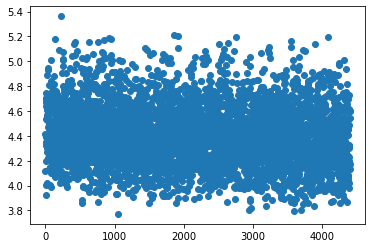

Iteration:  71%|██████████████▏     | 4500/6317 [1:33:03<40:51,  1.35s/it]

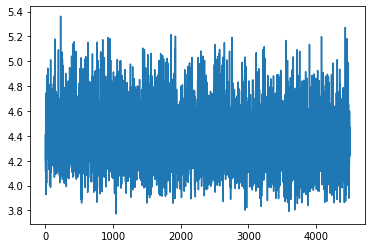

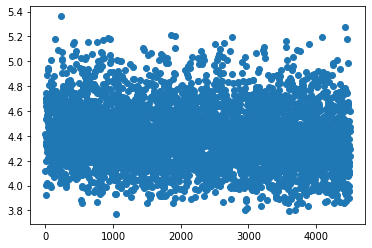

Iteration:  73%|██████████████▌     | 4600/6317 [1:35:03<41:20,  1.44s/it]

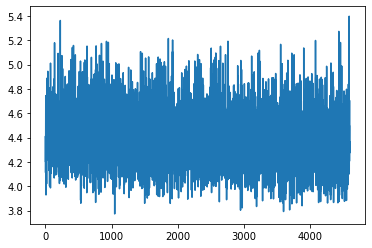

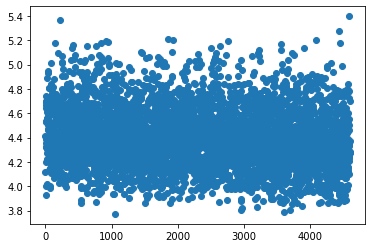

Iteration:  74%|██████████████▉     | 4700/6317 [1:37:12<35:44,  1.33s/it]

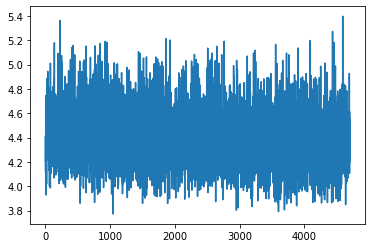

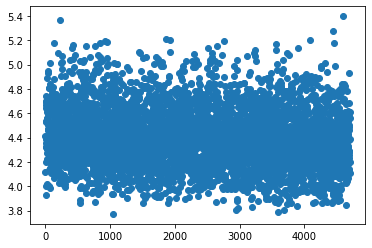

Iteration:  76%|███████████████▏    | 4800/6317 [1:39:16<37:07,  1.47s/it]

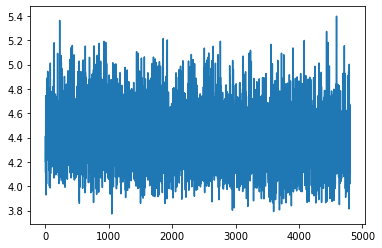

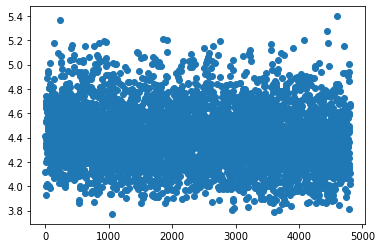

Iteration:  78%|███████████████▌    | 4900/6317 [1:41:25<31:11,  1.32s/it]

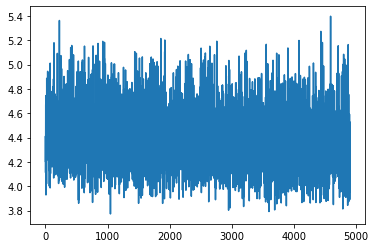

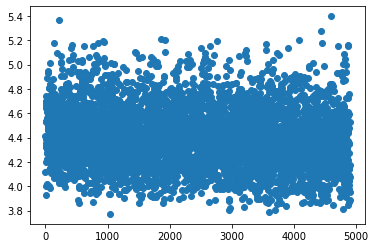

Iteration:  79%|███████████████▊    | 5000/6317 [1:43:25<30:29,  1.39s/it]

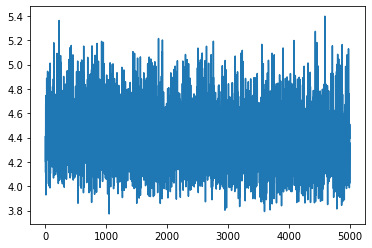

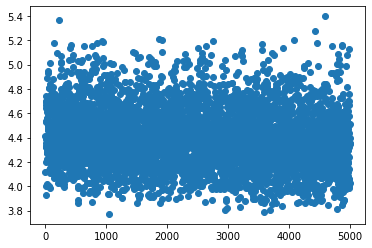

Iteration:  81%|████████████████▏   | 5100/6317 [1:45:28<21:55,  1.08s/it]

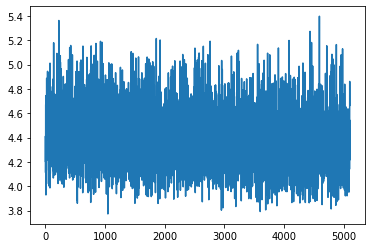

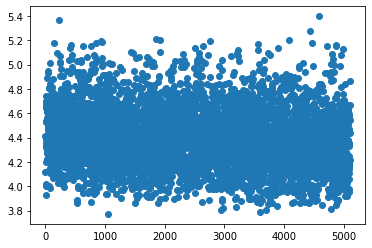

Iteration:  82%|████████████████▍   | 5200/6317 [1:47:30<26:06,  1.40s/it]

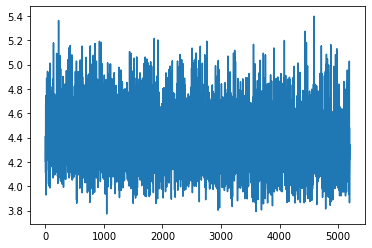

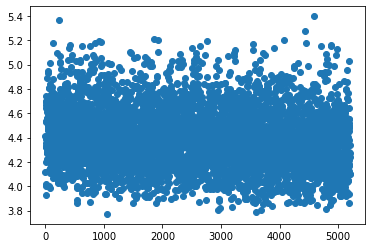

Iteration:  84%|████████████████▊   | 5300/6317 [1:49:39<22:54,  1.35s/it]

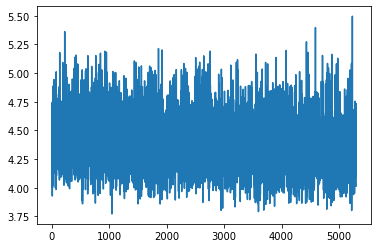

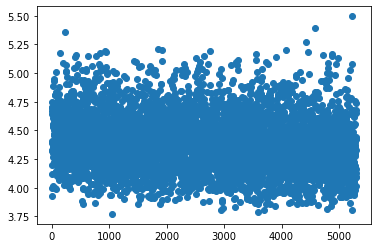

Iteration:  85%|█████████████████   | 5400/6317 [1:51:43<19:41,  1.29s/it]

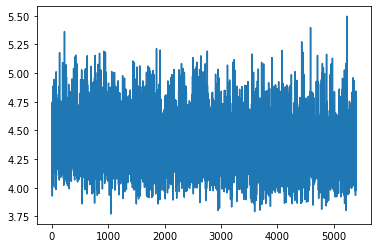

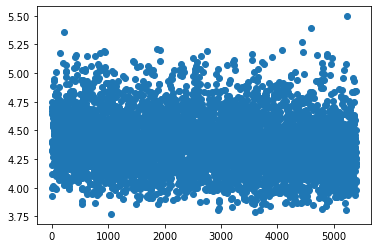

Iteration:  87%|█████████████████▍  | 5500/6317 [1:53:48<19:50,  1.46s/it]

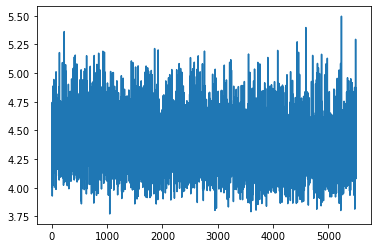

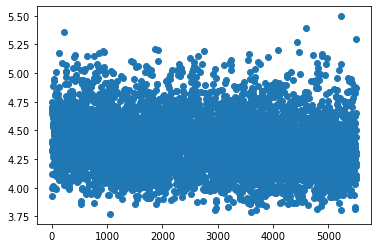

Iteration:  89%|█████████████████▋  | 5600/6317 [1:55:52<16:23,  1.37s/it]

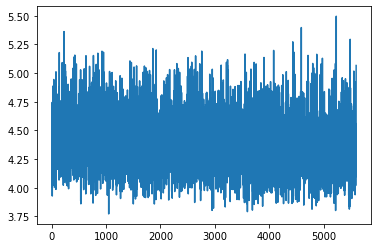

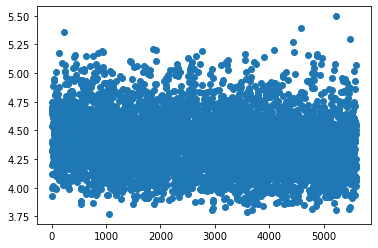

Iteration:  90%|██████████████████  | 5700/6317 [1:58:02<15:29,  1.51s/it]

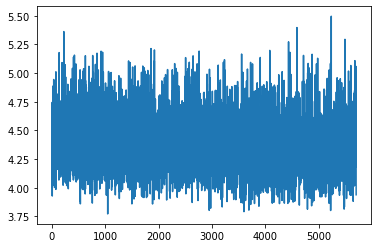

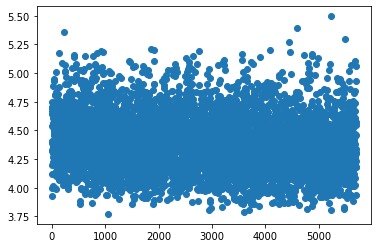

Iteration:  92%|██████████████████▎ | 5800/6317 [2:00:01<10:22,  1.20s/it]

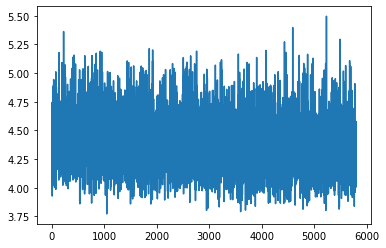

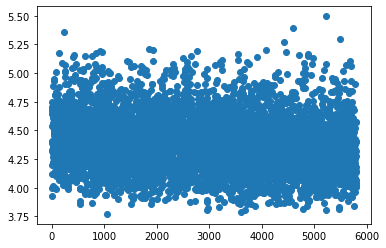

Iteration:  93%|██████████████████▋ | 5900/6317 [2:02:01<08:45,  1.26s/it]

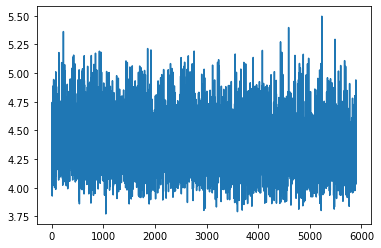

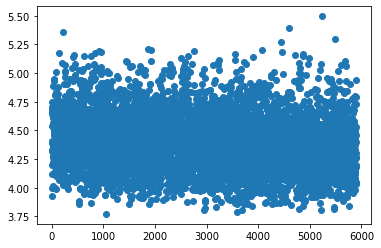

Iteration:  95%|██████████████████▉ | 6000/6317 [2:03:59<06:01,  1.14s/it]

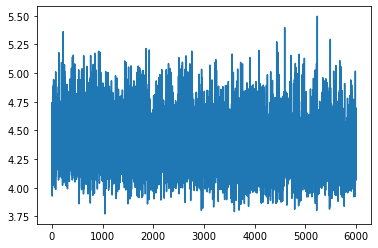

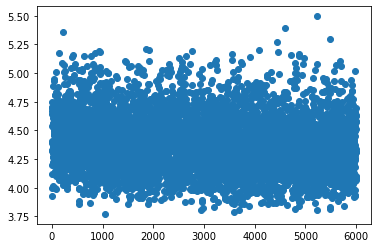

Iteration:  97%|███████████████████▎| 6100/6317 [2:06:06<04:56,  1.37s/it]

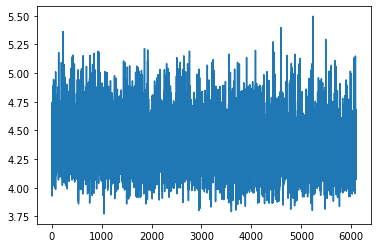

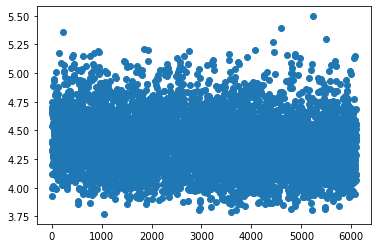

Iteration:  98%|███████████████████▋| 6200/6317 [2:08:11<02:51,  1.47s/it]

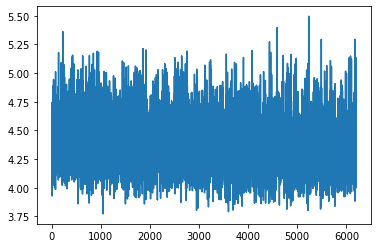

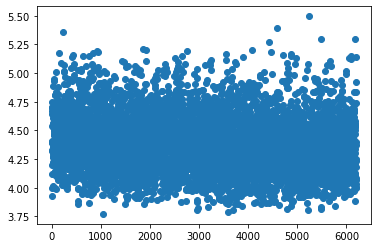

Iteration: 100%|███████████████████▉| 6300/6317 [2:10:13<00:22,  1.32s/it]

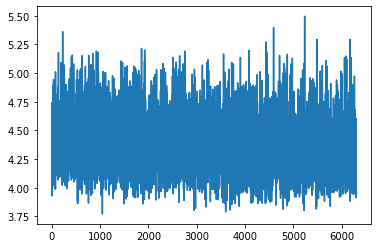

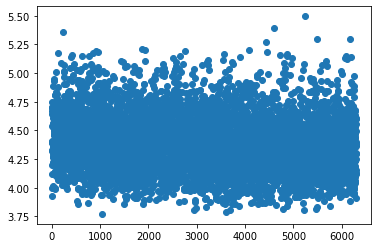

Iteration:   0%|                                 | 0/6317 [00:00<?, ?it/s]

Epoch loss 27668.81896877289
Epoch 3 complete, saving probes
Training epoch: 4


Iteration:   2%|▎                    | 100/6317 [02:00<1:51:23,  1.08s/it]

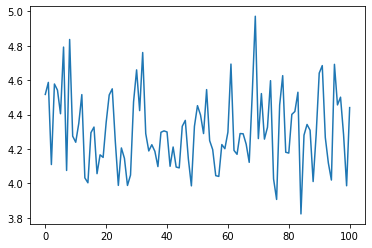

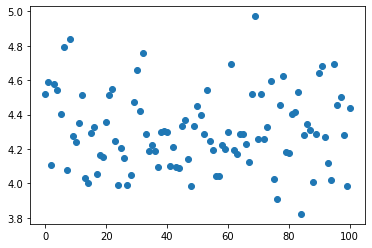

Iteration:   3%|▋                    | 200/6317 [03:50<2:09:41,  1.27s/it]

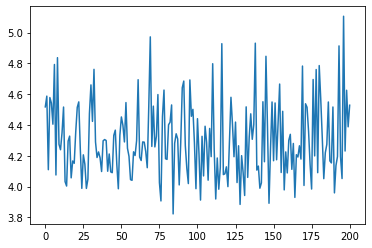

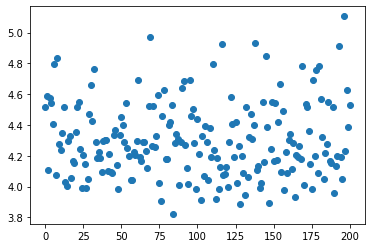

Iteration:   5%|▉                    | 300/6317 [05:54<2:07:59,  1.28s/it]

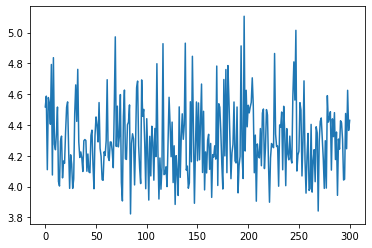

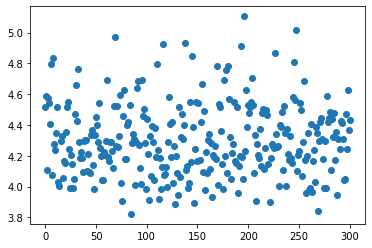

Iteration:   6%|█▎                   | 400/6317 [08:04<2:02:43,  1.24s/it]

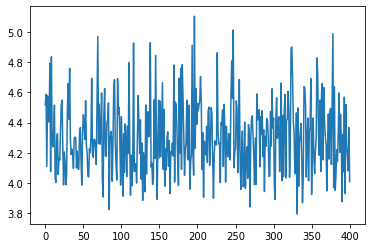

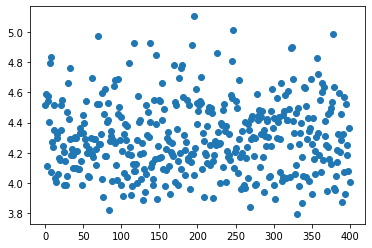

Iteration:   8%|█▋                   | 500/6317 [10:06<1:52:33,  1.16s/it]

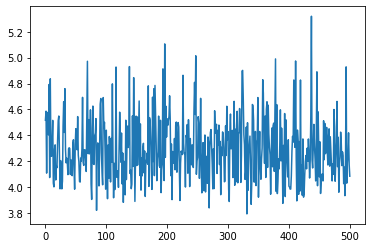

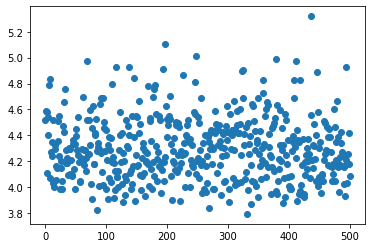

Iteration:   9%|█▉                   | 600/6317 [12:09<2:14:27,  1.41s/it]

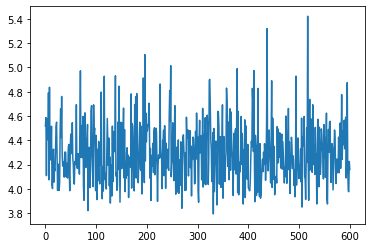

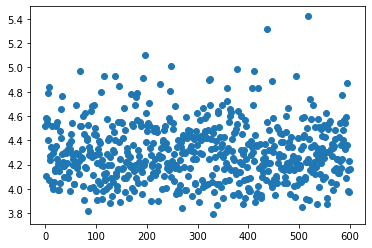

Iteration:  11%|██▎                  | 700/6317 [14:14<1:40:25,  1.07s/it]

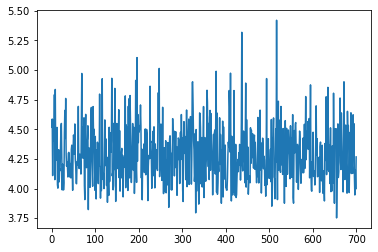

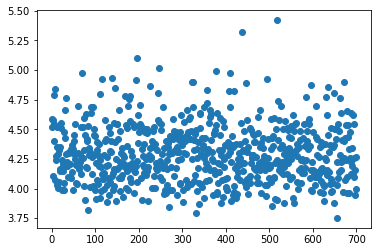

Iteration:  13%|██▋                  | 800/6317 [16:13<1:38:01,  1.07s/it]

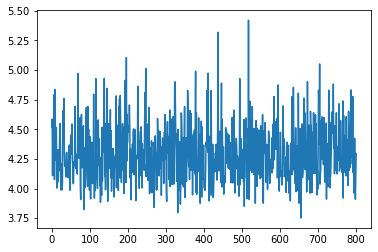

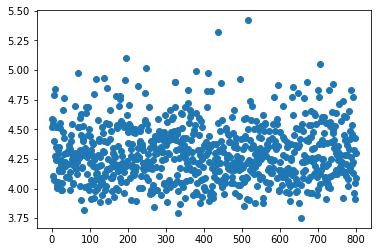

Iteration:  14%|██▉                  | 900/6317 [18:21<2:00:17,  1.33s/it]

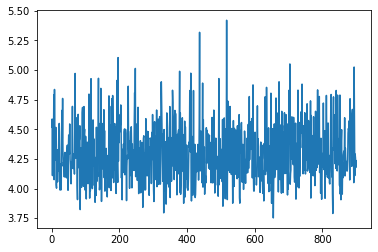

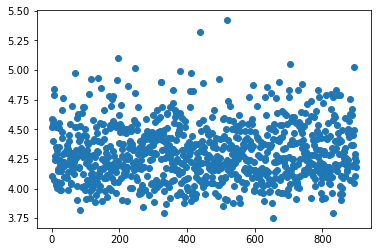

Iteration:  16%|███▏                | 1000/6317 [20:16<1:43:38,  1.17s/it]

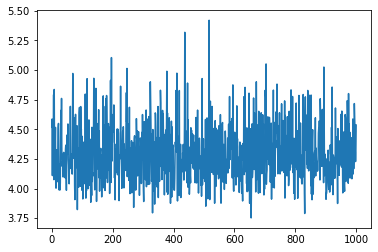

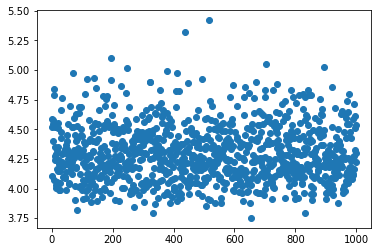

Iteration:  17%|███▍                | 1100/6317 [22:14<2:03:08,  1.42s/it]

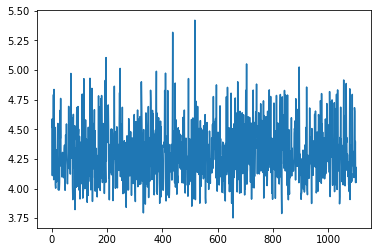

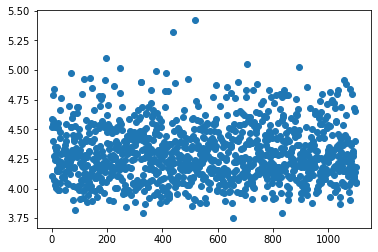

Iteration:  19%|███▊                | 1200/6317 [24:19<1:43:54,  1.22s/it]

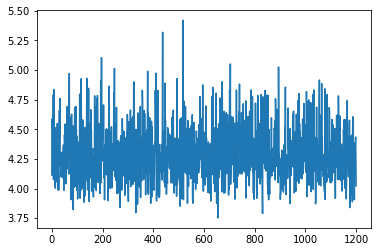

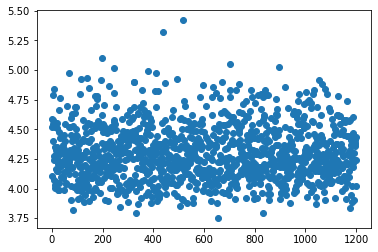

Iteration:  21%|████                | 1300/6317 [26:21<1:46:23,  1.27s/it]

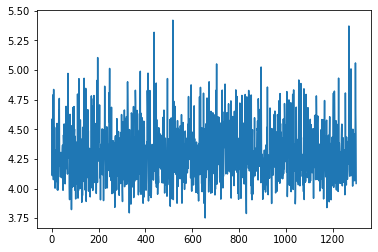

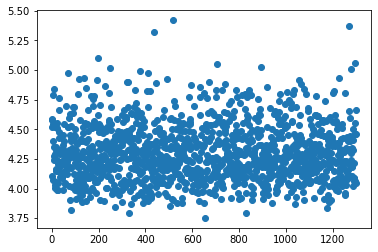

Iteration:  22%|████▍               | 1400/6317 [28:29<1:36:27,  1.18s/it]

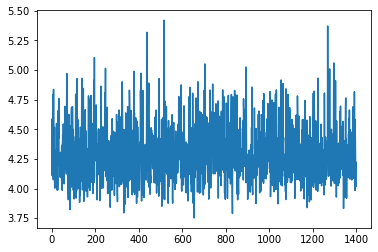

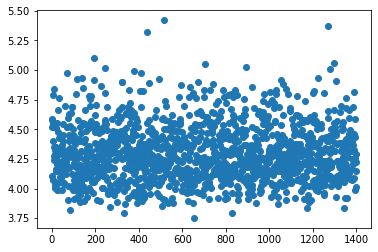

Iteration:  24%|████▋               | 1500/6317 [30:33<1:50:42,  1.38s/it]

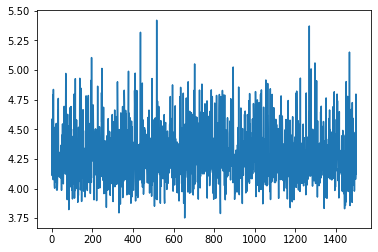

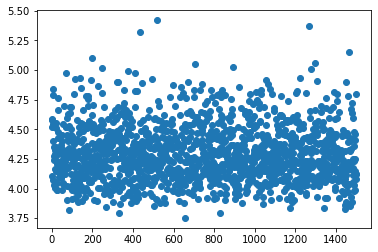

Iteration:  25%|█████               | 1600/6317 [32:31<1:44:30,  1.33s/it]

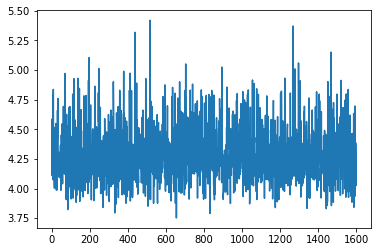

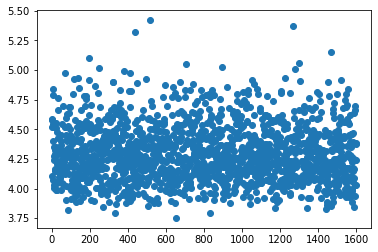

Iteration:  27%|█████▍              | 1700/6317 [34:34<1:51:57,  1.45s/it]

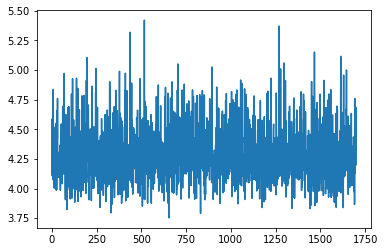

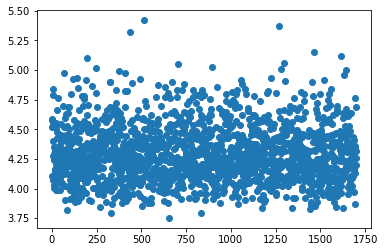

Iteration:  28%|█████▋              | 1800/6317 [36:42<1:48:30,  1.44s/it]

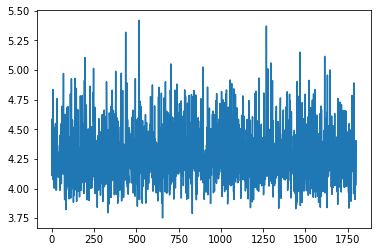

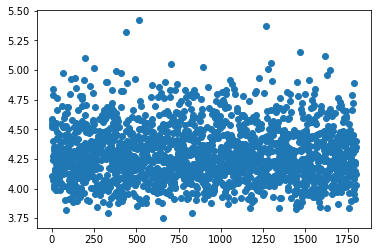

Iteration:  30%|██████              | 1900/6317 [38:43<1:28:50,  1.21s/it]

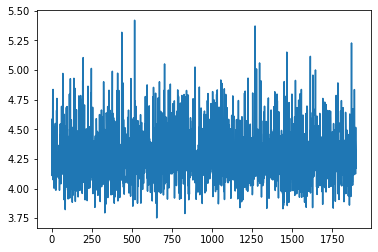

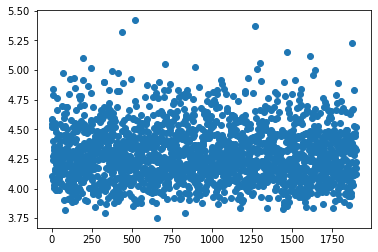

Iteration:  32%|██████▎             | 2000/6317 [40:46<1:17:56,  1.08s/it]

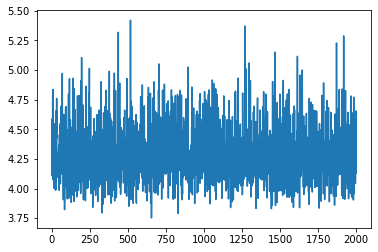

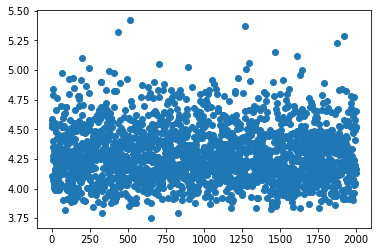

Iteration:  33%|██████▋             | 2100/6317 [42:48<1:41:16,  1.44s/it]

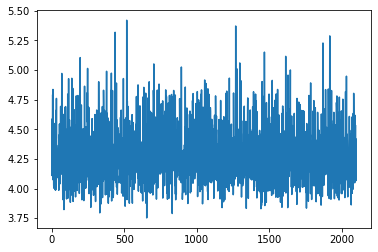

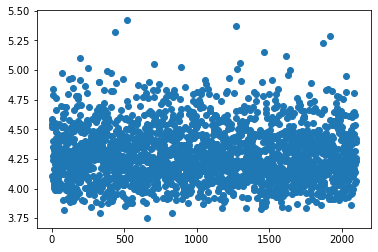

Iteration:  35%|██████▉             | 2200/6317 [44:53<1:28:33,  1.29s/it]

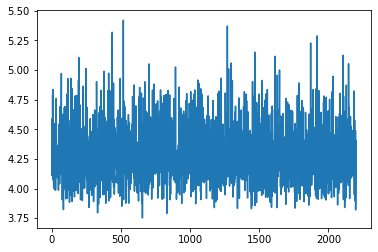

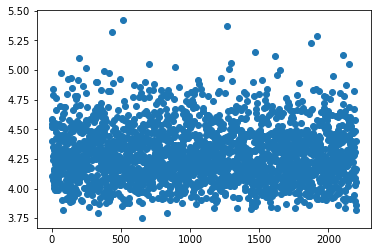

Iteration:  36%|███████▎            | 2300/6317 [46:55<1:38:27,  1.47s/it]

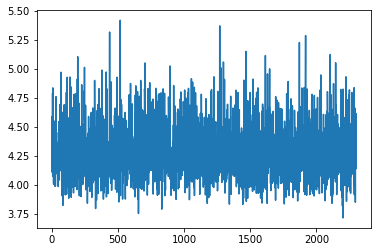

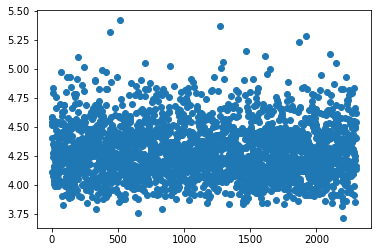

Iteration:  38%|███████▌            | 2400/6317 [48:57<1:12:27,  1.11s/it]

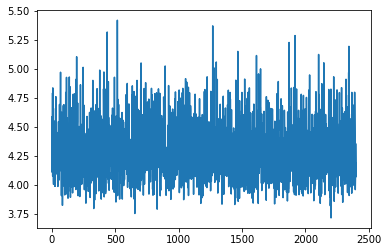

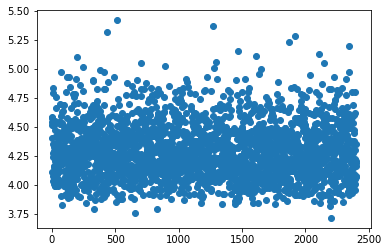

Iteration:  40%|███████▉            | 2500/6317 [51:02<1:16:50,  1.21s/it]

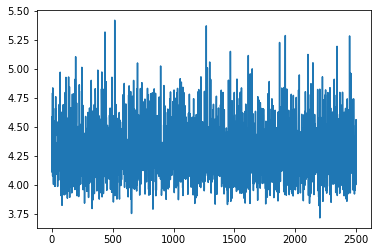

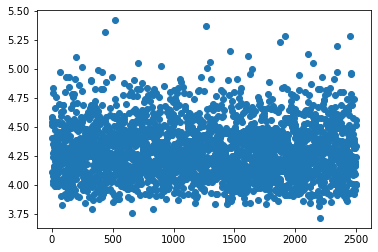

Iteration:  41%|████████▏           | 2600/6317 [53:09<1:09:13,  1.12s/it]

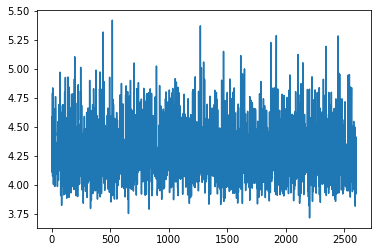

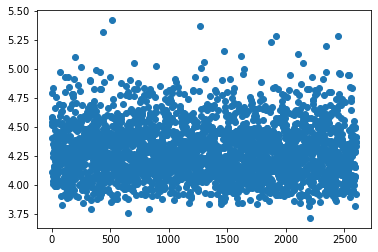

Iteration:  43%|████████▌           | 2700/6317 [55:14<1:08:00,  1.13s/it]

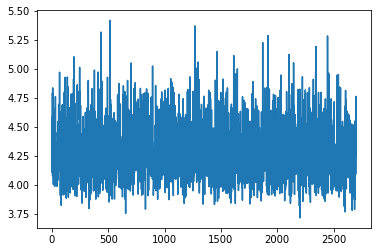

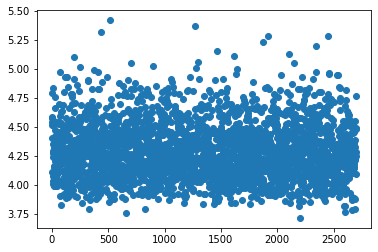

Iteration:  44%|████████▊           | 2800/6317 [57:21<1:18:17,  1.34s/it]

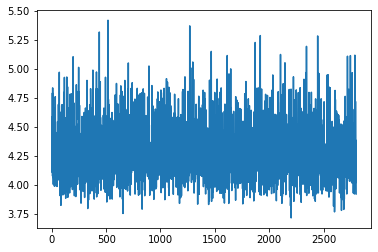

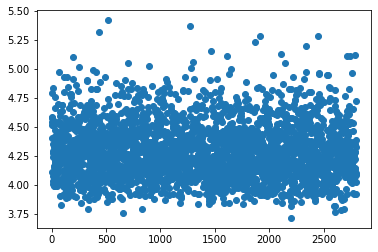

Iteration:  46%|█████████▏          | 2900/6317 [59:31<1:21:00,  1.42s/it]

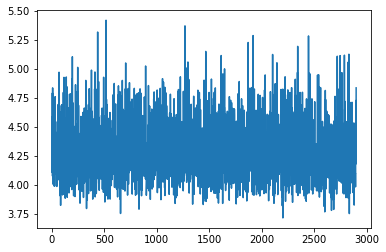

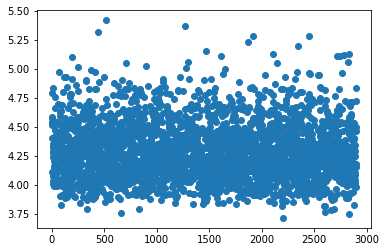

Iteration:  47%|████████▌         | 3000/6317 [1:01:39<1:17:18,  1.40s/it]

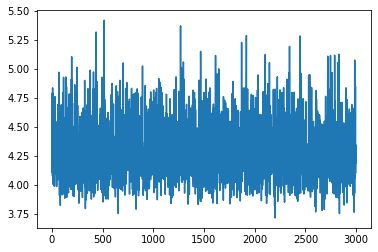

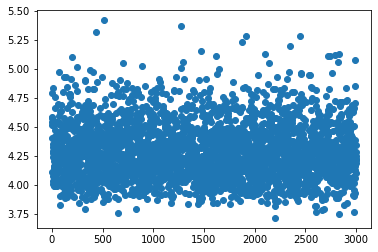

Iteration:  49%|█████████▊          | 3100/6317 [1:03:42<59:44,  1.11s/it]

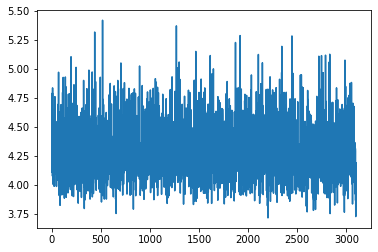

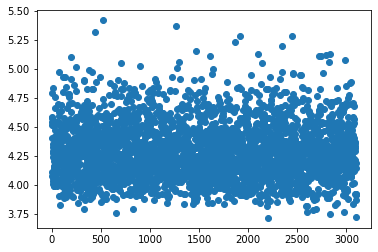

Iteration:  51%|█████████         | 3200/6317 [1:05:48<1:01:54,  1.19s/it]

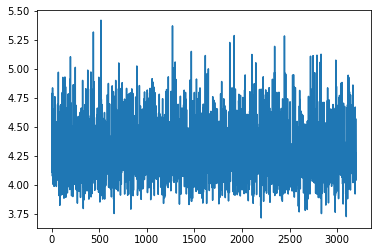

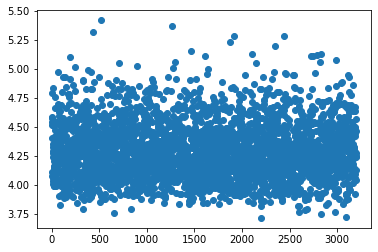

Iteration:  52%|█████████▍        | 3300/6317 [1:07:52<1:07:01,  1.33s/it]

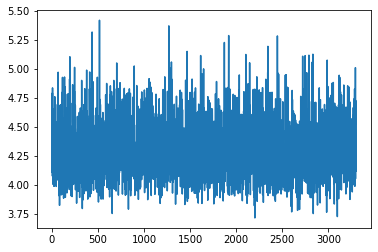

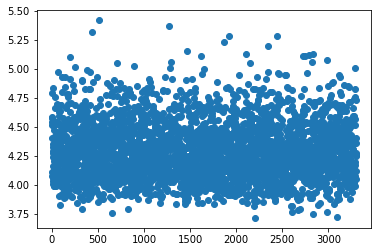

Iteration:  54%|██████████▊         | 3400/6317 [1:10:02<55:13,  1.14s/it]

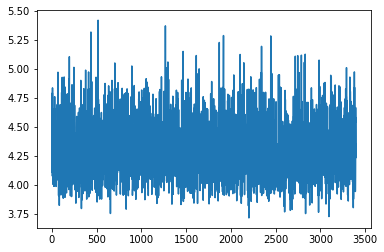

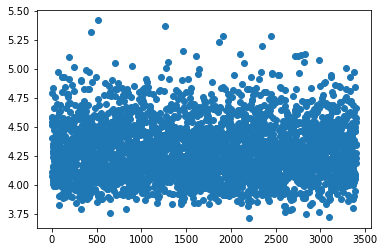

Iteration:  55%|█████████▉        | 3500/6317 [1:12:04<1:08:33,  1.46s/it]

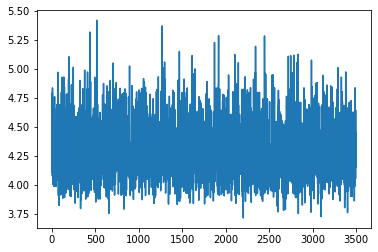

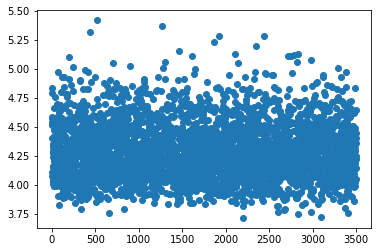

Iteration:  57%|███████████▍        | 3600/6317 [1:14:04<57:09,  1.26s/it]

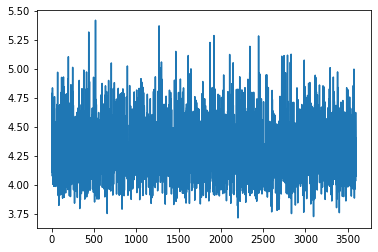

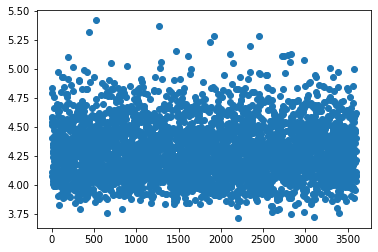

Iteration:  59%|██████████▌       | 3700/6317 [1:16:13<1:03:23,  1.45s/it]

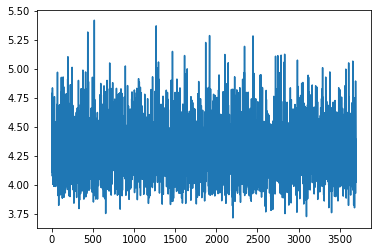

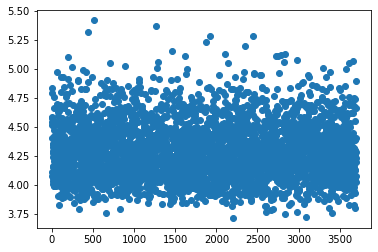

Iteration:  60%|████████████        | 3800/6317 [1:18:13<59:30,  1.42s/it]

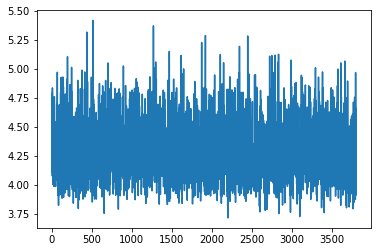

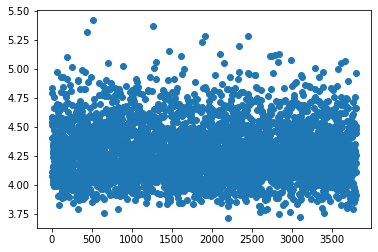

Iteration:  62%|████████████▎       | 3900/6317 [1:20:18<52:39,  1.31s/it]

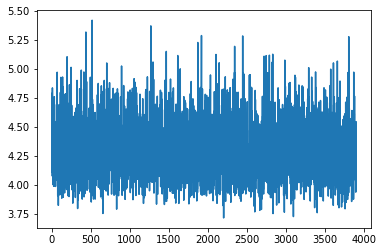

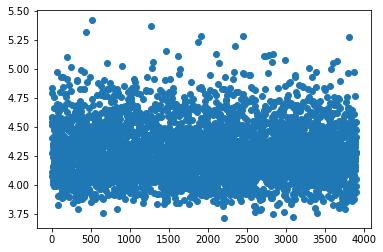

Iteration:  63%|████████████▋       | 4000/6317 [1:22:26<41:34,  1.08s/it]

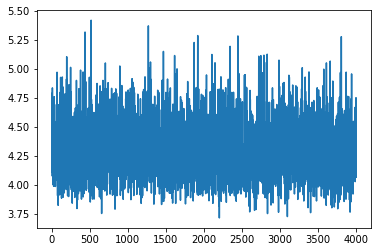

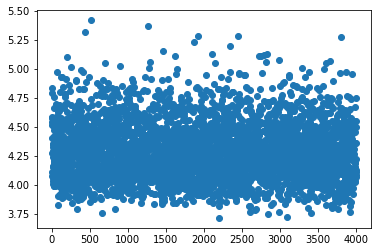

Iteration:  65%|████████████▉       | 4100/6317 [1:24:26<44:16,  1.20s/it]

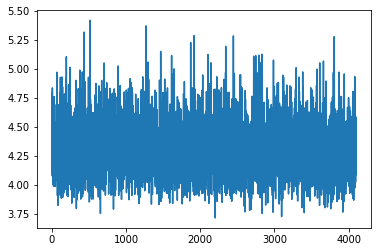

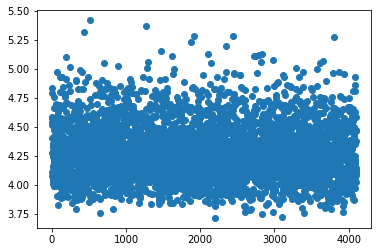

Iteration:  66%|█████████████▎      | 4200/6317 [1:26:28<37:41,  1.07s/it]

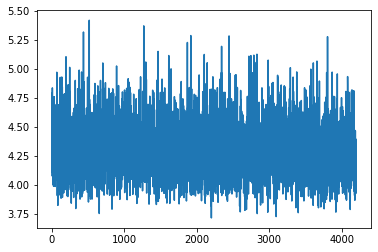

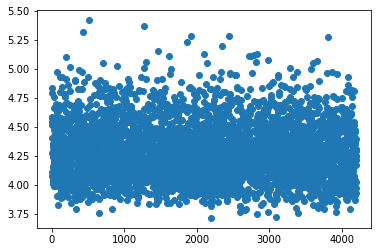

Iteration:  68%|█████████████▌      | 4300/6317 [1:28:24<35:54,  1.07s/it]

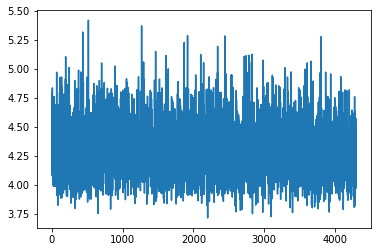

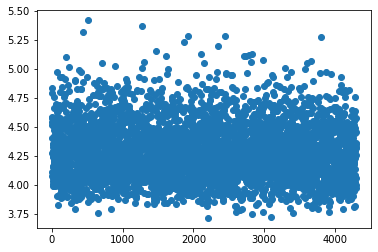

Iteration:  70%|█████████████▉      | 4400/6317 [1:30:27<45:38,  1.43s/it]

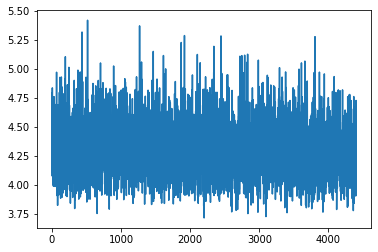

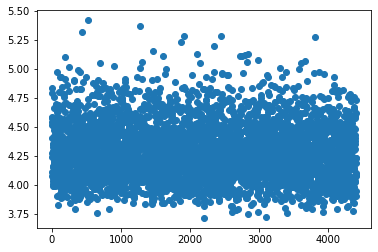

Iteration:  71%|██████████████▏     | 4500/6317 [1:32:39<41:50,  1.38s/it]

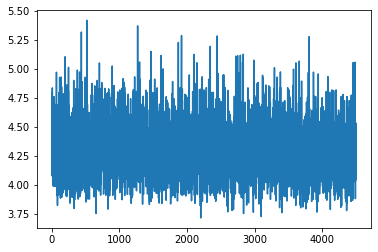

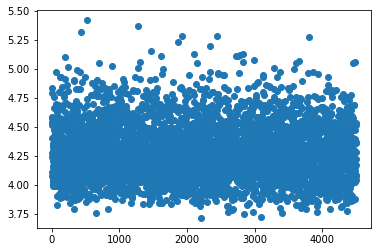

Iteration:  73%|██████████████▌     | 4600/6317 [1:34:41<35:33,  1.24s/it]

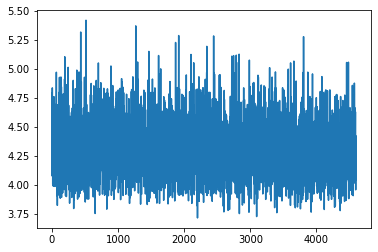

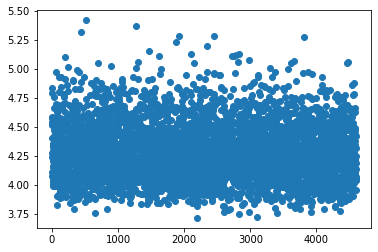

Iteration:  74%|██████████████▉     | 4700/6317 [1:36:40<34:12,  1.27s/it]

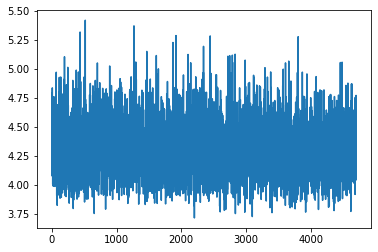

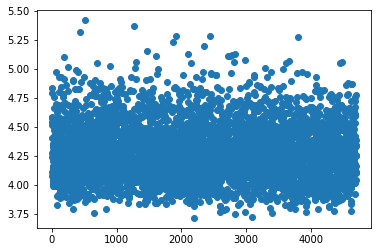

Iteration:  76%|███████████████▏    | 4800/6317 [1:38:42<37:26,  1.48s/it]

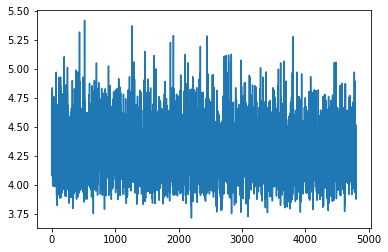

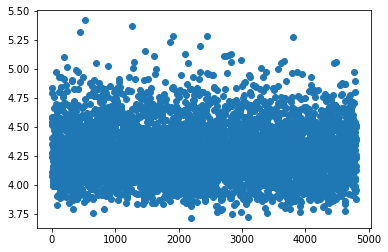

Iteration:  78%|███████████████▌    | 4900/6317 [1:40:43<25:19,  1.07s/it]

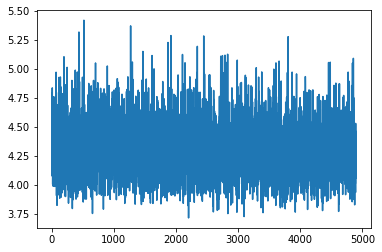

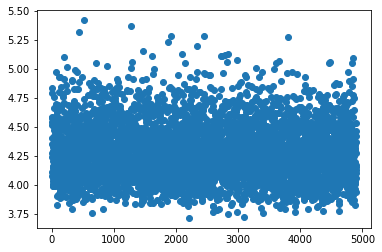

Iteration:  79%|███████████████▊    | 5000/6317 [1:42:53<32:30,  1.48s/it]

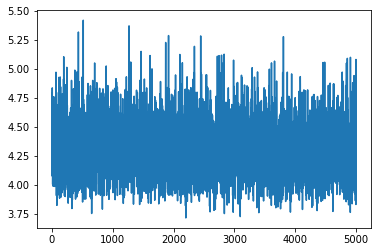

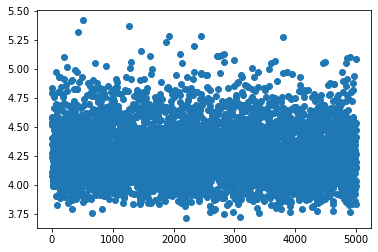

Iteration:  81%|████████████████▏   | 5100/6317 [1:44:47<27:25,  1.35s/it]

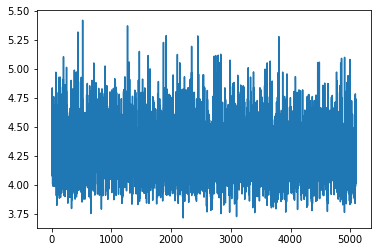

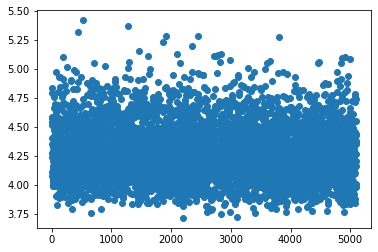

Iteration:  82%|████████████████▍   | 5200/6317 [1:46:56<25:53,  1.39s/it]

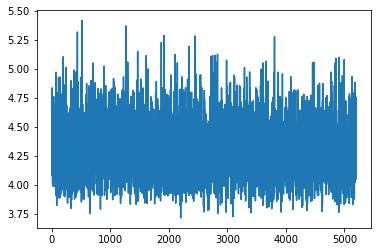

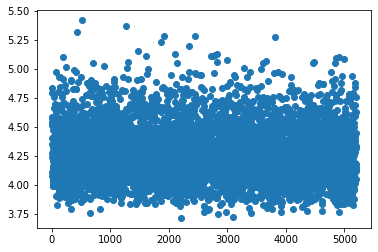

Iteration:  84%|████████████████▊   | 5300/6317 [1:48:56<22:17,  1.31s/it]

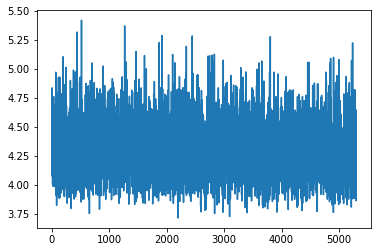

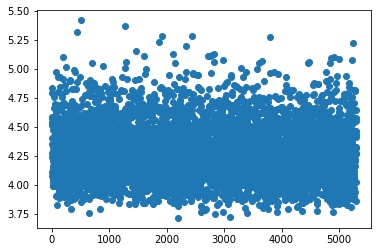

Iteration:  85%|█████████████████   | 5400/6317 [1:50:53<21:15,  1.39s/it]

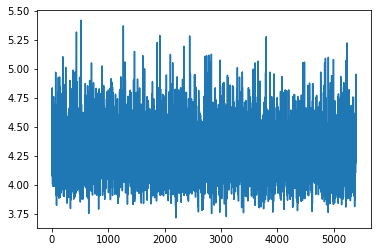

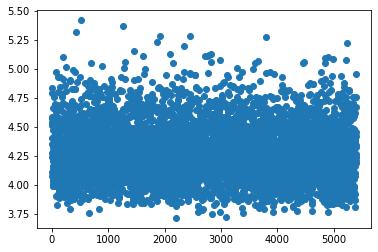

Iteration:  87%|█████████████████▍  | 5500/6317 [1:52:59<14:28,  1.06s/it]

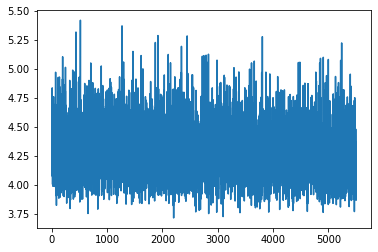

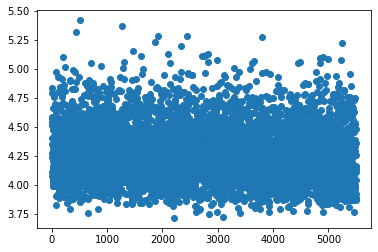

Iteration:  89%|█████████████████▋  | 5600/6317 [1:55:07<13:06,  1.10s/it]

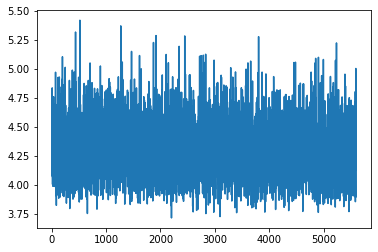

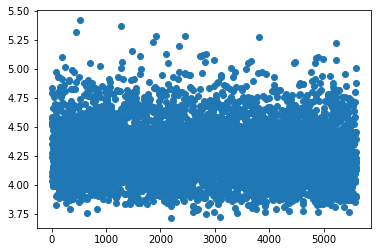

Iteration:  90%|██████████████████  | 5700/6317 [1:57:07<12:09,  1.18s/it]

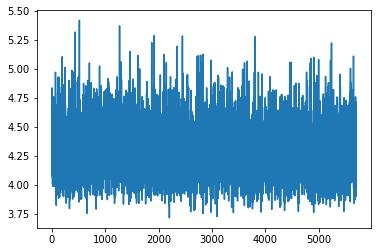

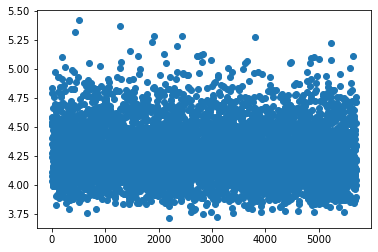

Iteration:  92%|██████████████████▎ | 5800/6317 [1:59:05<09:13,  1.07s/it]

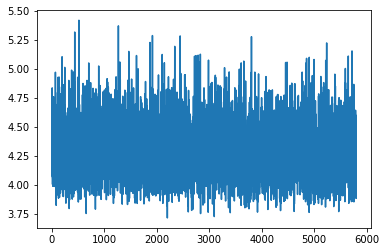

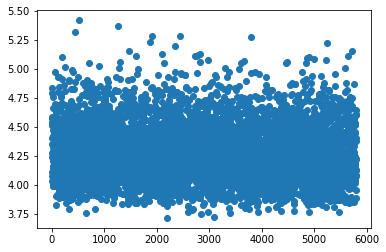

Iteration:  93%|██████████████████▋ | 5900/6317 [2:01:13<09:07,  1.31s/it]

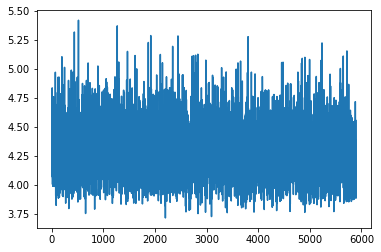

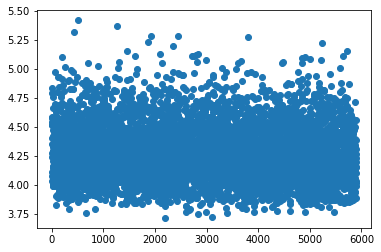

Iteration:  95%|██████████████████▉ | 6000/6317 [2:03:17<07:05,  1.34s/it]

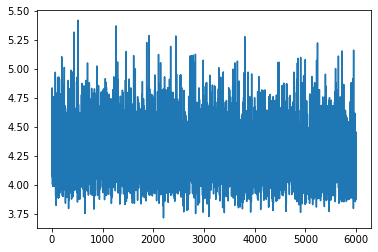

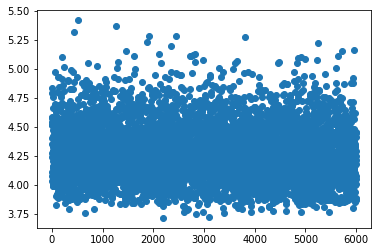

Iteration:  97%|███████████████████▎| 6100/6317 [2:05:18<03:52,  1.07s/it]

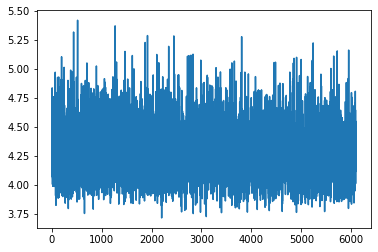

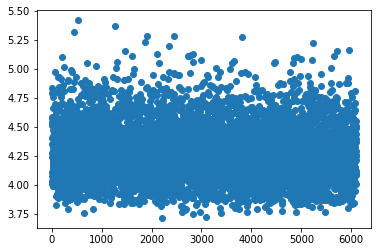

Iteration:  98%|███████████████████▋| 6200/6317 [2:07:23<02:05,  1.08s/it]

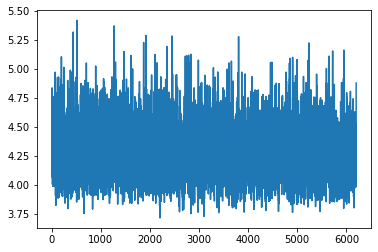

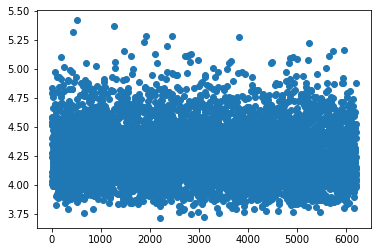

Iteration: 100%|███████████████████▉| 6300/6317 [2:09:27<00:20,  1.23s/it]

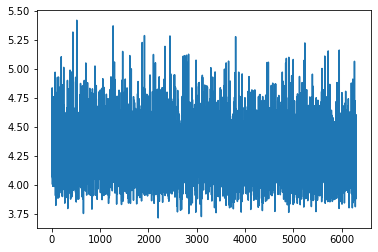

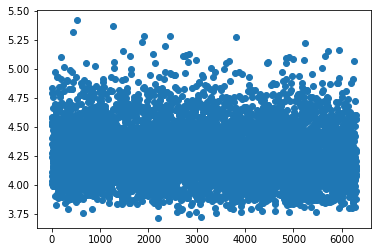

Iteration:   0%|                                 | 0/6317 [00:00<?, ?it/s]

Epoch loss 27036.819602012634
Epoch 4 complete, saving probes
Training epoch: 5


Iteration:   2%|▎                    | 100/6317 [02:05<1:55:12,  1.11s/it]

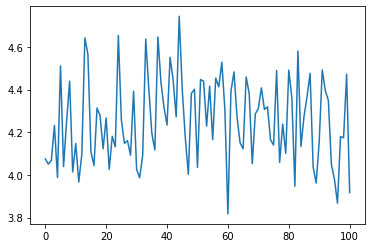

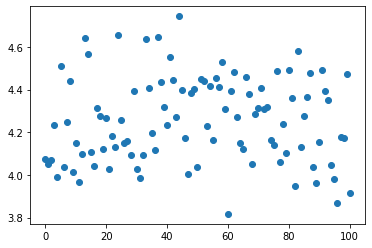

Iteration:   3%|▋                    | 200/6317 [04:09<2:29:30,  1.47s/it]

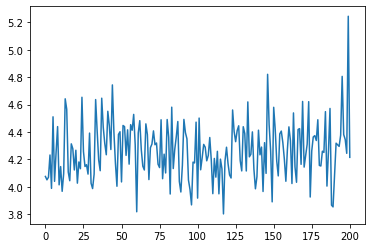

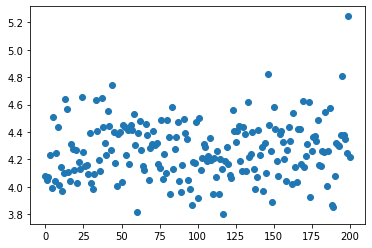

Iteration:   5%|▉                    | 300/6317 [06:12<2:05:14,  1.25s/it]

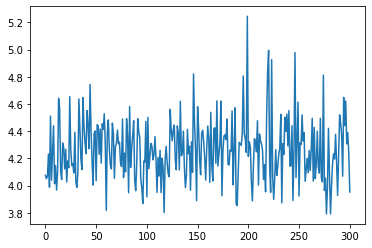

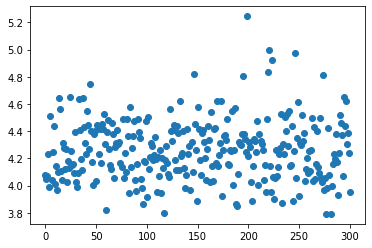

Iteration:   6%|█▎                   | 400/6317 [08:17<1:59:31,  1.21s/it]

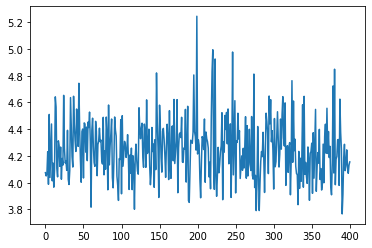

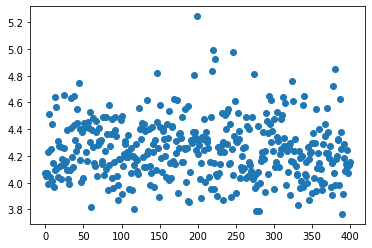

Iteration:   8%|█▋                   | 500/6317 [10:14<2:03:57,  1.28s/it]

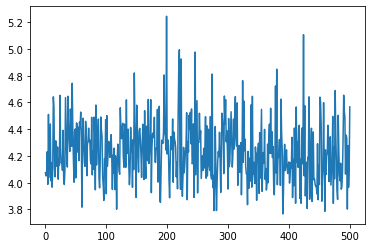

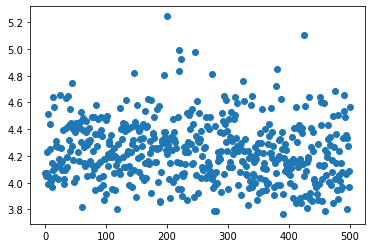

Iteration:   9%|█▉                   | 600/6317 [12:21<1:52:40,  1.18s/it]

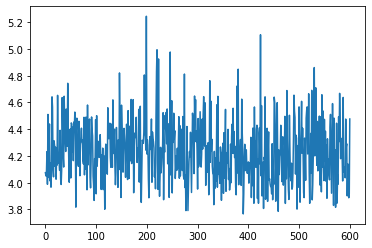

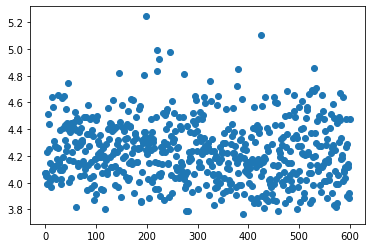

Iteration:  11%|██▎                  | 700/6317 [14:17<2:13:36,  1.43s/it]

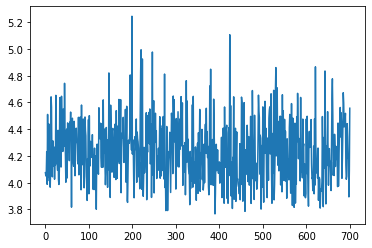

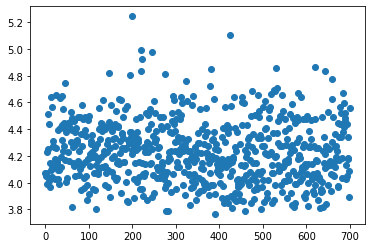

Iteration:  13%|██▋                  | 800/6317 [16:27<1:52:06,  1.22s/it]

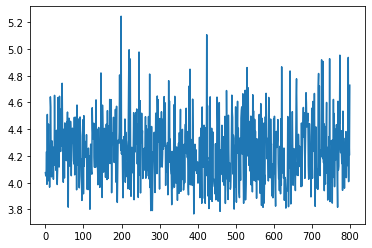

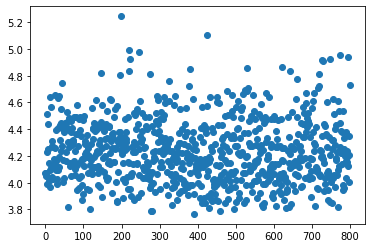

Iteration:  14%|██▉                  | 900/6317 [18:39<2:02:58,  1.36s/it]

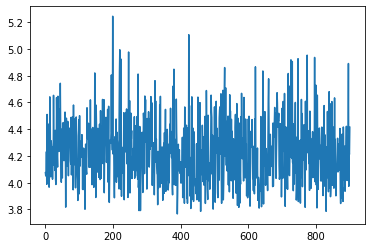

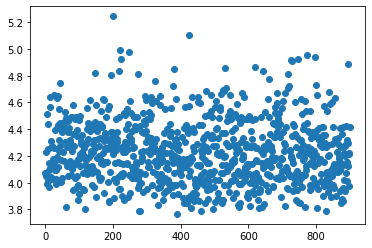

Iteration:  16%|███▏                | 1000/6317 [20:41<1:39:40,  1.12s/it]

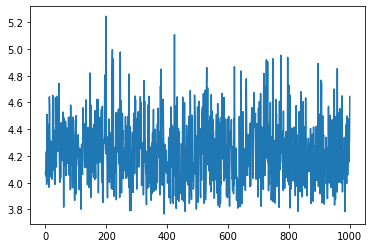

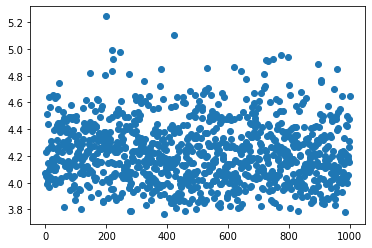

Iteration:  17%|███▍                | 1100/6317 [22:47<1:32:45,  1.07s/it]

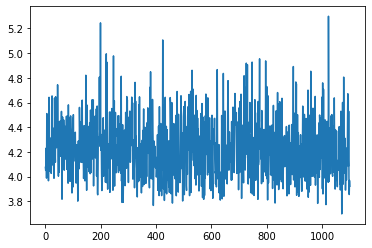

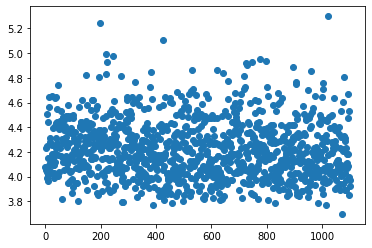

Iteration:  19%|███▊                | 1200/6317 [24:49<1:30:21,  1.06s/it]

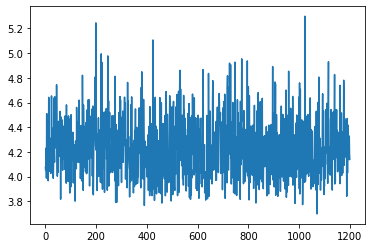

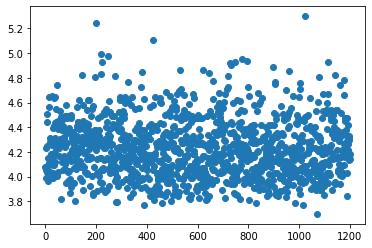

Iteration:  21%|████                | 1300/6317 [26:59<1:34:26,  1.13s/it]

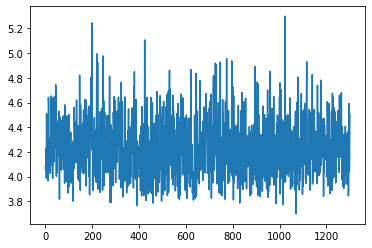

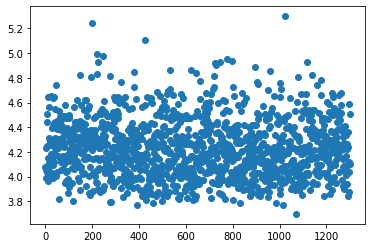

Iteration:  22%|████▍               | 1400/6317 [29:01<1:27:40,  1.07s/it]

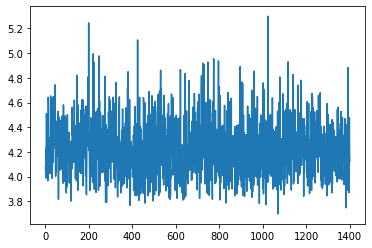

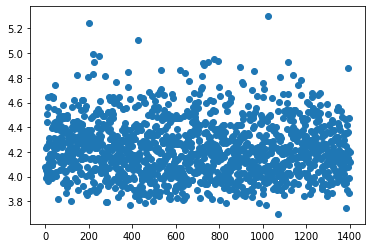

Iteration:  24%|████▋               | 1500/6317 [31:08<1:46:42,  1.33s/it]

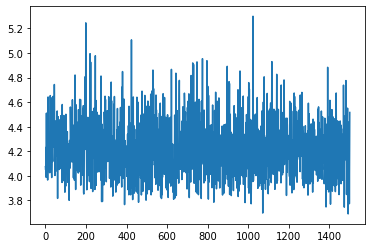

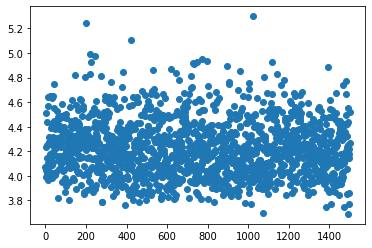

Iteration:  25%|█████               | 1600/6317 [33:11<1:50:50,  1.41s/it]

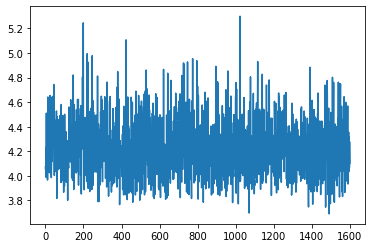

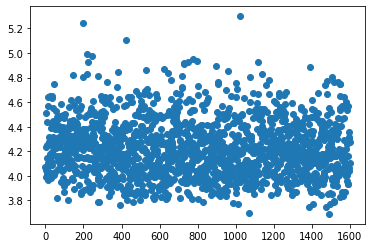

Iteration:  27%|█████▍              | 1700/6317 [35:10<1:36:32,  1.25s/it]

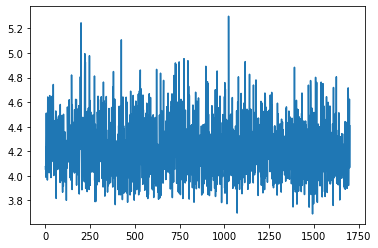

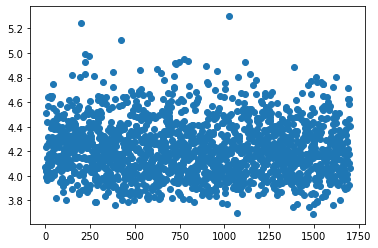

Iteration:  28%|█████▋              | 1800/6317 [37:19<1:48:53,  1.45s/it]

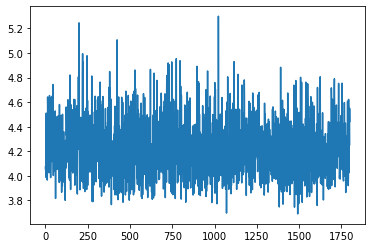

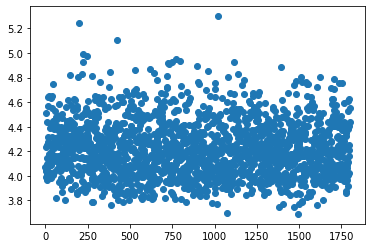

Iteration:  30%|██████              | 1900/6317 [39:16<1:34:19,  1.28s/it]

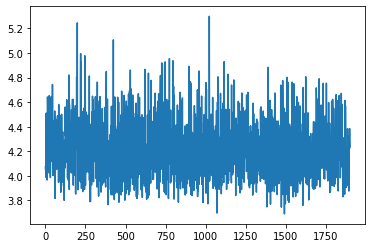

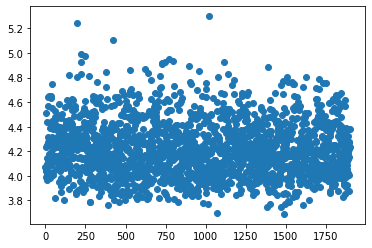

Iteration:  32%|██████▎             | 2000/6317 [41:27<1:16:50,  1.07s/it]

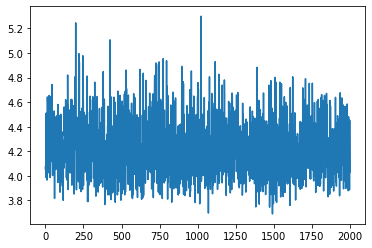

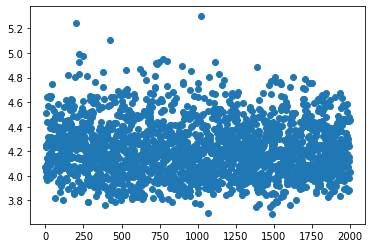

Iteration:  33%|██████▋             | 2100/6317 [43:31<1:43:33,  1.47s/it]

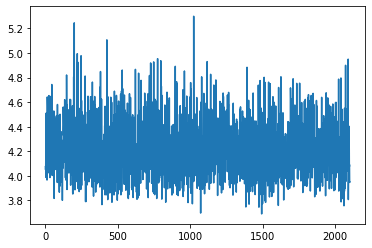

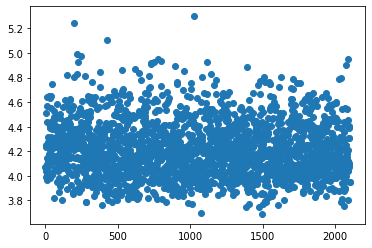

Iteration:  35%|██████▉             | 2200/6317 [45:39<1:38:20,  1.43s/it]

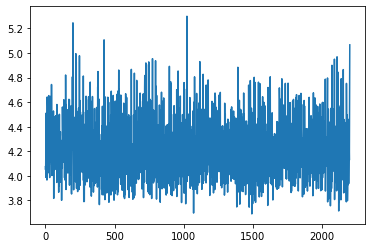

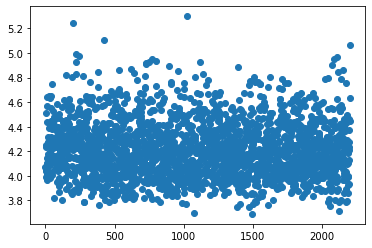

Iteration:  36%|███████▎            | 2300/6317 [47:38<1:15:49,  1.13s/it]

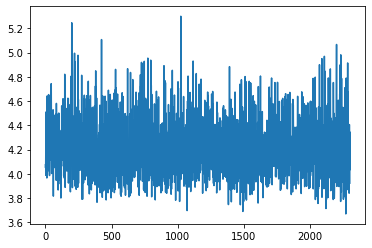

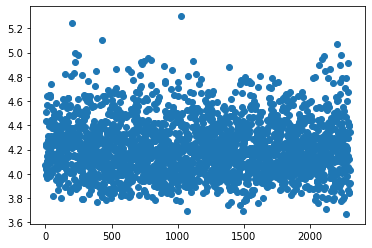

Iteration:  38%|███████▌            | 2400/6317 [49:42<1:10:13,  1.08s/it]

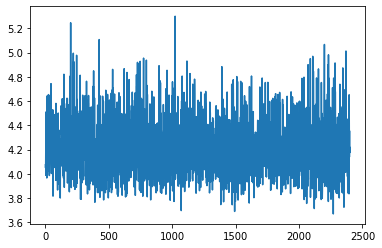

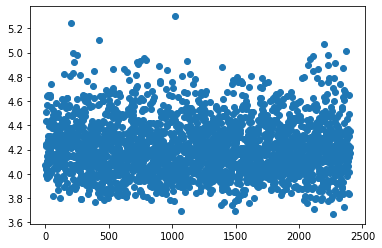

Iteration:  40%|███████▉            | 2500/6317 [51:39<1:27:09,  1.37s/it]

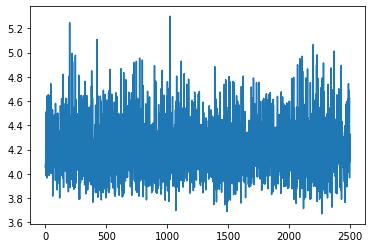

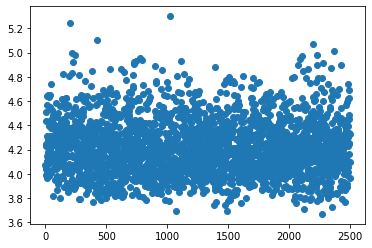

Iteration:  41%|████████▏           | 2600/6317 [53:41<1:27:18,  1.41s/it]

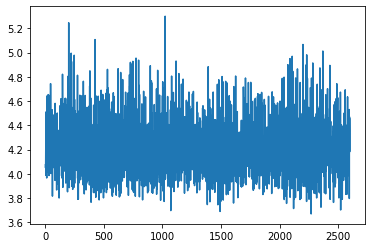

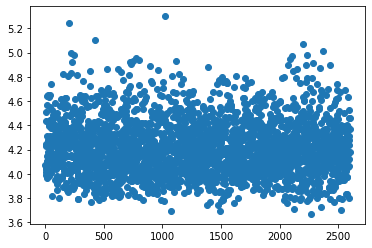

Iteration:  43%|████████▌           | 2700/6317 [55:41<1:21:38,  1.35s/it]

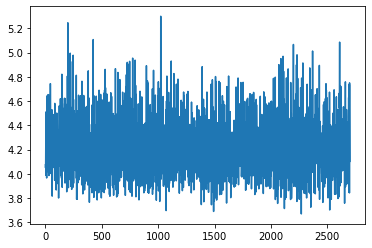

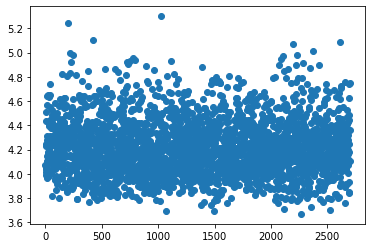

Iteration:  44%|████████▊           | 2800/6317 [57:47<1:12:30,  1.24s/it]

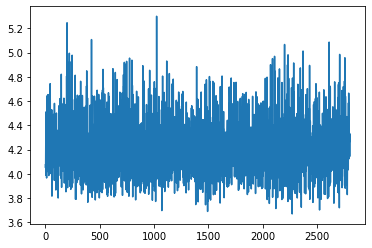

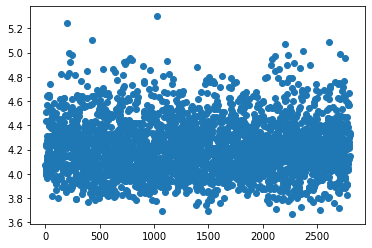

Iteration:  46%|█████████▏          | 2900/6317 [59:53<1:21:52,  1.44s/it]

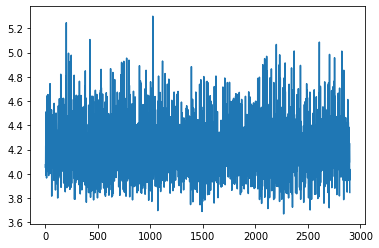

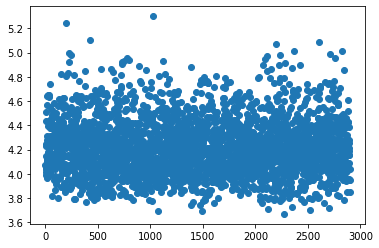

Iteration:  47%|████████▌         | 3000/6317 [1:01:57<1:14:59,  1.36s/it]

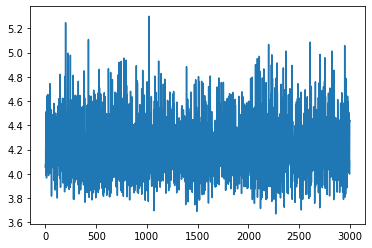

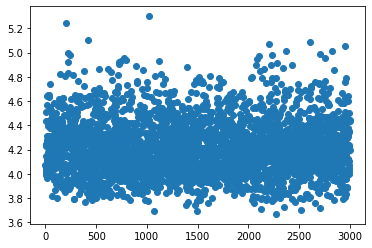

Iteration:  49%|████████▊         | 3100/6317 [1:03:55<1:17:45,  1.45s/it]

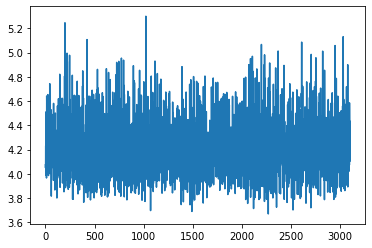

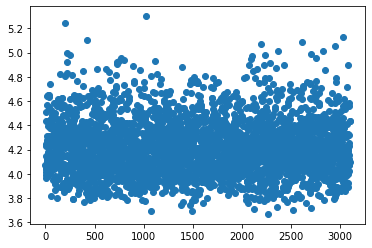

Iteration:  51%|█████████         | 3200/6317 [1:05:53<1:13:19,  1.41s/it]

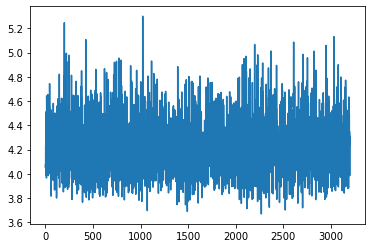

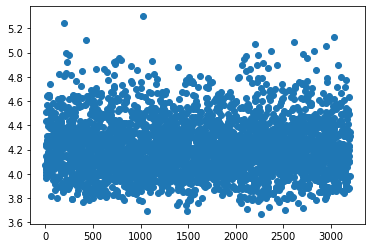

Iteration:  52%|██████████▍         | 3300/6317 [1:07:59<58:44,  1.17s/it]

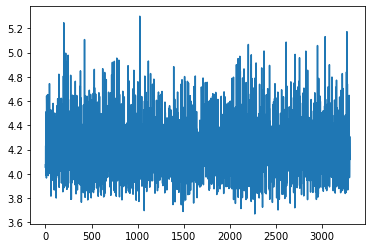

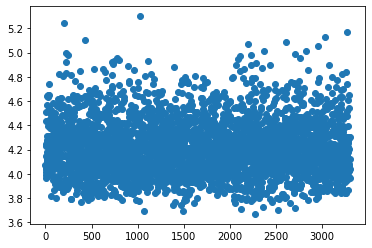

Iteration:  54%|██████████▊         | 3400/6317 [1:09:57<51:58,  1.07s/it]

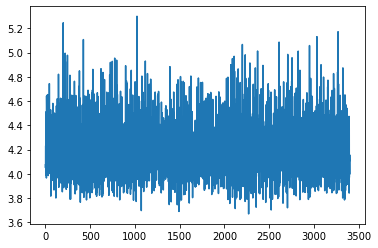

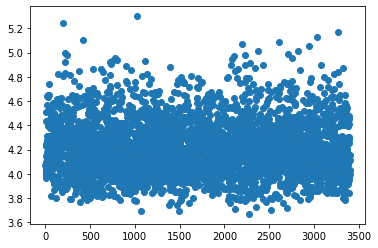

Iteration:  55%|█████████▉        | 3500/6317 [1:12:02<1:09:15,  1.48s/it]

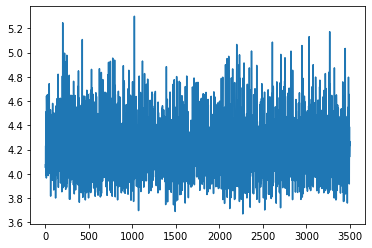

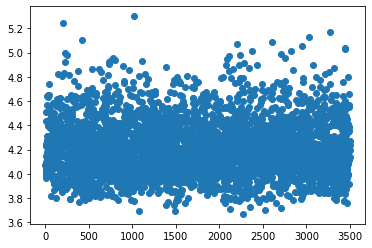

Iteration:  57%|███████████▍        | 3600/6317 [1:14:04<57:20,  1.27s/it]

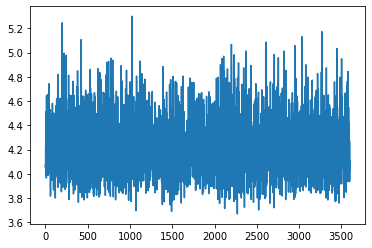

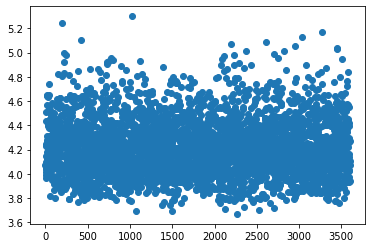

Iteration:  59%|███████████▋        | 3700/6317 [1:16:10<59:30,  1.36s/it]

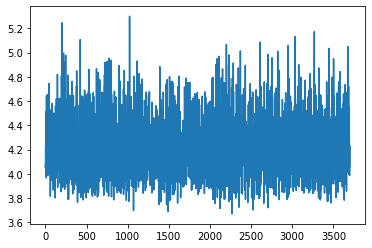

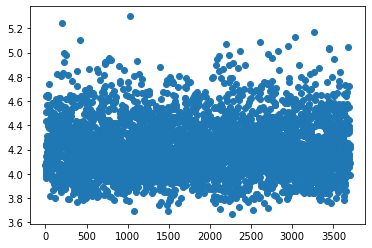

Iteration:  60%|████████████        | 3800/6317 [1:18:09<51:38,  1.23s/it]

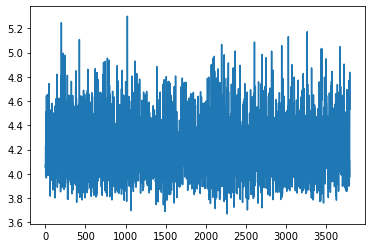

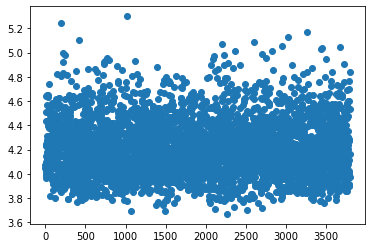

Iteration:  62%|████████████▎       | 3900/6317 [1:20:08<57:39,  1.43s/it]

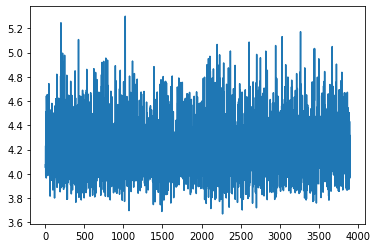

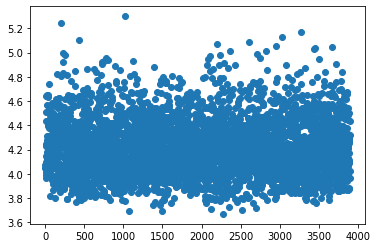

Iteration:  63%|████████████▋       | 4000/6317 [1:22:03<41:02,  1.06s/it]

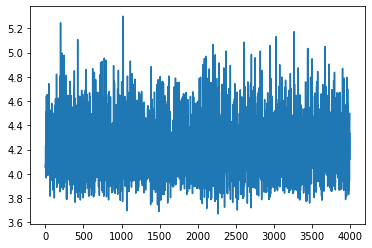

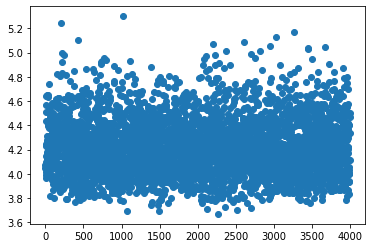

Iteration:  65%|████████████▉       | 4100/6317 [1:24:00<47:33,  1.29s/it]

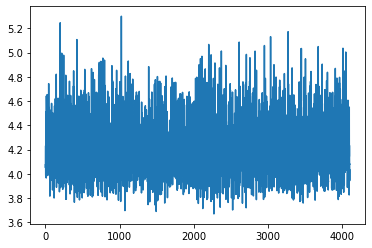

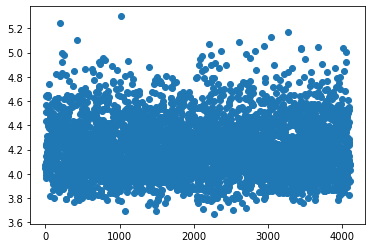

Iteration:  66%|█████████████▎      | 4200/6317 [1:25:59<37:37,  1.07s/it]

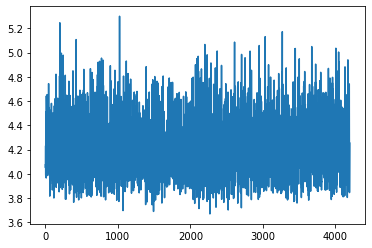

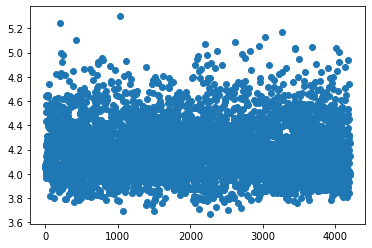

Iteration:  68%|█████████████▌      | 4300/6317 [1:28:05<47:54,  1.43s/it]

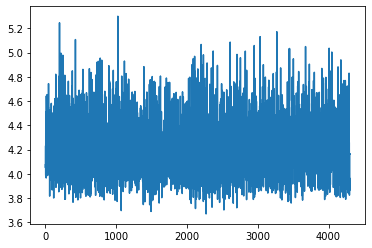

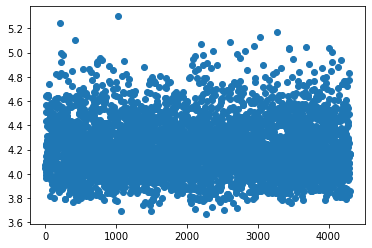

Iteration:  70%|█████████████▉      | 4400/6317 [1:29:57<40:43,  1.27s/it]

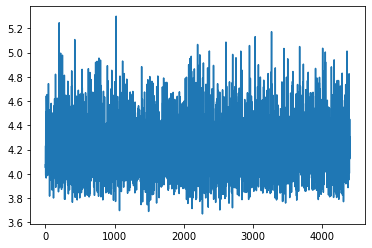

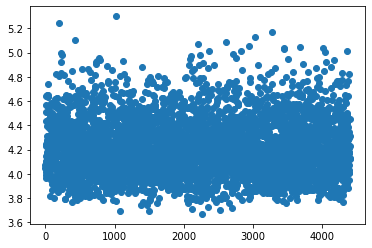

Iteration:  71%|██████████████▏     | 4500/6317 [1:31:54<44:39,  1.47s/it]

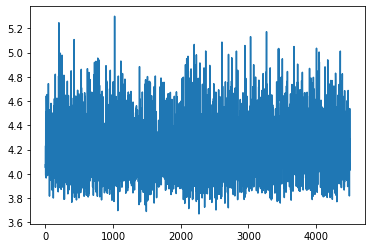

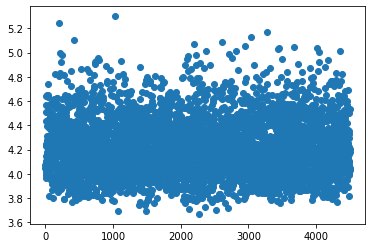

Iteration:  73%|██████████████▌     | 4600/6317 [1:33:53<39:08,  1.37s/it]

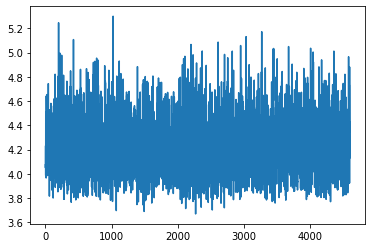

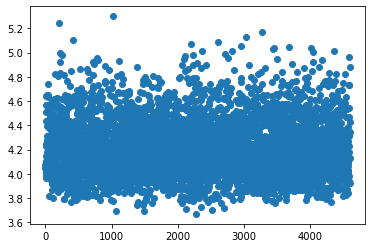

Iteration:  74%|██████████████▉     | 4700/6317 [1:35:48<33:56,  1.26s/it]

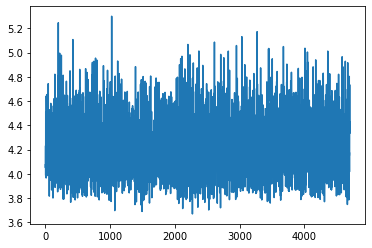

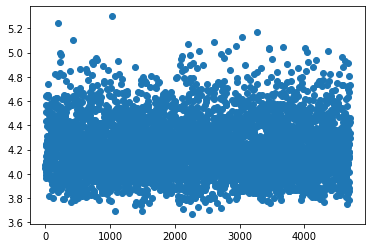

Iteration:  76%|███████████████▏    | 4800/6317 [1:37:43<26:50,  1.06s/it]

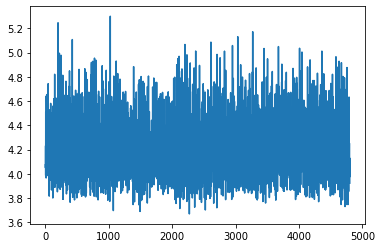

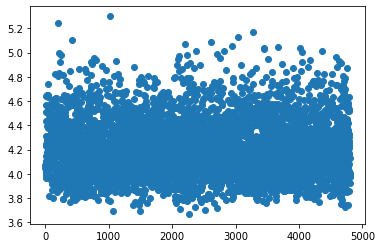

Iteration:  78%|███████████████▌    | 4900/6317 [1:39:39<26:54,  1.14s/it]

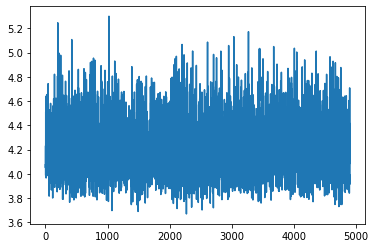

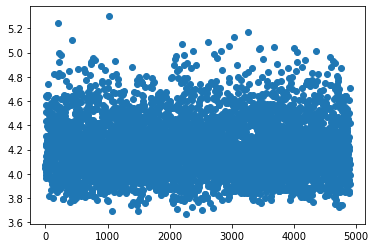

Iteration:  79%|███████████████▊    | 5000/6317 [1:41:36<23:14,  1.06s/it]

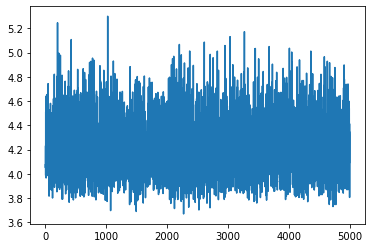

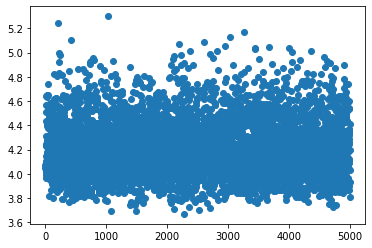

Iteration:  81%|████████████████▏   | 5100/6317 [1:43:35<21:36,  1.07s/it]

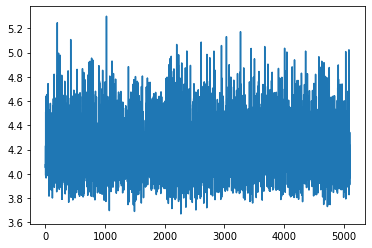

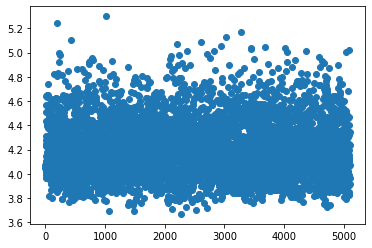

Iteration:  82%|████████████████▍   | 5200/6317 [1:45:38<25:45,  1.38s/it]

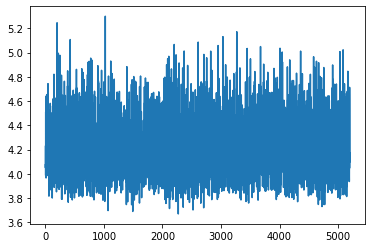

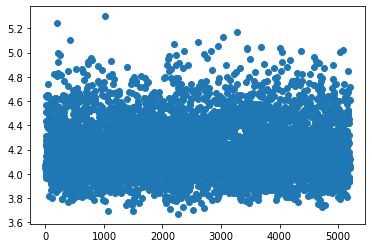

Iteration:  84%|████████████████▊   | 5300/6317 [1:47:45<24:01,  1.42s/it]

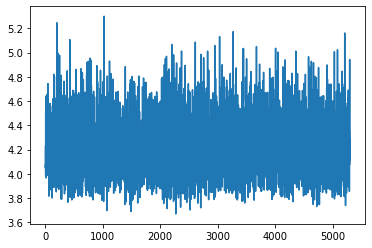

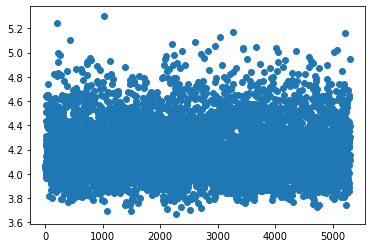

Iteration:  85%|█████████████████   | 5400/6317 [1:49:51<19:04,  1.25s/it]

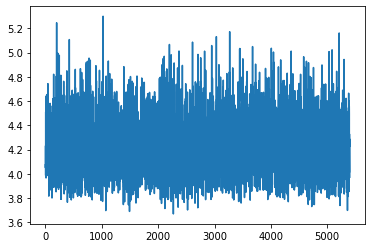

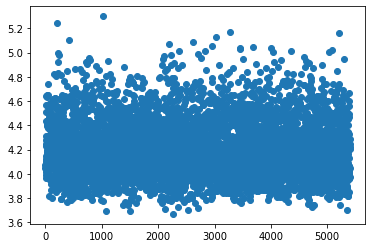

Iteration:  87%|█████████████████▍  | 5500/6317 [1:51:49<15:24,  1.13s/it]

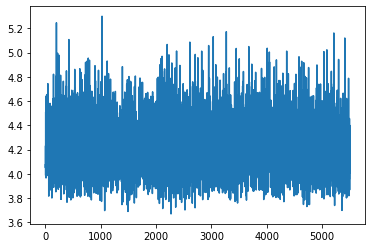

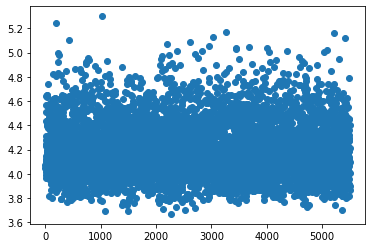

Iteration:  89%|█████████████████▋  | 5600/6317 [1:53:53<14:42,  1.23s/it]

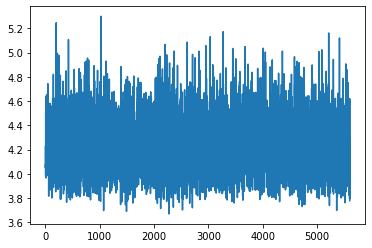

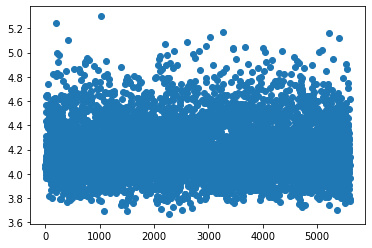

Iteration:  90%|██████████████████  | 5700/6317 [1:55:46<12:55,  1.26s/it]

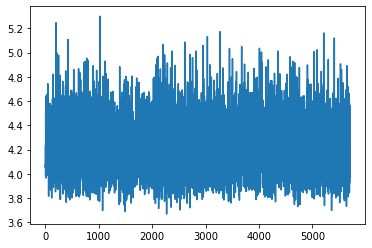

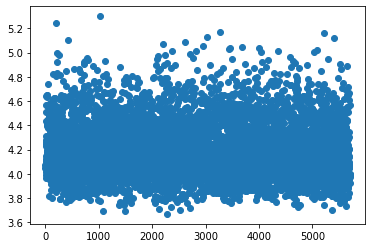

Iteration:  92%|██████████████████▎ | 5800/6317 [1:57:55<12:38,  1.47s/it]

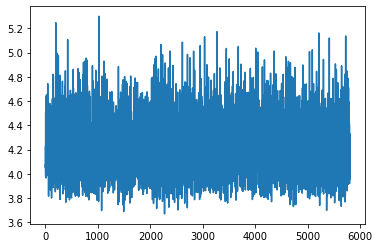

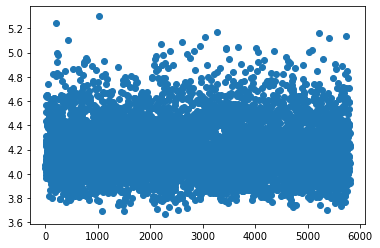

Iteration:  93%|██████████████████▋ | 5900/6317 [1:59:58<10:12,  1.47s/it]

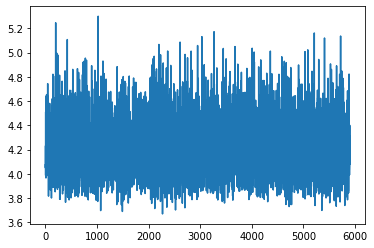

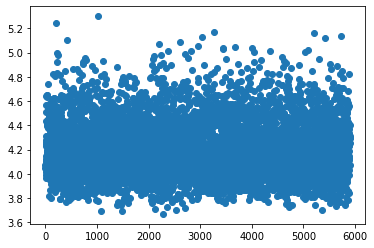

Iteration:  95%|██████████████████▉ | 6000/6317 [2:02:06<08:48,  1.67s/it]

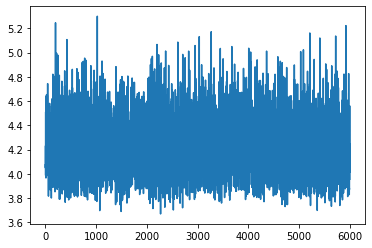

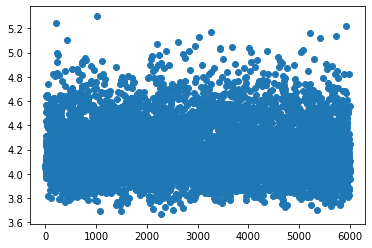

Iteration:  97%|███████████████████▎| 6100/6317 [2:04:08<04:06,  1.13s/it]

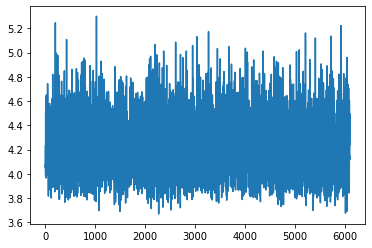

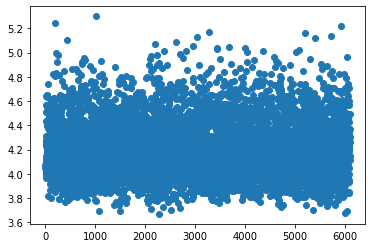

Iteration:  98%|███████████████████▋| 6200/6317 [2:06:07<02:18,  1.18s/it]

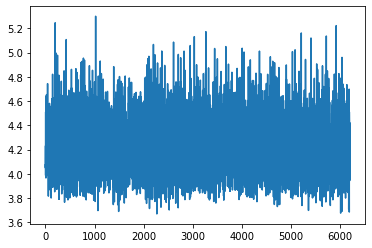

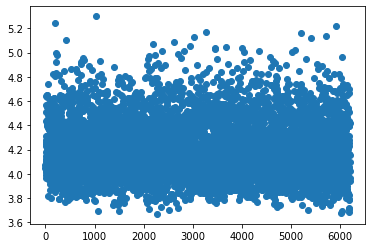

Iteration: 100%|███████████████████▉| 6300/6317 [2:08:12<00:25,  1.47s/it]

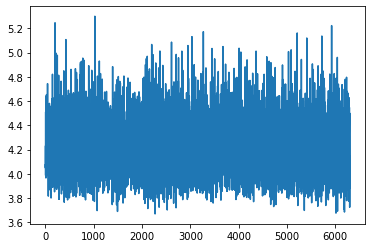

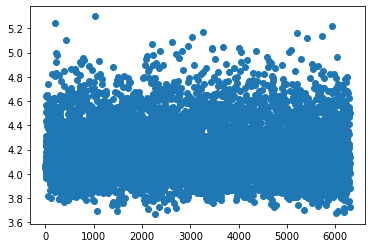

Iteration: 100%|████████████████████| 6317/6317 [2:08:35<00:00,  1.22s/it]

Epoch loss 26621.256694316864
Epoch 5 complete, saving probes


In [9]:
# Training epochs
for epoch in range(epochs):
    
    # create each epochs folder    
    epoch_dir = "results"+"/"+ model_prefix + "/"+"epoch_" + str(epoch + 1)
    if not os.path.exists(epoch_dir):
        os.mkdir(epoch_dir)
    
    print("Training epoch: {}".format(epoch+1))
    adaptor_s.train()
    adaptor_e.train()

    # Track epoch loss
    epoch_loss = 0

    # Initialize train data loader
    train_sampler = RandomSampler(train_dataset)
    train_dataloader = DataLoader(train_dataset, sampler = train_sampler, batch_size = batch_size)
    loss_list = []
    
    iter=0
    for batch in tqdm(train_dataloader, desc = "Iteration"):
        
        # Get batch on the right device and prepare input dict
        batch = tuple(t.to(device) for t in batch)

        inputs = {
            "input_ids": batch[0],
            "attention_mask": batch[1],
            "token_type_ids": batch[2],
            "start_positions": batch[3],
            "end_positions": batch[4],
        }

        # BERT forward pass
        model.eval()
        with torch.no_grad():
            outputs = model(**inputs)

        # Extract hiddent states
        all_layer_hidden_states = outputs[3][1:] # (layers, batch_size, max_seq_len, hidden_size)
        # Get labels, and update probes for batch
        start_targets = batch[3] # (batch_size)
        end_targets  = batch[4] # (batch_size)
        
        # in: (layers, batch_size, max_seq_len, hidden_size)
        # out: (layers, batch_size, max_seq_len, 1)
#         print(torch.stack(list(all_layer_hidden_states)).size())# ->　torch.Size([12, 8, 384, 768])
        s_scores = adaptor_s(list(all_layer_hidden_states)).squeeze() 
#         print(s_scores.size())
        e_scores = adaptor_e(list(all_layer_hidden_states)).squeeze()      
        
        ignored_index = s_scores.size(1)
        size_of_batch = s_scores.size(0)
        # print(ignored_index) 384
        s_scores.clamp_(0, ignored_index) # (8, 384)
        e_scores.clamp_(0, ignored_index) # (8, 384)
        
        start_loss = nn.CrossEntropyLoss(
            weight = None, ignore_index=ignored_index)(s_scores, start_targets)
        end_loss = nn.CrossEntropyLoss(
            weight = None, ignore_index=ignored_index)(e_scores, end_targets)

        loss = (1.5*start_loss+end_loss)/2.5
        
        loss.backward()
        
        torch.nn.utils.clip_grad_norm_(
            adaptor_s.parameters(), max_grad_norm)
        torch.nn.utils.clip_grad_norm_(
            adaptor_e.parameters(), max_grad_norm)

        start_optimizer.step()
        end_optimizer.step()

        adaptor_s.zero_grad()
        adaptor_e.zero_grad()
        
        batch_loss = float(loss)
        loss_list.append(batch_loss)
        
        if (iter != 0 and iter%100==0):
            plt.plot(loss_list)
            plt.show()
            plt.plot(loss_list,'o')
            plt.show()
        
        epoch_loss+=batch_loss
        iter+=1
        
        # store min loss's hidden state
        if iter % 100 == 0:
            torch.save(adaptor_s.state_dict(), epoch_dir + "/" + "_start_idx_per100")
            torch.save(adaptor_e.state_dict(), epoch_dir + "/" + "_end_idx_per100")
        if batch_loss < min_loss:
            torch.save(adaptor_s.state_dict(), epoch_dir + "/" + "_start_idx")
            torch.save(adaptor_e.state_dict(), epoch_dir + "/" + "_end_idx")
            min_loss = batch_loss        

    print("Epoch loss {}".format(epoch_loss))
    print("Epoch {} complete, saving probes".format(epoch+1))